## Libraries

In [1]:
import pandas as pd
import plotly.express as px
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
%matplotlib inline

The following settings will improve the default style and font sizes for our charts.

In [2]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

## Step 1 - Download and Explore the Data


In [3]:
Xco2_L3_df = pd.read_csv('C:/Users/Ochibobo/Measuring_Carbon/csv_files/L3/Xco2_L3_2015_to_22.csv')

In [4]:
Xco2_L3_df

,longitude,latitude,xco2,Year,Month
0,-180.000,-90.0,394.634441,2015,January
1,-180.000,-89.5,394.612467,2015,January
2,-180.000,-89.0,394.587501,2015,January
3,-180.000,-88.5,394.566608,2015,January
4,-180.000,-88.0,394.563475,2015,January
...,...,...,...,...,...
17882491,179.375,88.0,419.348985,2022,February
17882492,179.375,88.5,419.363277,2022,February
17882493,179.375,89.0,419.358291,2022,February
17882494,179.375,89.5,419.332850,2022,February


### Scatter Plot

CPU times: total: 1.5 s
Wall time: 1.55 s


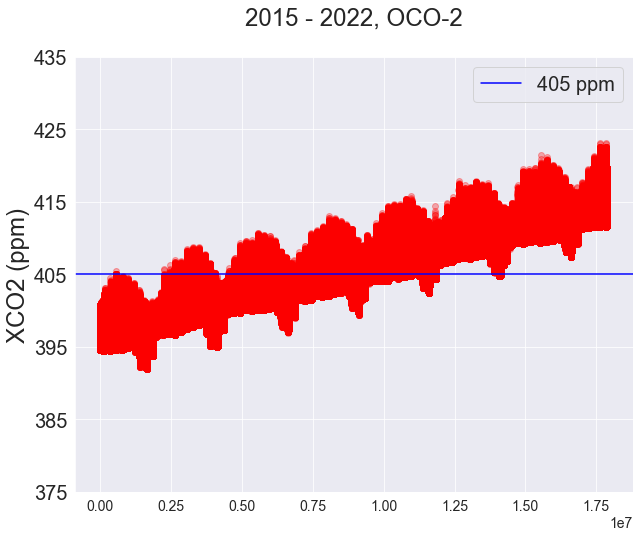

In [5]:
%%time
plt.scatter(x=np.arange(0, len(Xco2_L3_df)), y= Xco2_L3_df["xco2"], c='red', alpha=0.30 )
plt.axhline(y= 405, color='blue', label= '405 ppm')
plt.yticks(np.arange(375, 445, 10), fontsize= 20)
plt.title('2015 - 2022, OCO-2\n', fontsize= 24)
plt.legend(loc= 'upper right', prop={'size': 20})
plt.ylabel('XCO2 (ppm)', fontsize= 24)
plt.gcf().set_size_inches(10,8);

## Global average annual xco2 emissions

In [6]:
global_xco2_avg = Xco2_L3_df[['xco2', 'Year']].groupby(['Year']).mean().reset_index()
global_xco2_avg

,Year,xco2
0,2015,398.467399
1,2016,401.616738
2,2017,403.898588
3,2018,406.188272
4,2019,408.728774
5,2020,411.255476
6,2021,413.595746
7,2022,415.749999


### PPM to gtCO2

Using 5.137 x 10^18 kg as the mass of the atmosphere we know that 1 PPMV CO2=7.81 Gt CO2.

[Skeptical Science](https://skepticalscience.com/print.php?r=45)

Note that the conversion is different for Gigatonnes of Carbon Dioxide emissions, because natural sinks (ocean and biosphere) absorb approximately 55% of human emissions, so the "airborne fraction" added to the atmosphere is about 45%.  This means 1ppm = 17.3 Gigatonnes of Carbon Dioxide emissions.

In [7]:
global_xco2_avg['Gt_Co2'] = global_xco2_avg['xco2'] * 7.81
global_xco2_avg

,Year,xco2,Gt_Co2
0,2015,398.467399,3112.030387
1,2016,401.616738,3136.626722
2,2017,403.898588,3154.447969
3,2018,406.188272,3172.330406
4,2019,408.728774,3192.171727
5,2020,411.255476,3211.905264
6,2021,413.595746,3230.182778
7,2022,415.749999,3247.007492


## Global Power plant Databases

In [8]:
import pandas as pd

POWER_PLANT_URL = (
    "https://raw.githubusercontent.com/MarcSkovMadsen/awesome-streamlit/master/"
    "gallery/global_power_plant_database/global_power_plant_database.csv"
)

pp_data = pd.read_csv(POWER_PLANT_URL)
pp_data.head()

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,url,geolocation_source,wepp_id,year_of_capacity_data,generation_gwh_2013,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh
0,AFG,Afghanistan,Kajaki Hydroelectric Power Plant Afghanistan,GEODB0040538,33.00,32.3220,65.1190,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009793,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
1,AFG,Afghanistan,Mahipar Hydroelectric Power Plant Afghanistan,GEODB0040541,66.00,34.5560,69.4787,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009795,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
2,AFG,Afghanistan,Naghlu Dam Hydroelectric Power Plant Afghanistan,GEODB0040534,100.00,34.6410,69.7170,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009797,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
3,AFG,Afghanistan,Nangarhar (Darunta) Hydroelectric Power Plant ...,GEODB0040536,11.55,34.4847,70.3633,Hydro,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,1009787,2017.0,NaN,NaN,NaN,NaN,NaN,NaN
4,AFG,Afghanistan,Northwest Kabul Power Plant Afghanistan,GEODB0040540,42.00,34.5638,69.1134,Gas,NaN,NaN,...,http://globalenergyobservatory.org,GEODB,NaN,2017.0,NaN,NaN,NaN,NaN,NaN,NaN


In [9]:
pp_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 29910 entries, 0 to 29909
Data columns (total 24 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   country                   29910 non-null  object 
 1   country_long              29910 non-null  object 
 2   name                      29910 non-null  object 
 3   gppd_idnr                 29910 non-null  object 
 4   capacity_mw               29910 non-null  float64
 5   latitude                  29910 non-null  float64
 6   longitude                 29910 non-null  float64
 7   primary_fuel              29910 non-null  object 
 8   other_fuel1               1963 non-null   object 
 9   other_fuel2               303 non-null    object 
 10  other_fuel3               104 non-null    object 
 11  commissioning_year        16303 non-null  float64
 12  owner                     19531 non-null  object 
 13  source                    29895 non-null  object 
 14  url   

### Create an interactive application to explore the location and types of power plants globally.

In [10]:
import param
import panel as pn
import pydeck as pdk
pn.extension('deckgl', sizing_mode="stretch_width")

In [11]:
MAPBOX_KEY = "pk.eyJ1IjoibWl0Y2hlbGxvZGlsaSIsImEiOiJjbDZkeDd4aGcwMXo0M2tvMjV1dmJ5aDFpIn0.pQ13ACndelMgJQSIYjhVIw"

### Clean the data as PyDeck does not handle NA data well

In [12]:
pp_data.primary_fuel = pp_data.primary_fuel.fillna("NA")
# pp_data.capacity_mw = pp_data.capacity_mw.fillna(1)

### Transform the data

In [13]:
FUEL_COLORS = {
    "Oil": "black",
    "Solar": "green",
    "Gas": "black",
    "Other": "gray",
    "Hydro": "blue",
    "Coal": "black",
    "Petcoke": "black",
    "Biomass": "green",
    "Waste": "green",
    "Cogeneration": "gray",
    "Storage": "orange",
    "Wind": "green",
}

COLORS_R = {"black": 0, "green": 0, "blue": 0, "orange": 255, "gray": 128}
COLORS_G = {"black": 0, "green": 128, "blue": 0, "orange": 165, "gray": 128}
COLORS_B = {"black": 0, "green": 0, "blue": 255, "orange": 0, "gray": 128}

pp_data["primary_fuel_color"] = pp_data.primary_fuel.map(FUEL_COLORS)
pp_data["primary_fuel_color"] = pp_data["primary_fuel_color"].fillna("gray")
pp_data["color_r"] = pp_data["primary_fuel_color"].map(COLORS_R)
pp_data["color_g"] = pp_data["primary_fuel_color"].map(COLORS_G)
pp_data["color_b"] = pp_data["primary_fuel_color"].map(COLORS_B)
pp_data["color_a"] = 140

# "name", "primary_fuel", "capacity_mw",
pp_data_g = pp_data[[
    "latitude","longitude", "name", "capacity_mw",
    "color_r","color_g","color_b","color_a",]
]
pp_data_g.head(1)

,latitude,longitude,name,capacity_mw,color_r,color_g,color_b,color_a
0,32.322,65.119,Kajaki Hydroelectric Power Plant Afghanistan,33.0,0,0,255,140


## Create the app
Here we create a parameterized class which creates a PyDeck plot in the constructor and connects it to some parameters.

In [14]:
class GlobalPowerPlantDatabaseApp(param.Parameterized):
    
    data = param.DataFrame(pp_data, precedence=-1)

    opacity = param.Number(default=0.8, step=0.05, bounds=(0, 1))
    
    pitch = param.Number(default=0, bounds=(0, 90))
    
    zoom = param.Integer(default=1, bounds=(1, 10))
    
    def __init__(self, **params):
        super(GlobalPowerPlantDatabaseApp, self).__init__(**params)
        self._view_state = pdk.ViewState(
            latitude=52.2323,
            longitude=-1.415,
            zoom=self.zoom,
            min_zoom=self.param.zoom.bounds[0],
            max_zoom=self.param.zoom.bounds[1],
        )
        self._scatter = pdk.Layer(
            "ScatterplotLayer",
            data=self.data,
            get_position=["longitude", "latitude"],
            get_fill_color="[color_r, color_g, color_b, color_a]",
            get_radius="capacity_mw*10",
            pickable=True,
            opacity=self.opacity,
            filled=True,
            wireframe=True,
        )
        self._deck = pdk.Deck(
            map_style="mapbox://styles/mapbox/light-v9",
            initial_view_state=self._view_state,
            layers=[self._scatter],
            tooltip=True,
            api_keys={'mapbox': MAPBOX_KEY},
        )
        self.pane = pn.pane.DeckGL(self._deck, sizing_mode="stretch_width", height=700)
        self.param.watch(self._update, ['data', 'opacity', 'pitch', 'zoom'])

    @pn.depends('pane.hover_state', 'data')
    def _info(self):
        index = self.pane.hover_state.get('index', -1)
        if index == -1:
            index = slice(0, 0)
        return self.data.iloc[index][['name', 'capacity_mw']]

    @pn.depends('pane.view_State', watch=True)
    def _update(self):
        state = self.pane.view_state
        self._view_state.longitude = state['longitude']
        self._view_state.latitude = state['latitude']   

    def _update(self, event):
        if event.name == 'data':
            self._scatter.data = self.data
        if event.name == 'opacity':
            self._scatter.opacity = self.opacity
        if event.name == 'zoom':
            self._view_state.zoom = self.zoom
        if event.name == 'pitch':
            self._view_state.pitch = self.pitch
        self.pane.param.trigger('object')
    
    def view(self):
        return pn.Row(pn.Column(self.param, pn.panel(self._info, height=200)), self.pane)

component = GlobalPowerPlantDatabaseApp()
component.view()

Row(sizing_mode='stretch_width')
    [0] Column(sizing_mode='stretch_width')
        [0] Column(margin=5, name='GlobalPowerPlantDatabaseA..., sizing_mode='stretch_width', width=300)
            [0] StaticText(sizing_mode='stretch_width', value='<b>GlobalPowerPlantDataba...)
            [1] FloatSlider(name='Opacity', sizing_mode='stretch_width', step=0.05, value=0.8)
            [2] FloatSlider(end=90, name='Pitch', sizing_mode='stretch_width')
            [3] IntSlider(end=10, name='Zoom', sizing_mode='stretch_width', start=1, value=1)
        [1] ParamMethod(method, height=200, sizing_mode='stretch_width')
    [1] DeckGL(Deck, height=700, sizing_mode='stretch_width')

In [15]:
#Check Year of capacity
pp_data['year_of_capacity_data'].value_counts()

2017.0    12015
2016.0      781
2018.0      566
2015.0      281
2000.0       58
2014.0       20
2013.0       14
2012.0        6
2009.0        1
2010.0        1
Name: year_of_capacity_data, dtype: int64

## Explore Generation Data

In [16]:
# Check generation data
pp_data.dropna(subset = ['generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'])['country_long'].value_counts()

United States of America    7173
India                        410
Australia                    226
Name: country_long, dtype: int64

Pick `India` for analysis

### India

### Capacity distribution

In [17]:
India_cap_data = pp_data[pp_data['country_long'] == 'India'].sort_values(by = ['capacity_mw','generation_gwh_2014'] , ascending = False)
India_cap_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2014,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a
12924,IND,India,VINDH_CHAL STPS,IND0000503,4760.0,24.0983,82.6719,Coal,Oil,NaN,...,27594.0,29047.0,30015.0,35116.0,NaN,black,0,0,0,140
12558,IND,India,MUNDRA TPP,IND0000278,4620.0,22.8230,69.5532,Coal,Oil,NaN,...,28127.0,30539.0,28078.0,20311.0,NaN,black,0,0,0,140
12559,IND,India,MUNDRA UMPP,IND0000279,4000.0,22.8158,69.5281,Coal,Oil,NaN,...,24501.0,23679.0,25303.0,24599.0,NaN,black,0,0,0,140
12753,IND,India,SASAN UMPP,IND0000395,3960.0,23.9784,82.6275,Coal,Oil,NaN,...,15069.0,29342.0,27671.0,29909.0,NaN,black,0,0,0,140
12854,IND,India,TIRORA TPP,IND0000457,3300.0,21.4129,79.9671,Coal,Oil,NaN,...,15501.0,18964.0,16665.0,16604.0,NaN,black,0,0,0,140
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12568,IND,India,Mirpur Kalan - Nexgen Solux Solar Power Plant,WRI1026172,1.0,29.7311,75.3080,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,1.9407,green,0,128,0,140
12668,IND,India,Patodi Solar Power Plant,WRI1026181,1.0,26.0748,72.2677,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,1.9407,green,0,128,0,140
12669,IND,India,Phagi Solar Power Plant,WRI1026182,1.0,26.5653,75.5622,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,1.9407,green,0,128,0,140
12724,IND,India,Rasulpur Solar Power Plant,WRI1026194,1.0,27.9363,75.6790,Solar,NaN,NaN,...,NaN,NaN,NaN,NaN,1.9407,green,0,128,0,140


Let's visualize the distribution

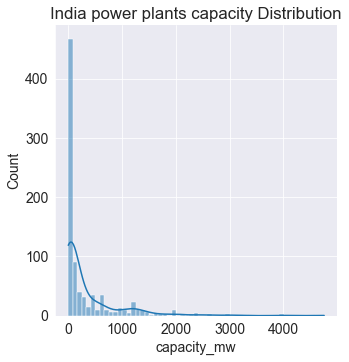

In [18]:
sns.displot(India_cap_data,x = 'capacity_mw', kde = True)
plt.title('India power plants capacity Distribution');

In [19]:
#Total capacity
print(f"India's total power plant capacity is", India_cap_data['capacity_mw'].sum(), "mw")

India's total power plant capacity is 288694.11100000003 mw


In [20]:
#Each plant's capacity as a %
India_cap_data['cap_perc'] = India_cap_data['capacity_mw'] / India_cap_data['capacity_mw'].sum() * 100
India_cap_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12924,IND,India,VINDH_CHAL STPS,IND0000503,4760.0,24.0983,82.6719,Coal,Oil,NaN,...,29047.0,30015.0,35116.0,NaN,black,0,0,0,140,1.648804
12558,IND,India,MUNDRA TPP,IND0000278,4620.0,22.8230,69.5532,Coal,Oil,NaN,...,30539.0,28078.0,20311.0,NaN,black,0,0,0,140,1.600310
12559,IND,India,MUNDRA UMPP,IND0000279,4000.0,22.8158,69.5281,Coal,Oil,NaN,...,23679.0,25303.0,24599.0,NaN,black,0,0,0,140,1.385550
12753,IND,India,SASAN UMPP,IND0000395,3960.0,23.9784,82.6275,Coal,Oil,NaN,...,29342.0,27671.0,29909.0,NaN,black,0,0,0,140,1.371694
12854,IND,India,TIRORA TPP,IND0000457,3300.0,21.4129,79.9671,Coal,Oil,NaN,...,18964.0,16665.0,16604.0,NaN,black,0,0,0,140,1.143078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12568,IND,India,Mirpur Kalan - Nexgen Solux Solar Power Plant,WRI1026172,1.0,29.7311,75.3080,Solar,NaN,NaN,...,NaN,NaN,NaN,1.9407,green,0,128,0,140,0.000346
12668,IND,India,Patodi Solar Power Plant,WRI1026181,1.0,26.0748,72.2677,Solar,NaN,NaN,...,NaN,NaN,NaN,1.9407,green,0,128,0,140,0.000346
12669,IND,India,Phagi Solar Power Plant,WRI1026182,1.0,26.5653,75.5622,Solar,NaN,NaN,...,NaN,NaN,NaN,1.9407,green,0,128,0,140,0.000346
12724,IND,India,Rasulpur Solar Power Plant,WRI1026194,1.0,27.9363,75.6790,Solar,NaN,NaN,...,NaN,NaN,NaN,1.9407,green,0,128,0,140,0.000346


### Check primary fuel distribution

In [21]:
#Check primary fuel distribution
India_cap_data['primary_fuel'].value_counts()

Coal       254
Hydro      232
Solar      122
Wind       108
Gas         68
Biomass     50
Oil         18
Nuclear      9
Name: primary_fuel, dtype: int64

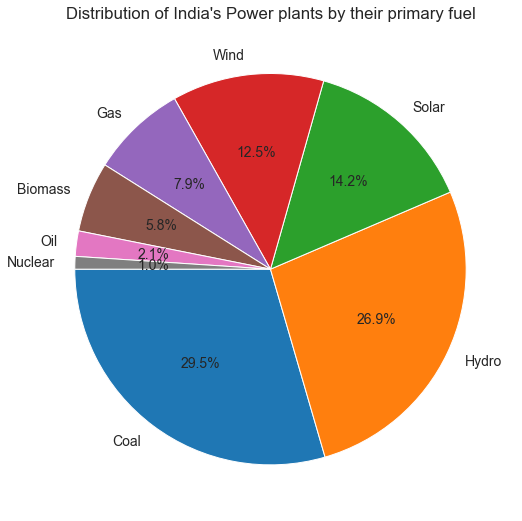

In [22]:
plt.figure(figsize = (16,9))
plt.pie(India_cap_data['primary_fuel'].value_counts(), 
        labels = India_cap_data['primary_fuel'].value_counts().index, autopct = '%1.1f%%', startangle= 180)
plt.title("Distribution of India's Power plants by their primary fuel");

# plt.legend(title = 'Legend', loc = 'best', fontsize = 'small', fancybox = True);

## 1. Coal Fired Power plants

In [23]:
# Total Capacity of powerplants that use coal as primary fuel
India_cap_data[India_cap_data['primary_fuel'] == 'Coal']['cap_perc'].sum()

69.45178732793755

Coal is the primary fuel for electricity generation in India and its usage is continuously increasing to meet the energy demands of the country. 29.5% of the plants use coal as their primary fuel. These plants harbour 69.45% of all power generation capacity.

In [24]:
India_coal = India_cap_data[India_cap_data['primary_fuel'] == 'Coal']
India_coal

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12924,IND,India,VINDH_CHAL STPS,IND0000503,4760.0,24.0983,82.6719,Coal,Oil,NaN,...,29047.0,30015.0,35116.0,NaN,black,0,0,0,140,1.648804
12558,IND,India,MUNDRA TPP,IND0000278,4620.0,22.8230,69.5532,Coal,Oil,NaN,...,30539.0,28078.0,20311.0,NaN,black,0,0,0,140,1.600310
12559,IND,India,MUNDRA UMPP,IND0000279,4000.0,22.8158,69.5281,Coal,Oil,NaN,...,23679.0,25303.0,24599.0,NaN,black,0,0,0,140,1.385550
12753,IND,India,SASAN UMPP,IND0000395,3960.0,23.9784,82.6275,Coal,Oil,NaN,...,29342.0,27671.0,29909.0,NaN,black,0,0,0,140,1.371694
12854,IND,India,TIRORA TPP,IND0000457,3300.0,21.4129,79.9671,Coal,Oil,NaN,...,18964.0,16665.0,16604.0,NaN,black,0,0,0,140,1.143078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12602,IND,India,NITIN PLANT,WRI1019895,10.5,25.2042,74.6092,Coal,NaN,NaN,...,NaN,NaN,NaN,76.966019,black,0,0,0,140,0.003637
12133,IND,India,BAMANIA CEMENT,WRI1019882,10.0,24.6929,74.6890,Coal,NaN,NaN,...,NaN,NaN,NaN,73.300971,black,0,0,0,140,0.003464
12156,IND,India,BELLARY HOTHUR,WRI1019908,10.0,15.1831,76.7909,Coal,NaN,NaN,...,NaN,NaN,NaN,73.300971,black,0,0,0,140,0.003464
12224,IND,India,CHANDRAPUR MANIKGHAR,WRI1019949,10.0,19.7218,79.1757,Coal,NaN,NaN,...,NaN,NaN,NaN,73.300971,black,0,0,0,140,0.003464


### Generation data

In [25]:
India_gen_coal_data = India_coal.dropna(subset = ['generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'])
India_gen_coal_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12924,IND,India,VINDH_CHAL STPS,IND0000503,4760.0,24.0983,82.6719,Coal,Oil,NaN,...,29047.0000,30015.000,35116.000,NaN,black,0,0,0,140,1.648804
12558,IND,India,MUNDRA TPP,IND0000278,4620.0,22.8230,69.5532,Coal,Oil,NaN,...,30539.0000,28078.000,20311.000,NaN,black,0,0,0,140,1.600310
12559,IND,India,MUNDRA UMPP,IND0000279,4000.0,22.8158,69.5281,Coal,Oil,NaN,...,23679.0000,25303.000,24599.000,NaN,black,0,0,0,140,1.385550
12753,IND,India,SASAN UMPP,IND0000395,3960.0,23.9784,82.6275,Coal,Oil,NaN,...,29342.0000,27671.000,29909.000,NaN,black,0,0,0,140,1.371694
12854,IND,India,TIRORA TPP,IND0000457,3300.0,21.4129,79.9671,Coal,Oil,NaN,...,18964.0000,16665.000,16604.000,NaN,black,0,0,0,140,1.143078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12455,IND,India,KUNDARKI TPP,IND0000221,90.0,27.0786,82.0841,Coal,Oil,NaN,...,336.8540,418.960,173.234,NaN,black,0,0,0,140,0.031175
12414,IND,India,KHAMBERKHERA IPP,IND0000193,90.0,28.0170,80.8307,Coal,Oil,NaN,...,289.2450,340.200,163.611,NaN,black,0,0,0,140,0.031175
12798,IND,India,SVPL,IND0000434,63.0,22.2915,82.5257,Coal,Oil,NaN,...,51.9464,258.452,0.000,NaN,black,0,0,0,140,0.021822
12716,IND,India,R_GUNDEM - B,IND0000352,62.5,18.7695,79.4494,Coal,Oil,NaN,...,356.9660,403.960,421.720,NaN,black,0,0,0,140,0.021649


In [26]:
#Check if there are null capacity values
India_gen_coal_data['capacity_mw'].isnull().sum()

0

In [27]:
#Check if there are null gen values
India_gen_coal_data['generation_gwh_2015'].isnull().sum()

0

In [28]:
#Check if there are null gen values
India_gen_coal_data['generation_gwh_2016'].isnull().sum()

0

In [29]:
#Check if there are null gen values
India_gen_coal_data['generation_gwh_2017'].isnull().sum()

0

All power plants have capacity and generation values. Let's explore the capacity distribution of powerplants with gen values in our subset

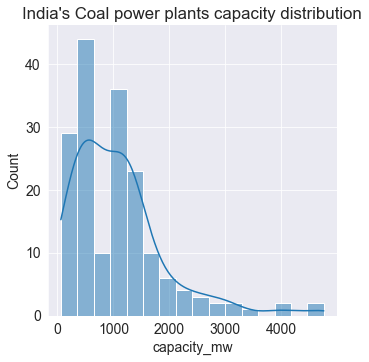

In [30]:
sns.displot(India_gen_coal_data,x = 'capacity_mw', kde = True)
plt.title("India's Coal power plants capacity distribution");

In [31]:
## Get a subset - subset for years which we have xco2 values
India_pp_data_coal = India_gen_coal_data[[
    "latitude","longitude", "name", "capacity_mw", "geolocation_source", 
    'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'
    ]
]
India_pp_data_coal

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.0000,30015.000,35116.000
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.0000,28078.000,20311.000
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.0000,25303.000,24599.000
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.0000,27671.000,29909.000
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.0000,16665.000,16604.000
...,...,...,...,...,...,...,...,...
12455,27.0786,82.0841,KUNDARKI TPP,90.0,WRI,336.8540,418.960,173.234
12414,28.0170,80.8307,KHAMBERKHERA IPP,90.0,WRI,289.2450,340.200,163.611
12798,22.2915,82.5257,SVPL,63.0,WRI,51.9464,258.452,0.000
12716,18.7695,79.4494,R_GUNDEM - B,62.5,WRI,356.9660,403.960,421.720


### Spatial Subsetting of India's co-ordinates
- Latitude(South, North)
- Longitude(West, East)

Subsetting by India - [National Portal of India](https://www.india.gov.in/india-glance/profile) 
- Lying entirely in the Northern Hemisphere, the Country extends between 
- 8° 4' and 37° 6' latitudes north of the Equator i.e.  Latitude (8° 4' and 37° 6') => (8.07°  and 37.1°)
- and 68° 7' and 97° 25' longitudes east of it i.e.  Longitude (68° 7' and 97° 25') => (68.12° and 97.42°)

In [32]:
# India's xco2 Measurements
lat = Xco2_L3_df[Xco2_L3_df['latitude'] >= 8.07][Xco2_L3_df['latitude'] <= 37.1]
India_xco2 = lat[lat['longitude'] >= 68.12][lat['longitude'] <= 97.42]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\737458642.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  lat = Xco2_L3_df[Xco2_L3_df['latitude'] >= 8.07][Xco2_L3_df['latitude'] <= 37.1]
C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\737458642.py:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  India_xco2 = lat[lat['longitude'] >= 68.12][lat['longitude'] <= 97.42]


In [33]:
India_xco2

,longitude,latitude,xco2,Year,Month
143514,68.125,8.5,398.530753,2015,January
143515,68.125,9.0,398.537991,2015,January
143516,68.125,9.5,398.549432,2015,January
143517,68.125,10.0,398.563383,2015,January
143518,68.125,10.5,398.577207,2015,January
...,...,...,...,...,...
17834733,96.875,35.0,415.504310,2022,February
17834734,96.875,35.5,415.482768,2022,February
17834735,96.875,36.0,415.770516,2022,February
17834736,96.875,36.5,416.141374,2022,February


In [34]:
#Annualize India's XCo2 Measurements
annual_India_xco2 = India_xco2[['xco2','longitude' , 'latitude', 'Year']].groupby(
    ['Year', 'longitude', 'latitude']).mean().reset_index()

annual_India_xco2

,Year,longitude,latitude,xco2
0,2015,68.125,8.5,399.695457
1,2015,68.125,9.0,399.707946
2,2015,68.125,9.5,399.719365
3,2015,68.125,10.0,399.727459
4,2015,68.125,10.5,399.739619
...,...,...,...,...
21803,2022,96.875,35.0,415.504310
21804,2022,96.875,35.5,415.482768
21805,2022,96.875,36.0,415.770516
21806,2022,96.875,36.5,416.141374


xco2 Longitudes are to the nearest 125th's while Latitudes are to the nearest 0.5

### India's average xco2 Emissions

In [35]:
#Check for XCo2 Measurements
india_xco2_avg = India_xco2[['xco2', 'Year']].groupby(['Year']).mean().reset_index()
india_xco2_avg['Gt_Co2'] = india_xco2_avg['xco2'] * 7.81
india_xco2_avg

,Year,xco2,Gt_Co2
0,2015,399.785704,3122.326346
1,2016,403.284333,3149.650645
2,2017,405.642786,3168.070156
3,2018,407.789181,3184.833503
4,2019,410.456978,3205.668995
5,2020,412.925562,3224.948643
6,2021,415.407508,3244.332634
7,2022,416.552386,3253.274132


### Average emissions over global

India is a huge emitter of xco2. Her xco2 levels are higher than the global average

In [36]:
india_xco2_avg['xco2>global'] = india_xco2_avg['xco2']-global_xco2_avg['xco2']
india_xco2_avg['Gt_co2>global'] = india_xco2_avg['Gt_Co2']-global_xco2_avg['Gt_Co2']
india_xco2_avg

,Year,xco2,Gt_Co2,xco2>global,Gt_co2>global
0,2015,399.785704,3122.326346,1.318305,10.295959
1,2016,403.284333,3149.650645,1.667596,13.023922
2,2017,405.642786,3168.070156,1.744198,13.622187
3,2018,407.789181,3184.833503,1.600909,12.503097
4,2019,410.456978,3205.668995,1.728203,13.497268
5,2020,412.925562,3224.948643,1.670087,13.043378
6,2021,415.407508,3244.332634,1.811761,14.149856
7,2022,416.552386,3253.274132,0.802387,6.266639


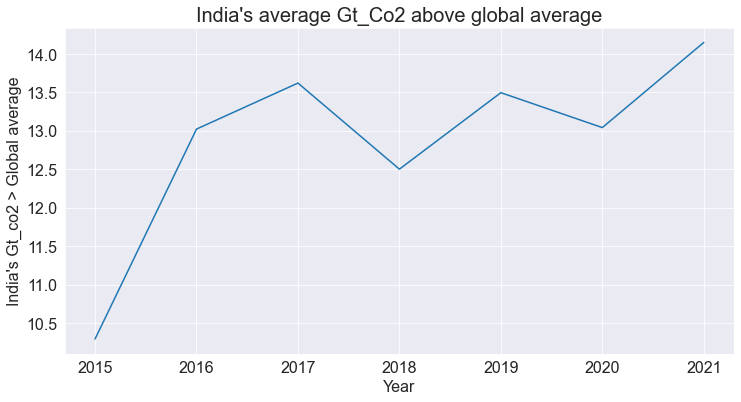

In [37]:
plt.figure(figsize = (12, 6))
sns.lineplot(data = india_xco2_avg[india_xco2_avg['Year'] < 2022], x = 'Year', y = 'Gt_co2>global')
plt.title("India's average Gt_Co2 above global average", fontsize = 20)
plt.xlabel('Year', fontsize =16)
plt.ylabel("India's Gt_co2 > Global average", fontsize = 16)
plt.xticks(fontsize = 16)
plt.yticks(fontsize = 16);

### Interpolate Power plants Longitudes and Latitudes to xco2 nearest measurements

In [38]:
India_pp_data_coal

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.0000,30015.000,35116.000
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.0000,28078.000,20311.000
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.0000,25303.000,24599.000
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.0000,27671.000,29909.000
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.0000,16665.000,16604.000
...,...,...,...,...,...,...,...,...
12455,27.0786,82.0841,KUNDARKI TPP,90.0,WRI,336.8540,418.960,173.234
12414,28.0170,80.8307,KHAMBERKHERA IPP,90.0,WRI,289.2450,340.200,163.611
12798,22.2915,82.5257,SVPL,63.0,WRI,51.9464,258.452,0.000
12716,18.7695,79.4494,R_GUNDEM - B,62.5,WRI,356.9660,403.960,421.720


Latitude measurements are to the nearest 0.5 and Longitudes to the nearest 0.125

In [39]:
India_pp_data_coal_est = India_pp_data_coal.copy(deep = True)
India_pp_data_coal_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.0000,30015.000,35116.000
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.0000,28078.000,20311.000
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.0000,25303.000,24599.000
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.0000,27671.000,29909.000
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.0000,16665.000,16604.000
...,...,...,...,...,...,...,...,...
12455,27.0786,82.0841,KUNDARKI TPP,90.0,WRI,336.8540,418.960,173.234
12414,28.0170,80.8307,KHAMBERKHERA IPP,90.0,WRI,289.2450,340.200,163.611
12798,22.2915,82.5257,SVPL,63.0,WRI,51.9464,258.452,0.000
12716,18.7695,79.4494,R_GUNDEM - B,62.5,WRI,356.9660,403.960,421.720


In [40]:
India_pp_data_coal_est['latitude_est'] = India_pp_data_coal_est['latitude'].mul(2).round().div(2)
India_pp_data_coal_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.0000,30015.000,35116.000,24.0
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.0000,28078.000,20311.000,23.0
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.0000,25303.000,24599.000,23.0
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.0000,27671.000,29909.000,24.0
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.0000,16665.000,16604.000,21.5
...,...,...,...,...,...,...,...,...,...
12455,27.0786,82.0841,KUNDARKI TPP,90.0,WRI,336.8540,418.960,173.234,27.0
12414,28.0170,80.8307,KHAMBERKHERA IPP,90.0,WRI,289.2450,340.200,163.611,28.0
12798,22.2915,82.5257,SVPL,63.0,WRI,51.9464,258.452,0.000,22.5
12716,18.7695,79.4494,R_GUNDEM - B,62.5,WRI,356.9660,403.960,421.720,19.0


In [41]:
India_pp_data_coal_est['longitude_est'] = India_pp_data_coal_est['longitude'].mul(4).round().div(4)
India_pp_data_coal_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.0000,30015.000,35116.000,24.0,82.75
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.0000,28078.000,20311.000,23.0,69.50
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.0000,25303.000,24599.000,23.0,69.50
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.0000,27671.000,29909.000,24.0,82.75
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.0000,16665.000,16604.000,21.5,80.00
...,...,...,...,...,...,...,...,...,...,...
12455,27.0786,82.0841,KUNDARKI TPP,90.0,WRI,336.8540,418.960,173.234,27.0,82.00
12414,28.0170,80.8307,KHAMBERKHERA IPP,90.0,WRI,289.2450,340.200,163.611,28.0,80.75
12798,22.2915,82.5257,SVPL,63.0,WRI,51.9464,258.452,0.000,22.5,82.50
12716,18.7695,79.4494,R_GUNDEM - B,62.5,WRI,356.9660,403.960,421.720,19.0,79.50


### Pick the 10 largest Power plants

In [42]:
## Sort by Capacity
India_large_coal_pp = India_pp_data_coal_est.sort_values(by = 'capacity_mw', ascending = False).head(10)
India_large_coal_pp

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.000000,30015.00000,35116.0000,24.0,82.75
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.000000,28078.00000,20311.0000,23.0,69.50
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.000000,25303.00000,24599.0000,23.0,69.50
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.000000,27671.00000,29909.0000,24.0,82.75
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.000000,16665.00000,16604.0000,21.5,80.00
12832,21.0966,85.0740,TALCHER STPS,3000.0,WRI,22480.000000,21370.00000,21490.0000,21.0,85.00
12709,24.0270,82.7915,RIHAND,3000.0,WRI,19628.000000,20486.00000,22019.0000,24.0,82.75
12781,22.1300,82.2930,SIPAT STPS,2980.0,WRI,21078.000000,22522.00000,21771.0000,22.0,82.25
12226,20.0063,79.2900,CHANDRAPUR_Coal,2920.0,WRI,11158.697000,13675.44000,13780.2300,20.0,79.25
12102,24.2010,82.7891,ANPARA,2630.0,WRI,11151.069472,13227.35235,15334.8763,24.0,82.75


In [43]:
India_coal_pp = India_large_coal_pp.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                                    'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_coal_pp

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2015,29047.000000
10,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2016,30015.000000
20,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2017,35116.000000
1,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2015,30539.000000
11,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2016,28078.000000
21,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2017,20311.000000
2,22.8158,69.5281,MUNDRA UMPP,4000.0,23.0,69.50,generation_gwh_2015,23679.000000
12,22.8158,69.5281,MUNDRA UMPP,4000.0,23.0,69.50,generation_gwh_2016,25303.000000
22,22.8158,69.5281,MUNDRA UMPP,4000.0,23.0,69.50,generation_gwh_2017,24599.000000
3,23.9784,82.6275,SASAN UMPP,3960.0,24.0,82.75,generation_gwh_2015,29342.000000


### CO2 Baseline Database for the Indian Power Sector
Source: Government of India, Ministry of Power, Central Electricity Authority, Sewa Bhawan, R.K.Puram, [Link](https://cea.nic.in/wp-content/uploads/baseline/2020/07/user_guide_ver14.pdf)

Weighted average specific emissions for fossil fuel-fired stations in FY 2017-18,
in t CO2/MWh 
- Coal - $0.97 T/mwh$ => $970 T/gwh$ => $9.7 * 1e-7 Gt/gwh$
- Diesel - $0.70 T/mwh$ => $700 T/gwh$ => $7.0 * 1e-7 Gt/gwh$
- Gas* - $0.45 T/mwh$ => $450 T/gwh$ => $4.5 * 1e-7 Gt/gwh$ - Only gas-fired stations that do not use any other fuel. Stations that use naphtha, diesel or oil as a second fuel are excluded from the weighted average. 
- Lignite - $1.36 T/mwh$ => $1360 T/gwh$ => $1.36 * 1e-6 Gt/gwh$
- Oil - $0.77 T/mwh$ => $770 T/gwh$ => $7.7 * 1e-7 Gt/gwh$ - Source: [Link](https://www.rte-france.com/en/eco2mix/co2-emissions#:~:text=Real%2Dtime%20calculation%20of%20CO2%20emissions&text=0.777%20t%20CO2%20eq%20/MWh,MWh%20for%20biofuel%20plants%20(waste))

### Estimates of Emissions from Coal Fired Thermal Power Plants in India
Mittal et al [Link](https://www3.epa.gov/ttnchie1/conference/ei20/session5/mmittal.pdf)

Computed estimates show the emissions per unit of electricity are estimated to be in the range of 0.91 to 0.95 kg/kWh for CO2. The emission estimates are based on a model in which the mass emission factors are theoretically calculated using the basic principles of combustion and operating conditions.

Emission estimates from Plant - $0.93kg/kwh$ =>$0.93 * 1e6 Kg/gwh$ => $930 T/gwh$ => $9.3 * 1e-7 Gt/gwh$

Note natural sinks (ocean and biosphere) absorb approximately 55% of human emissions, so the "airborne fraction" added to the atmosphere is about 45%. Source: [Skeptical Science](https://skepticalscience.com/print.php?r=45)

Emission estimates in atmosphere - $45 percent$ of plant emmisions = $418.5 T/gwh$ => $4.185 * 1e-7 Gt/gwh$

In [44]:
India_coal_pp['est_Gt_co2_emms'] = India_coal_pp['value'] * 9.3 * 1e-7
India_coal_pp['est_Gt_co2_atm'] = India_coal_pp['est_Gt_co2_emms'] * 0.45
India_coal_pp

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value,est_Gt_co2_emms,est_Gt_co2_atm
0,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2015,29047.000000,0.027014,0.012156
10,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2016,30015.000000,0.027914,0.012561
20,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2017,35116.000000,0.032658,0.014696
1,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2015,30539.000000,0.028401,0.012781
11,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2016,28078.000000,0.026113,0.011751
21,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2017,20311.000000,0.018889,0.008500
2,22.8158,69.5281,MUNDRA UMPP,4000.0,23.0,69.50,generation_gwh_2015,23679.000000,0.022021,0.009910
12,22.8158,69.5281,MUNDRA UMPP,4000.0,23.0,69.50,generation_gwh_2016,25303.000000,0.023532,0.010589
22,22.8158,69.5281,MUNDRA UMPP,4000.0,23.0,69.50,generation_gwh_2017,24599.000000,0.022877,0.010295
3,23.9784,82.6275,SASAN UMPP,3960.0,24.0,82.75,generation_gwh_2015,29342.000000,0.027288,0.012280


### Check power plant xco2 Levels vs India's average vs global average emissions 

#### 1. Check xco2 levels in VINDH_CHAL STPS

In [45]:
#check xco2 levels in VINDH_CHAL STPS
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 82.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2860866443.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 82.5]


,Year,longitude,latitude,xco2
1365,2015,82.5,24.0,400.974743
4091,2016,82.5,24.0,404.587830
6817,2017,82.5,24.0,406.872143
9543,2018,82.5,24.0,409.197026
12269,2019,82.5,24.0,411.966230
14995,2020,82.5,24.0,414.274305
17721,2021,82.5,24.0,416.864514
20447,2022,82.5,24.0,417.825902


In [46]:
#2, 3. MUNDRA TTP & UMPP
annual_India_xco2[annual_India_xco2['latitude'] == 23][annual_India_xco2['longitude'] ==70]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3080648866.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23][annual_India_xco2['longitude'] ==70]


,Year,longitude,latitude,xco2
203,2015,70.0,23.0,399.992168
2929,2016,70.0,23.0,403.453750
5655,2017,70.0,23.0,405.827960
8381,2018,70.0,23.0,407.923722
11107,2019,70.0,23.0,410.764188
13833,2020,70.0,23.0,413.152514
16559,2021,70.0,23.0,415.556100
19285,2022,70.0,23.0,416.879185


In [47]:
#4. SASAN UMPP
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\105105172.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]


,Year,longitude,latitude,xco2
1423,2015,83.125,24.0,400.677597
4149,2016,83.125,24.0,404.240104
6875,2017,83.125,24.0,406.522942
9601,2018,83.125,24.0,408.898461
12327,2019,83.125,24.0,411.545284
15053,2020,83.125,24.0,413.926458
17779,2021,83.125,24.0,416.502265
20505,2022,83.125,24.0,417.352041


In [48]:
#5. TIRORA TPP
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\922000993.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1127,2015,80.0,21.0,400.325450
3853,2016,80.0,21.0,403.849449
6579,2017,80.0,21.0,406.128978
9305,2018,80.0,21.0,408.367387
12031,2019,80.0,21.0,411.207533
14757,2020,80.0,21.0,413.537188
17483,2021,80.0,21.0,415.962434
20209,2022,80.0,21.0,416.832458


In [49]:
#6. TALCHER STPS
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 85]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3312116062.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 85]


,Year,longitude,latitude,xco2
1591,2015,85.0,21.0,400.551345
4317,2016,85.0,21.0,404.028195
7043,2017,85.0,21.0,406.469253
9769,2018,85.0,21.0,408.645458
12495,2019,85.0,21.0,411.386212
15221,2020,85.0,21.0,413.771365
17947,2021,85.0,21.0,416.287336
20673,2022,85.0,21.0,417.321705


In [50]:
#7. RIHAND
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3237902666.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]


,Year,longitude,latitude,xco2
1423,2015,83.125,24.0,400.677597
4149,2016,83.125,24.0,404.240104
6875,2017,83.125,24.0,406.522942
9601,2018,83.125,24.0,408.898461
12327,2019,83.125,24.0,411.545284
15053,2020,83.125,24.0,413.926458
17779,2021,83.125,24.0,416.502265
20505,2022,83.125,24.0,417.352041


In [51]:
#8. SIPAT STPS
annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 82.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1342757661.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 82.5]


,Year,longitude,latitude,xco2
1361,2015,82.5,22.0,400.620709
4087,2016,82.5,22.0,404.157570
6813,2017,82.5,22.0,406.503345
9539,2018,82.5,22.0,408.802454
12265,2019,82.5,22.0,411.516615
14991,2020,82.5,22.0,413.881427
17717,2021,82.5,22.0,416.362120
20443,2022,82.5,22.0,417.352667


In [52]:
#9. CHANDRAPUR_COAL
annual_India_xco2[annual_India_xco2['latitude'] == 20][annual_India_xco2['longitude'] == 79.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3377633336.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 20][annual_India_xco2['longitude'] == 79.375]


,Year,longitude,latitude,xco2
1067,2015,79.375,20.0,400.358068
3793,2016,79.375,20.0,403.891659
6519,2017,79.375,20.0,406.180954
9245,2018,79.375,20.0,408.386325
11971,2019,79.375,20.0,411.215539
14697,2020,79.375,20.0,413.621035
17423,2021,79.375,20.0,416.060230
20149,2022,79.375,20.0,417.012854


In [53]:
#10. ANPARA
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1850379878.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]


,Year,longitude,latitude,xco2
1423,2015,83.125,24.0,400.677597
4149,2016,83.125,24.0,404.240104
6875,2017,83.125,24.0,406.522942
9601,2018,83.125,24.0,408.898461
12327,2019,83.125,24.0,411.545284
15053,2020,83.125,24.0,413.926458
17779,2021,83.125,24.0,416.502265
20505,2022,83.125,24.0,417.352041


In [54]:
## Next 20 Power plants
India_large_pp_20 = India_pp_data_coal_est.sort_values(by = 'capacity_mw', ascending = False)[10:30]
India_large_pp_20

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12439,22.3881,82.6858,KORBA STPS,2600.0,WRI,19176.00000,19078.0000,19229.000000,22.5,82.75
12717,18.7572,79.4560,R_GUNDEM STPS,2600.0,WRI,18990.00000,18357.0000,17704.000000,19.0,79.50
12834,22.0987,83.4513,TAMNAR TPP,2400.0,WRI,4101.53000,4529.6000,6337.630000,22.0,83.50
12438,21.2414,79.0960,KORADI,2400.0,WRI,2725.69064,4875.8100,8670.845796,21.0,79.00
12386,25.2349,87.2635,KAHALGAON,2340.0,WRI,14192.00000,14834.8000,15177.000000,25.0,87.25
12548,21.1797,79.3978,MOUDA STPS,2320.0,WRI,1718.00000,3838.0000,7276.000000,21.0,79.50
12288,24.7720,87.8940,FARAKKA STPS,2100.0,WRI,11440.00000,12732.0000,12381.000000,25.0,88.00
12776,17.5910,83.0917,SIMHADRI,2000.0,WRI,13656.00000,13389.0000,11062.000000,17.5,83.00
12779,24.1033,82.7068,SINGRAULI STPS,2000.0,WRI,15054.00000,13998.0000,13616.000000,24.0,82.75
12491,24.7971,78.6463,LALITPUR TPP,1980.0,WRI,495.63000,3741.8700,8072.020000,25.0,78.75


In [55]:
India_pp_20 = India_large_pp_20.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                               'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_pp_20

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
1,18.7572,79.4560,R_GUNDEM STPS,2600.0,19.0,79.50,generation_gwh_2015,18990.000000
21,18.7572,79.4560,R_GUNDEM STPS,2600.0,19.0,79.50,generation_gwh_2016,18357.000000
41,18.7572,79.4560,R_GUNDEM STPS,2600.0,19.0,79.50,generation_gwh_2017,17704.000000
0,22.3881,82.6858,KORBA STPS,2600.0,22.5,82.75,generation_gwh_2015,19176.000000
20,22.3881,82.6858,KORBA STPS,2600.0,22.5,82.75,generation_gwh_2016,19078.000000
40,22.3881,82.6858,KORBA STPS,2600.0,22.5,82.75,generation_gwh_2017,19229.000000
2,22.0987,83.4513,TAMNAR TPP,2400.0,22.0,83.50,generation_gwh_2015,4101.530000
22,22.0987,83.4513,TAMNAR TPP,2400.0,22.0,83.50,generation_gwh_2016,4529.600000
42,22.0987,83.4513,TAMNAR TPP,2400.0,22.0,83.50,generation_gwh_2017,6337.630000
3,21.2414,79.0960,KORADI,2400.0,21.0,79.00,generation_gwh_2015,2725.690640


### xco2 Levels

In [56]:
#11. check xco2 levels in R_GUNDEM STPS
annual_India_xco2[annual_India_xco2['latitude'] == 19][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\751895926.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 19][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1123,2015,80.0,19.0,400.237891
3849,2016,80.0,19.0,403.781200
6575,2017,80.0,19.0,406.085712
9301,2018,80.0,19.0,408.262638
12027,2019,80.0,19.0,411.069994
14753,2020,80.0,19.0,413.487926
17479,2021,80.0,19.0,415.920362
20205,2022,80.0,19.0,416.843985


In [57]:
#12 check xco2 levels in KORBA STPS
annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 83.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3880527898.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 83.125]


,Year,longitude,latitude,xco2
1420,2015,83.125,22.5,400.397410
4146,2016,83.125,22.5,403.944145
6872,2017,83.125,22.5,406.265928
9598,2018,83.125,22.5,408.616620
12324,2019,83.125,22.5,411.261274
15050,2020,83.125,22.5,413.634448
17776,2021,83.125,22.5,416.137202
20502,2022,83.125,22.5,416.962564


In [58]:
#13. check xco2 levels in TAMNAR TPP
annual_India_xco2[annual_India_xco2['latitude'] == 22.0][annual_India_xco2['longitude'] == 83.75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1923451795.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22.0][annual_India_xco2['longitude'] == 83.75]


,Year,longitude,latitude,xco2
1477,2015,83.75,22.0,400.425067
4203,2016,83.75,22.0,403.942442
6929,2017,83.75,22.0,406.293319
9655,2018,83.75,22.0,408.582927
12381,2019,83.75,22.0,411.286452
15107,2020,83.75,22.0,413.641209
17833,2021,83.75,22.0,416.140731
20559,2022,83.75,22.0,417.097184


In [59]:
#14. check xco2 levels in KORADI
annual_India_xco2[annual_India_xco2['latitude'] == 21.0][annual_India_xco2['longitude'] == 79.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2841947464.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.0][annual_India_xco2['longitude'] == 79.375]


,Year,longitude,latitude,xco2
1069,2015,79.375,21.0,400.344017
3795,2016,79.375,21.0,403.840387
6521,2017,79.375,21.0,406.141195
9247,2018,79.375,21.0,408.370403
11973,2019,79.375,21.0,411.225721
14699,2020,79.375,21.0,413.561901
17425,2021,79.375,21.0,416.001265
20151,2022,79.375,21.0,416.916799


In [60]:
#15. check xco2 levels in KAHALGAON
annual_India_xco2[annual_India_xco2['latitude'] == 25.0][annual_India_xco2['longitude'] == 87.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2124961085.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 25.0][annual_India_xco2['longitude'] == 87.5]


,Year,longitude,latitude,xco2
1831,2015,87.5,25.0,400.412088
4557,2016,87.5,25.0,403.921902
7283,2017,87.5,25.0,406.286112
10009,2018,87.5,25.0,408.538933
12735,2019,87.5,25.0,411.160522
15461,2020,87.5,25.0,413.580554
18187,2021,87.5,25.0,416.174133
20913,2022,87.5,25.0,417.274707


In [61]:
#16. check xco2 levels in MOUDA STPS
annual_India_xco2[annual_India_xco2['latitude'] == 21.0][annual_India_xco2['longitude'] == 79.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2360298553.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.0][annual_India_xco2['longitude'] == 79.375]


,Year,longitude,latitude,xco2
1069,2015,79.375,21.0,400.344017
3795,2016,79.375,21.0,403.840387
6521,2017,79.375,21.0,406.141195
9247,2018,79.375,21.0,408.370403
11973,2019,79.375,21.0,411.225721
14699,2020,79.375,21.0,413.561901
17425,2021,79.375,21.0,416.001265
20151,2022,79.375,21.0,416.916799


In [62]:
#17 check xco2 levels in FARAKKKHA STPS
annual_India_xco2[annual_India_xco2['latitude'] == 25.0][annual_India_xco2['longitude'] == 88.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2620793846.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 25.0][annual_India_xco2['longitude'] == 88.125]


,Year,longitude,latitude,xco2
1889,2015,88.125,25.0,400.478532
4615,2016,88.125,25.0,403.964727
7341,2017,88.125,25.0,406.346848
10067,2018,88.125,25.0,408.591917
12793,2019,88.125,25.0,411.206181
15519,2020,88.125,25.0,413.630264
18245,2021,88.125,25.0,416.239421
20971,2022,88.125,25.0,417.361330


In [63]:
#18 check xco2 levels in SINGRAULI STPS
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3788586051.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 83.125]


,Year,longitude,latitude,xco2
1423,2015,83.125,24.0,400.677597
4149,2016,83.125,24.0,404.240104
6875,2017,83.125,24.0,406.522942
9601,2018,83.125,24.0,408.898461
12327,2019,83.125,24.0,411.545284
15053,2020,83.125,24.0,413.926458
17779,2021,83.125,24.0,416.502265
20505,2022,83.125,24.0,417.352041


In [64]:
#19 check xco2 levels in SIMHADRI
annual_India_xco2[annual_India_xco2['latitude'] == 17.5][annual_India_xco2['longitude'] == 83.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2810453967.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17.5][annual_India_xco2['longitude'] == 83.125]


,Year,longitude,latitude,xco2
1410,2015,83.125,17.5,400.194596
4136,2016,83.125,17.5,403.719737
6862,2017,83.125,17.5,406.126669
9588,2018,83.125,17.5,408.221201
12314,2019,83.125,17.5,411.017955
15040,2020,83.125,17.5,413.438495
17766,2021,83.125,17.5,415.856312
20492,2022,83.125,17.5,416.829794


In [65]:
#20 check xco2 levels in TALWINDI SABO
annual_India_xco2[annual_India_xco2['latitude'] == 30][annual_India_xco2['longitude'] == 75.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3828783237.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 30][annual_India_xco2['longitude'] == 75.625]


,Year,longitude,latitude,xco2
739,2015,75.625,30.0,400.340262
3465,2016,75.625,30.0,403.864378
6191,2017,75.625,30.0,406.259279
8917,2018,75.625,30.0,408.576358
11643,2019,75.625,30.0,411.123889
14369,2020,75.625,30.0,413.580591
17095,2021,75.625,30.0,416.213823
19821,2022,75.625,30.0,417.591666


In [66]:
#21. check xco2 levels in PRYAGRAJ (BARA) TPP
annual_India_xco2[annual_India_xco2['latitude'] == 25][annual_India_xco2['longitude'] == 81.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3098166152.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 25][annual_India_xco2['longitude'] == 81.875]


,Year,longitude,latitude,xco2
1309,2015,81.875,25.0,400.392774
4035,2016,81.875,25.0,404.033350
6761,2017,81.875,25.0,406.286570
9487,2018,81.875,25.0,408.613082
12213,2019,81.875,25.0,411.322890
14939,2020,81.875,25.0,413.621012
17665,2021,81.875,25.0,416.183964
20391,2022,81.875,25.0,417.141064


In [67]:
#22. check xco2 levels in LALITPUR TPP
annual_India_xco2[annual_India_xco2['latitude'] == 25][annual_India_xco2['longitude'] == 78.75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\162386653.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 25][annual_India_xco2['longitude'] == 78.75]


,Year,longitude,latitude,xco2
1019,2015,78.75,25.0,400.196038
3745,2016,78.75,25.0,403.861635
6471,2017,78.75,25.0,406.103308
9197,2018,78.75,25.0,408.404384
11923,2019,78.75,25.0,411.164946
14649,2020,78.75,25.0,413.442103
17375,2021,78.75,25.0,415.973112
20101,2022,78.75,25.0,416.849810


In [68]:
#23. check xco2 levels in DADRI (NCTPP)
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1243154108.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
910,2015,77.5,28.5,400.753525
3636,2016,77.5,28.5,404.483031
6362,2017,77.5,28.5,406.719574
9088,2018,77.5,28.5,409.138578
11814,2019,77.5,28.5,411.722786
14540,2020,77.5,28.5,414.086657
17266,2021,77.5,28.5,416.767844
19992,2022,77.5,28.5,418.188555


In [69]:
#24. check xco2 levels in AKALTAR TPP
annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 82.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\509238412.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 82.5]


,Year,longitude,latitude,xco2
1361,2015,82.5,22.0,400.620709
4087,2016,82.5,22.0,404.157570
6813,2017,82.5,22.0,406.503345
9539,2018,82.5,22.0,408.802454
12265,2019,82.5,22.0,411.516615
14991,2020,82.5,22.0,413.881427
17717,2021,82.5,22.0,416.362120
20443,2022,82.5,22.0,417.352667


In [70]:
#25. check xco2 levels in RAICHUR
annual_India_xco2[annual_India_xco2['latitude'] == 16.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3185086921.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 16.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
886,2015,77.5,16.5,400.047852
3612,2016,77.5,16.5,403.506414
6338,2017,77.5,16.5,405.881010
9064,2018,77.5,16.5,408.029039
11790,2019,77.5,16.5,410.948014
14516,2020,77.5,16.5,413.242048
17242,2021,77.5,16.5,415.656539
19968,2022,77.5,16.5,416.751154


In [71]:
#26 check xco2 levels in BELLARY TPS
annual_India_xco2[annual_India_xco2['latitude'] == 15][annual_India_xco2['longitude'] == 76.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4017232279.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 15][annual_India_xco2['longitude'] == 76.875]


,Year,longitude,latitude,xco2
825,2015,76.875,15.0,399.907629
3551,2016,76.875,15.0,403.363710
6277,2017,76.875,15.0,405.711486
9003,2018,76.875,15.0,407.877846
11729,2019,76.875,15.0,410.735380
14455,2020,76.875,15.0,413.088561
17181,2021,76.875,15.0,415.435492
19907,2022,76.875,15.0,416.516964


In [72]:
#27. check xco2 levels in CHHABRA TPS
annual_India_xco2[annual_India_xco2['latitude'] == 24.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2057070500.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
902,2015,77.5,24.5,400.088268
3628,2016,77.5,24.5,403.723754
6354,2017,77.5,24.5,405.998020
9080,2018,77.5,24.5,408.234726
11806,2019,77.5,24.5,411.030698
14532,2020,77.5,24.5,413.293972
17258,2021,77.5,24.5,415.795717
19984,2022,77.5,24.5,416.634166


In [73]:
#28 check xco2 levels in RAYAL SEEMA 
annual_India_xco2[annual_India_xco2['latitude'] == 14.5][annual_India_xco2['longitude'] == 78.75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\440043628.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 14.5][annual_India_xco2['longitude'] == 78.75]


,Year,longitude,latitude,xco2
998,2015,78.75,14.5,399.979959
3724,2016,78.75,14.5,403.419996
6450,2017,78.75,14.5,405.838058
9176,2018,78.75,14.5,407.919706
11902,2019,78.75,14.5,410.762270
14628,2020,78.75,14.5,413.164276
17354,2021,78.75,14.5,415.500080
20080,2022,78.75,14.5,416.632362


In [74]:
#29. check xco2 levels in SAGARDIGHI TPP
annual_India_xco2[annual_India_xco2['latitude'] == 24.5][annual_India_xco2['longitude'] == 88.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\857599534.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24.5][annual_India_xco2['longitude'] == 88.125]


,Year,longitude,latitude,xco2
1888,2015,88.125,24.5,400.477556
4614,2016,88.125,24.5,403.956909
7340,2017,88.125,24.5,406.365811
10066,2018,88.125,24.5,408.581834
12792,2019,88.125,24.5,411.218977
15518,2020,88.125,24.5,413.638785
18244,2021,88.125,24.5,416.244520
20970,2022,88.125,24.5,417.358048


In [75]:
#30. check xco2 levels in DAMODARAM SANJEEVAIAH
annual_India_xco2[annual_India_xco2['latitude'] == 14.5][annual_India_xco2['longitude'] == 80.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2686405740.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 14.5][annual_India_xco2['longitude'] == 80.625]


,Year,longitude,latitude,xco2
1172,2015,80.625,14.5,399.952101
3898,2016,80.625,14.5,403.428082
6624,2017,80.625,14.5,405.861438
9350,2018,80.625,14.5,407.858163
12076,2019,80.625,14.5,410.721048
14802,2020,80.625,14.5,413.161572
17528,2021,80.625,14.5,415.476149
20254,2022,80.625,14.5,416.630968


### Subsequent (Next Next)20 Power plants

In [76]:
## Subsequent (Next Next)20 Power plants
India_sub_pp_20 = India_pp_data_coal_est.sort_values(by = 'capacity_mw', ascending = False)[30:50]
India_sub_pp_20

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12944,16.2949,77.3568,YERMARUS TPP,1600.0,WRI,0.994875,233.596650,865.400000,16.5,77.25
12893,25.9131,81.3274,UNCHAHAR,1550.0,WRI,6353.000000,6335.000000,6337.000000,26.0,81.25
12795,29.1790,74.0202,SURATGARH,1500.0,WRI,5282.000000,4030.818000,4453.203000,29.0,74.00
12358,28.4849,76.3754,INDRA GANDHI STPP,1500.0,WRI,5418.767000,5109.497000,7290.568000,28.5,76.50
12911,13.2371,80.3023,VALLUR ntpc/ntecl,1500.0,WRI,7130.507000,8564.379000,6605.259000,13.0,80.25
12596,11.5576,79.4417,NEYVELI ST II,1470.0,WRI,9546.648000,9987.752000,9246.062000,11.5,79.50
12931,22.8725,73.3588,WANAKBORI,1470.0,WRI,5161.538000,3539.630000,7018.217000,23.0,73.25
12693,30.5570,76.5770,RAJPURA TPP,1400.0,WRI,7262.500572,8952.470000,8647.430000,30.5,76.50
12687,21.4499,81.8525,RAIKHEDA,1370.0,WRI,588.740000,687.880000,1242.190000,21.5,81.75
12098,21.0782,77.9009,AMARAVATI TPP,1350.0,WRI,5629.663000,1701.008000,4350.558000,21.0,78.00


In [77]:
India_sub_pp_20 = India_sub_pp_20.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                                 'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = [ 'geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_sub_pp_20

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,16.2949,77.3568,YERMARUS TPP,1600.0,16.5,77.25,generation_gwh_2015,0.994875
20,16.2949,77.3568,YERMARUS TPP,1600.0,16.5,77.25,generation_gwh_2016,233.596650
40,16.2949,77.3568,YERMARUS TPP,1600.0,16.5,77.25,generation_gwh_2017,865.400000
1,25.9131,81.3274,UNCHAHAR,1550.0,26.0,81.25,generation_gwh_2015,6353.000000
21,25.9131,81.3274,UNCHAHAR,1550.0,26.0,81.25,generation_gwh_2016,6335.000000
41,25.9131,81.3274,UNCHAHAR,1550.0,26.0,81.25,generation_gwh_2017,6337.000000
4,13.2371,80.3023,VALLUR ntpc/ntecl,1500.0,13.0,80.25,generation_gwh_2015,7130.507000
24,13.2371,80.3023,VALLUR ntpc/ntecl,1500.0,13.0,80.25,generation_gwh_2016,8564.379000
44,13.2371,80.3023,VALLUR ntpc/ntecl,1500.0,13.0,80.25,generation_gwh_2017,6605.259000
2,29.1790,74.0202,SURATGARH,1500.0,29.0,74.00,generation_gwh_2015,5282.000000


### xco2 levels

In [78]:
#31. check xco2 levels in YERMARUS TPP
annual_India_xco2[annual_India_xco2['latitude'] == 16.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\546673871.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 16.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
886,2015,77.5,16.5,400.047852
3612,2016,77.5,16.5,403.506414
6338,2017,77.5,16.5,405.881010
9064,2018,77.5,16.5,408.029039
11790,2019,77.5,16.5,410.948014
14516,2020,77.5,16.5,413.242048
17242,2021,77.5,16.5,415.656539
19968,2022,77.5,16.5,416.751154


In [79]:
#32. check xco2 levels in UNCHAHAR
annual_India_xco2[annual_India_xco2['latitude'] == 26][annual_India_xco2['longitude'] == 81.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\726543838.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 26][annual_India_xco2['longitude'] == 81.25]


,Year,longitude,latitude,xco2
1253,2015,81.25,26.0,400.383031
3979,2016,81.25,26.0,404.068829
6705,2017,81.25,26.0,406.319722
9431,2018,81.25,26.0,408.691758
12157,2019,81.25,26.0,411.304696
14883,2020,81.25,26.0,413.660750
17609,2021,81.25,26.0,416.257389
20335,2022,81.25,26.0,417.301641


In [80]:
#33. check xco2 levels in VALLUR ntpc/ntecl
annual_India_xco2[annual_India_xco2['latitude'] == 13][annual_India_xco2['longitude'] == 80.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\210880037.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 13][annual_India_xco2['longitude'] == 80.625]


,Year,longitude,latitude,xco2
1169,2015,80.625,13.0,399.949608
3895,2016,80.625,13.0,403.435476
6621,2017,80.625,13.0,405.872465
9347,2018,80.625,13.0,407.838633
12073,2019,80.625,13.0,410.693859
14799,2020,80.625,13.0,413.142690
17525,2021,80.625,13.0,415.497490
20251,2022,80.625,13.0,416.633962


In [81]:
#34. check xco2 levels in SURATGARH
annual_India_xco2[annual_India_xco2['latitude'] == 29][annual_India_xco2['longitude'] == 74.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\684496267.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 29][annual_India_xco2['longitude'] == 74.375]


,Year,longitude,latitude,xco2
621,2015,74.375,29.0,400.191630
3347,2016,74.375,29.0,403.661674
6073,2017,74.375,29.0,406.095829
8799,2018,74.375,29.0,408.307760
11525,2019,74.375,29.0,410.959122
14251,2020,74.375,29.0,413.383845
16977,2021,74.375,29.0,416.006919
19703,2022,74.375,29.0,417.464808


In [82]:
#35. check xco2 levels in INDRA GANDHI STPP
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 76.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\693645211.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 76.875]


,Year,longitude,latitude,xco2
852,2015,76.875,28.5,400.444529
3578,2016,76.875,28.5,404.113529
6304,2017,76.875,28.5,406.408332
9030,2018,76.875,28.5,408.806901
11756,2019,76.875,28.5,411.436789
14482,2020,76.875,28.5,413.780711
17208,2021,76.875,28.5,416.448854
19934,2022,76.875,28.5,417.726863


In [83]:
#36. check xco2 levels in WANAKBORI
annual_India_xco2[annual_India_xco2['latitude'] == 23][annual_India_xco2['longitude'] == 73.75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1767186812.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23][annual_India_xco2['longitude'] == 73.75]


,Year,longitude,latitude,xco2
551,2015,73.75,23.0,400.126882
3277,2016,73.75,23.0,403.610931
6003,2017,73.75,23.0,405.992766
8729,2018,73.75,23.0,408.085807
11455,2019,73.75,23.0,410.956007
14181,2020,73.75,23.0,413.273048
16907,2021,73.75,23.0,415.752665
19633,2022,73.75,23.0,416.800743


In [84]:
#37. check xco2 levels in NEYVELI ST II
annual_India_xco2[annual_India_xco2['latitude'] == 11.5][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1791842591.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 11.5][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1108,2015,80.0,11.5,399.943136
3834,2016,80.0,11.5,403.419214
6560,2017,80.0,11.5,405.836000
9286,2018,80.0,11.5,407.805021
12012,2019,80.0,11.5,410.625204
14738,2020,80.0,11.5,413.112195
17464,2021,80.0,11.5,415.493226
20190,2022,80.0,11.5,416.673639


In [85]:
#38. check xco2 levels in RAJPURA TPP
annual_India_xco2[annual_India_xco2['latitude'] == 30.5][annual_India_xco2['longitude'] == 76.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2399047112.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 30.5][annual_India_xco2['longitude'] == 76.875]


,Year,longitude,latitude,xco2
856,2015,76.875,30.5,400.499138
3582,2016,76.875,30.5,404.105434
6308,2017,76.875,30.5,406.394855
9034,2018,76.875,30.5,408.702868
11760,2019,76.875,30.5,411.157022
14486,2020,76.875,30.5,413.591758
17212,2021,76.875,30.5,416.314635
19938,2022,76.875,30.5,417.541410


In [86]:
#39 check xco2 levels in RAIKHEDA
annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 81.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1372891190.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 81.875]


,Year,longitude,latitude,xco2
1302,2015,81.875,21.5,400.471897
4028,2016,81.875,21.5,404.027826
6754,2017,81.875,21.5,406.333949
9480,2018,81.875,21.5,408.609690
12206,2019,81.875,21.5,411.372612
14932,2020,81.875,21.5,413.716150
17658,2021,81.875,21.5,416.163659
20384,2022,81.875,21.5,417.140963


In [87]:
#40 check xco2 levels in NASIK TPP PH 1
annual_India_xco2[annual_India_xco2['latitude'] == 20][annual_India_xco2['longitude'] == 74.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\926439832.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 20][annual_India_xco2['longitude'] == 74.375]


,Year,longitude,latitude,xco2
603,2015,74.375,20.0,399.928860
3329,2016,74.375,20.0,403.365834
6055,2017,74.375,20.0,405.750225
8781,2018,74.375,20.0,407.832603
11507,2019,74.375,20.0,410.750274
14233,2020,74.375,20.0,413.082058
16959,2021,74.375,20.0,415.502901
19685,2022,74.375,20.0,416.600825


In [88]:
#41. check xco2 levels in AMARAVATI TPP	
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 78.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1419431740.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 78.125]


,Year,longitude,latitude,xco2
953,2015,78.125,21.0,400.181179
3679,2016,78.125,21.0,403.629465
6405,2017,78.125,21.0,405.987828
9131,2018,78.125,21.0,408.151972
11857,2019,78.125,21.0,411.036055
14583,2020,78.125,21.0,413.363375
17309,2021,78.125,21.0,415.809341
20035,2022,78.125,21.0,416.769161


In [89]:
#42. check xco2 levels in SANJAY GANDHI
annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 81.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2914028208.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 81.25]


,Year,longitude,latitude,xco2
1248,2015,81.25,23.5,400.261839
3974,2016,81.25,23.5,403.854063
6700,2017,81.25,23.5,406.088629
9426,2018,81.25,23.5,408.414097
12152,2019,81.25,23.5,411.157534
14878,2020,81.25,23.5,413.429614
17604,2021,81.25,23.5,415.947345
20330,2022,81.25,23.5,416.747668


In [90]:
#43. check xco2 levels in MEJIA
annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 87.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2451892600.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 87.5]


,Year,longitude,latitude,xco2
1828,2015,87.5,23.5,400.476402
4554,2016,87.5,23.5,403.962077
7280,2017,87.5,23.5,406.380821
10006,2018,87.5,23.5,408.598912
12732,2019,87.5,23.5,411.250013
15458,2020,87.5,23.5,413.658626
18184,2021,87.5,23.5,416.243598
20910,2022,87.5,23.5,417.326395


In [91]:
#44. check xco2 levels in K_KHEDA II
annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 79.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1779435288.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 79.375]


,Year,longitude,latitude,xco2
1070,2015,79.375,21.5,400.258056
3796,2016,79.375,21.5,403.742146
6522,2017,79.375,21.5,406.045916
9248,2018,79.375,21.5,408.281302
11974,2019,79.375,21.5,411.151473
14700,2020,79.375,21.5,413.451479
17426,2021,79.375,21.5,415.889548
20152,2022,79.375,21.5,416.750355


In [92]:
#45. check xco2 levels in KORBA-WEST	
annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 87.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1214156722.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 87.5]


,Year,longitude,latitude,xco2
1826,2015,87.5,22.5,400.439866
4552,2016,87.5,22.5,403.947467
7278,2017,87.5,22.5,406.345512
10004,2018,87.5,22.5,408.547921
12730,2019,87.5,22.5,411.251516
15456,2020,87.5,22.5,413.636999
18182,2021,87.5,22.5,416.195950
20908,2022,87.5,22.5,417.357296


In [93]:
#46. check xco2 levels in SATPURA
annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 78.75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1574132104.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 78.75]


,Year,longitude,latitude,xco2
1013,2015,78.75,22.0,400.121232
3739,2016,78.75,22.0,403.614110
6465,2017,78.75,22.0,405.917959
9191,2018,78.75,22.0,408.120338
11917,2019,78.75,22.0,410.995084
14643,2020,78.75,22.0,413.270361
17369,2021,78.75,22.0,415.721320
20095,2022,78.75,22.0,416.508035


In [94]:
#47. check xco2 levels in PAINAMPURAM
annual_India_xco2[annual_India_xco2['latitude'] == 14.5][annual_India_xco2['longitude'] == 80.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3792718690.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 14.5][annual_India_xco2['longitude'] == 80.625]


,Year,longitude,latitude,xco2
1172,2015,80.625,14.5,399.952101
3898,2016,80.625,14.5,403.428082
6624,2017,80.625,14.5,405.861438
9350,2018,80.625,14.5,407.858163
12076,2019,80.625,14.5,410.721048
14802,2020,80.625,14.5,413.161572
17528,2021,80.625,14.5,415.476149
20254,2022,80.625,14.5,416.630968


In [95]:
#48. check xco2 levels in NIGRI
annual_India_xco2[annual_India_xco2['latitude'] == 24.][annual_India_xco2['longitude'] == 82.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2627341897.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24.][annual_India_xco2['longitude'] == 82.5]


,Year,longitude,latitude,xco2
1365,2015,82.5,24.0,400.974743
4091,2016,82.5,24.0,404.587830
6817,2017,82.5,24.0,406.872143
9543,2018,82.5,24.0,409.197026
12269,2019,82.5,24.0,411.966230
14995,2020,82.5,24.0,414.274305
17721,2021,82.5,24.0,416.864514
20447,2022,82.5,24.0,417.825902


In [96]:
#49. check xco2 levels in MAHATMA GANDHI TPP
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 76.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3343868541.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 76.25]


,Year,longitude,latitude,xco2
794,2015,76.25,28.5,400.276348
3520,2016,76.25,28.5,403.883982
6246,2017,76.25,28.5,406.224223
8972,2018,76.25,28.5,408.558739
11698,2019,76.25,28.5,411.209006
14424,2020,76.25,28.5,413.556904
17150,2021,76.25,28.5,416.219064
19876,2022,76.25,28.5,417.484926


In [97]:
#50. check xco2 levels in BARH STPP II
annual_India_xco2[annual_India_xco2['latitude'] == 25.5][annual_India_xco2['longitude'] == 85.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1030735527.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 25.5][annual_India_xco2['longitude'] == 85.625]


,Year,longitude,latitude,xco2
1658,2015,85.625,25.5,400.449466
4384,2016,85.625,25.5,404.045131
7110,2017,85.625,25.5,406.335073
9836,2018,85.625,25.5,408.623749
12562,2019,85.625,25.5,411.225929
15288,2020,85.625,25.5,413.690421
18014,2021,85.625,25.5,416.319767
20740,2022,85.625,25.5,417.356468


In [98]:
xco2 = [400.974743, 404.587830, 406.872143, 399.992168, 403.453750, 405.827960, 399.992168, 403.453750, 405.827960,400.677597, 404.240104, 406.522942,
    400.325450, 403.849449, 406.128978, 400.551345, 404.028195, 406.469253, 400.677597, 404.240104, 406.522942, 400.620709, 404.157570, 406.503345,
    400.358068, 403.891659, 406.180954, 400.677597, 404.240104, 406.522942, 400.237891, 403.781200, 406.085712, 400.397410, 403.944145, 406.265928,
      400.425067, 403.942442, 406.293319, 400.344017, 403.840387, 406.141195, 400.412088, 403.921902, 406.286112, 400.344017, 403.840387, 406.141195, 
       400.478532, 403.964727, 406.346848, 400.677597, 404.240104, 406.522942, 400.194596, 403.719737, 406.126669, 400.340262, 403.864378, 406.259279,
       400.392774, 404.033350, 406.286570, 400.196038,  403.861635, 406.103308,400.753525, 404.483031, 406.719574, 400.620709, 404.157570, 406.503345,
       400.047852, 403.506414, 405.881010, 399.907629, 403.363710, 405.711486, 400.088268, 403.723754, 405.998020, 399.979959,403.419996, 405.838058,
       400.477556, 403.956909, 406.365811, 399.952101, 403.428082,405.861438, 400.047852, 403.506414, 405.881010, 400.383031, 404.068829, 406.319722,
       399.949608, 403.435476, 405.872465, 400.191630, 403.661674, 406.095829, 400.444529, 404.113529, 406.408332, 400.126882, 403.610931, 405.992766, 
       399.943136,403.419214, 405.836000, 400.499138, 404.105434, 406.394855, 400.471897, 404.027826, 406.333949, 399.928860, 403.365834, 405.750225,
       400.181179, 403.629465,405.987828,400.261839, 403.854063, 406.088629, 400.476402, 403.962077, 406.380821, 400.258056, 403.742146,406.045916,
      400.439866, 403.947467,406.345512, 400.121232, 403.614110, 405.917959, 399.952101, 403.428082, 405.861438, 400.974743, 404.587830, 406.872143,
      400.276348, 403.883982, 406.224223, 400.449466, 404.045131,406.335073  ]
len(xco2)

150

### Plot Xco2 Distribution

<Figure size 864x432 with 0 Axes>

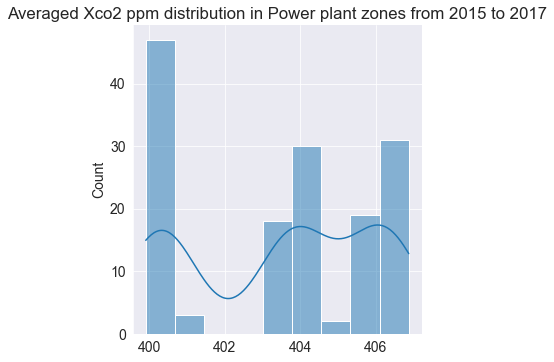

In [99]:
# Plot Xco2 Distribution

plt.figure(figsize = (12,6))
sns.displot(xco2, kde = True)
plt.title('Averaged Xco2 ppm distribution in Power plant zones from 2015 to 2017')
plt.set_ylabel = ('count')
plt.set_xlabel = ('Xco2 ppm')

plt.show();

### 50 Largest Coal Power plants

In [100]:
India_large_pp_50 = India_pp_data_coal_est.sort_values(by = 'capacity_mw', ascending = False).head(50)
India_large_pp_50

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.000000,30015.000000,35116.000000,24.0,82.75
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.000000,28078.000000,20311.000000,23.0,69.50
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.000000,25303.000000,24599.000000,23.0,69.50
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.000000,27671.000000,29909.000000,24.0,82.75
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.000000,16665.000000,16604.000000,21.5,80.00
12832,21.0966,85.0740,TALCHER STPS,3000.0,WRI,22480.000000,21370.000000,21490.000000,21.0,85.00
12709,24.0270,82.7915,RIHAND,3000.0,WRI,19628.000000,20486.000000,22019.000000,24.0,82.75
12781,22.1300,82.2930,SIPAT STPS,2980.0,WRI,21078.000000,22522.000000,21771.000000,22.0,82.25
12226,20.0063,79.2900,CHANDRAPUR_Coal,2920.0,WRI,11158.697000,13675.440000,13780.230000,20.0,79.25
12102,24.2010,82.7891,ANPARA,2630.0,WRI,11151.069472,13227.352350,15334.876300,24.0,82.75


In [101]:
India_pp_50 = India_pp_data_coal_est.sort_values(by = 'capacity_mw', ascending = False).head(50)
India_pp_50

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12924,24.0983,82.6719,VINDH_CHAL STPS,4760.0,WRI,29047.000000,30015.000000,35116.000000,24.0,82.75
12558,22.8230,69.5532,MUNDRA TPP,4620.0,WRI,30539.000000,28078.000000,20311.000000,23.0,69.50
12559,22.8158,69.5281,MUNDRA UMPP,4000.0,WRI,23679.000000,25303.000000,24599.000000,23.0,69.50
12753,23.9784,82.6275,SASAN UMPP,3960.0,WRI,29342.000000,27671.000000,29909.000000,24.0,82.75
12854,21.4129,79.9671,TIRORA TPP,3300.0,WRI,18964.000000,16665.000000,16604.000000,21.5,80.00
12832,21.0966,85.0740,TALCHER STPS,3000.0,WRI,22480.000000,21370.000000,21490.000000,21.0,85.00
12709,24.0270,82.7915,RIHAND,3000.0,WRI,19628.000000,20486.000000,22019.000000,24.0,82.75
12781,22.1300,82.2930,SIPAT STPS,2980.0,WRI,21078.000000,22522.000000,21771.000000,22.0,82.25
12226,20.0063,79.2900,CHANDRAPUR_Coal,2920.0,WRI,11158.697000,13675.440000,13780.230000,20.0,79.25
12102,24.2010,82.7891,ANPARA,2630.0,WRI,11151.069472,13227.352350,15334.876300,24.0,82.75


In [102]:
India_pp_50 = India_pp_50.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source', 
                                         'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_pp_50['est_Gt_co2_emms'] = India_pp_50['value'] * 9.3 * 1e-7
India_pp_50['est_Gt_co2_atm'] = India_pp_50['est_Gt_co2_emms'] * 0.45
India_pp_50

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value,est_Gt_co2_emms,est_Gt_co2_atm
0,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2015,29047.00,0.027014,0.012156
50,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2016,30015.00,0.027914,0.012561
100,24.0983,82.6719,VINDH_CHAL STPS,4760.0,24.0,82.75,generation_gwh_2017,35116.00,0.032658,0.014696
1,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2015,30539.00,0.028401,0.012781
51,22.8230,69.5532,MUNDRA TPP,4620.0,23.0,69.50,generation_gwh_2016,28078.00,0.026113,0.011751
...,...,...,...,...,...,...,...,...,...,...
96,28.4900,76.3510,MAHATMA GANDHI TPP,1320.0,28.5,76.25,generation_gwh_2016,2709.41,0.002520,0.001134
146,28.4900,76.3510,MAHATMA GANDHI TPP,1320.0,28.5,76.25,generation_gwh_2017,6889.57,0.006407,0.002883
48,25.4865,85.7452,BARH STPP II,1320.0,25.5,85.75,generation_gwh_2015,4056.00,0.003772,0.001697
98,25.4865,85.7452,BARH STPP II,1320.0,25.5,85.75,generation_gwh_2016,7177.00,0.006675,0.003004


In [103]:
India_pp_50.insert(2, 'xco2', xco2)

In [104]:
India_pp_50 = India_pp_50.drop(labels = 'generation_gwh', axis = 1).rename(columns = {'value' : 'generation_gwh'})

In [105]:
India_pp_50

,latitude,longitude,xco2,name,capacity_mw,latitude_est,longitude_est,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,24.0983,82.6719,400.974743,VINDH_CHAL STPS,4760.0,24.0,82.75,29047.00,0.027014,0.012156
50,24.0983,82.6719,404.587830,VINDH_CHAL STPS,4760.0,24.0,82.75,30015.00,0.027914,0.012561
100,24.0983,82.6719,406.872143,VINDH_CHAL STPS,4760.0,24.0,82.75,35116.00,0.032658,0.014696
1,22.8230,69.5532,399.992168,MUNDRA TPP,4620.0,23.0,69.50,30539.00,0.028401,0.012781
51,22.8230,69.5532,403.453750,MUNDRA TPP,4620.0,23.0,69.50,28078.00,0.026113,0.011751
...,...,...,...,...,...,...,...,...,...,...
96,28.4900,76.3510,403.883982,MAHATMA GANDHI TPP,1320.0,28.5,76.25,2709.41,0.002520,0.001134
146,28.4900,76.3510,406.224223,MAHATMA GANDHI TPP,1320.0,28.5,76.25,6889.57,0.006407,0.002883
48,25.4865,85.7452,400.449466,BARH STPP II,1320.0,25.5,85.75,4056.00,0.003772,0.001697
98,25.4865,85.7452,404.045131,BARH STPP II,1320.0,25.5,85.75,7177.00,0.006675,0.003004


### Plot spread 

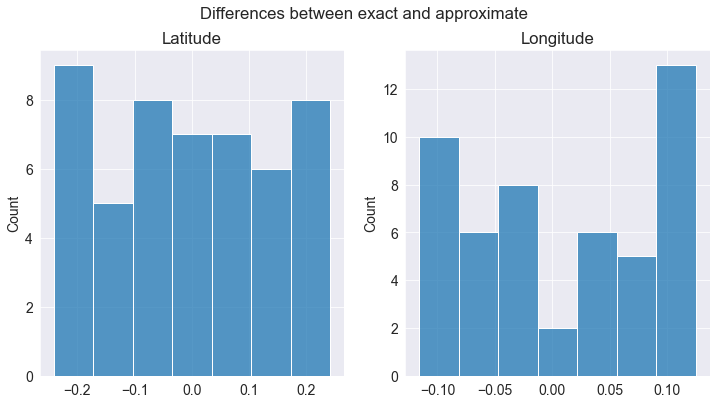

In [106]:
fig, ax = plt.subplots(1,2, figsize = (12,6))
plt.suptitle('Differences between exact and approximate')
g1 = sns.histplot(India_large_pp_50['latitude_est'] - India_large_pp_50['latitude'], ax = ax[0])
g1.set_title('Latitude')

g2 = sns.histplot(India_large_pp_50['longitude_est'] - India_large_pp_50['longitude'], ax = ax[1])
g2.set_title('Longitude');

### Drop latitudes and longitudes estimates

In [107]:
India_pp_50.drop(labels = ['latitude_est', 'longitude_est'], axis = 1, inplace = True)
India_pp_50

,latitude,longitude,xco2,name,capacity_mw,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,24.0983,82.6719,400.974743,VINDH_CHAL STPS,4760.0,29047.00,0.027014,0.012156
50,24.0983,82.6719,404.587830,VINDH_CHAL STPS,4760.0,30015.00,0.027914,0.012561
100,24.0983,82.6719,406.872143,VINDH_CHAL STPS,4760.0,35116.00,0.032658,0.014696
1,22.8230,69.5532,399.992168,MUNDRA TPP,4620.0,30539.00,0.028401,0.012781
51,22.8230,69.5532,403.453750,MUNDRA TPP,4620.0,28078.00,0.026113,0.011751
...,...,...,...,...,...,...,...,...
96,28.4900,76.3510,403.883982,MAHATMA GANDHI TPP,1320.0,2709.41,0.002520,0.001134
146,28.4900,76.3510,406.224223,MAHATMA GANDHI TPP,1320.0,6889.57,0.006407,0.002883
48,25.4865,85.7452,400.449466,BARH STPP II,1320.0,4056.00,0.003772,0.001697
98,25.4865,85.7452,404.045131,BARH STPP II,1320.0,7177.00,0.006675,0.003004


### Estimate emissions from 50 Coal Power plants

In [108]:
# Sum est_Gt_co2 emmissions for the 50 plants 
emm_2015 = sum([India_pp_50['est_Gt_co2_emms'][i] for i in range(0, len(India_pp_50), 3)])
emm_2016 = sum([India_pp_50['est_Gt_co2_emms'][i] for i in range(1, len(India_pp_50), 3)])
emm_2017 = sum([India_pp_50['est_Gt_co2_emms'][i] for i in range(2, len(India_pp_50), 3)])
print(f'2015 emissions from the 50 coal power plants is: {emm_2015:.4f} Gt_Co2'.format(emm_2015))
print(f'2016 emissions from the 50 coal power plants is: {emm_2016:.4f} Gt_Co2'.format(emm_2016))
print(f'2017 emissions from the 50 coal power plants is: {emm_2017:.4f} Gt_Co2'.format(emm_2017))

2015 emissions from the 50 coal power plants is: 0.4583 Gt_Co2
2016 emissions from the 50 coal power plants is: 0.4851 Gt_Co2
2017 emissions from the 50 coal power plants is: 0.4526 Gt_Co2


## 2. Gas Fired Power plants
7.9% of the powerplants are primarily powered by Gas

In [109]:
# Total Capacity of powerplants that use gas as primary fuel
India_cap_data[India_cap_data['primary_fuel'] == 'Gas']['cap_perc'].sum()

8.624654972612172

They harbour 8.62% of the plant power capacity in India

In [110]:
India_gas = India_cap_data[India_cap_data['primary_fuel'] == 'Gas']
India_gas

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12705,IND,India,RATNAGIRI GAS,IND0000371,1967.08,17.5587,73.1670,Gas,NaN,NaN,...,1150.4970,4472.098,4418.7150,NaN,black,0,0,0,140,0.681372
12434,IND,India,KONDAPALLI GT,IND0000206,1458.00,16.6400,80.5504,Gas,NaN,NaN,...,2024.6100,2211.188,644.4000,NaN,black,0,0,0,140,0.505033
12655,IND,India,PRAGATI CCCP -III,IND0000343,1371.20,28.7962,77.0706,Gas,NaN,NaN,...,1836.1148,1973.374,2844.5074,NaN,black,0,0,0,140,0.474966
12251,IND,India,DGEN MEGA CCCP,IND0000093,1200.00,21.6923,72.6215,Gas,NaN,NaN,...,2636.8640,2.970,0.0000,NaN,black,0,0,0,140,0.415665
12793,IND,India,SUGEN CCCP,IND0000428,1147.50,21.3395,72.9889,Gas,NaN,NaN,...,3516.4490,4654.180,6396.1200,NaN,black,0,0,0,140,0.397480
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12555,IND,India,MUMBAI BPCL,WRI1019971,31.20,19.0160,72.8948,Gas,NaN,NaN,...,NaN,NaN,NaN,302.026314,black,0,0,0,140,0.010807
12848,IND,India,THAL WORKS,WRI1019989,30.00,18.7026,72.8709,Gas,NaN,NaN,...,NaN,NaN,NaN,290.409918,black,0,0,0,140,0.010392
12273,IND,India,Dandeli Mill,WRI1019913,20.00,15.2529,74.6283,Gas,NaN,NaN,...,NaN,NaN,NaN,193.606612,black,0,0,0,140,0.006928
12861,IND,India,TROMBAY WORKS,WRI1019991,18.00,19.0366,72.8892,Gas,NaN,NaN,...,NaN,NaN,NaN,174.245951,black,0,0,0,140,0.006235


## Generation Data

In [111]:
India_gen_gas_data = India_gas.dropna(subset = ['generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'])
India_gen_gas_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12705,IND,India,RATNAGIRI GAS,IND0000371,1967.080,17.5587,73.1670,Gas,NaN,NaN,...,1150.497000,4472.098000,4418.715000,NaN,black,0,0,0,140,0.681372
12434,IND,India,KONDAPALLI GT,IND0000206,1458.000,16.6400,80.5504,Gas,NaN,NaN,...,2024.610000,2211.188000,644.400000,NaN,black,0,0,0,140,0.505033
12655,IND,India,PRAGATI CCCP -III,IND0000343,1371.200,28.7962,77.0706,Gas,NaN,NaN,...,1836.114800,1973.374000,2844.507400,NaN,black,0,0,0,140,0.474966
12251,IND,India,DGEN MEGA CCCP,IND0000093,1200.000,21.6923,72.6215,Gas,NaN,NaN,...,2636.864000,2.970000,0.000000,NaN,black,0,0,0,140,0.415665
12793,IND,India,SUGEN CCCP,IND0000428,1147.500,21.3395,72.9889,Gas,NaN,NaN,...,3516.449000,4654.180000,6396.120000,NaN,black,0,0,0,140,0.397480
12242,IND,India,DADRI GT,IND0000089,816.400,28.5932,77.6101,Gas,Oil,NaN,...,2924.000000,2178.000000,1575.000000,NaN,black,0,0,0,140,0.282791
12316,IND,India,GREL CCPP (RAJAMUNDRY),IND0000137,768.000,16.9248,81.8111,Gas,NaN,NaN,...,566.890000,626.684620,0.000000,7434.493889,black,0,0,0,140,0.266026
12628,IND,India,PALATANA CCPP,IND0000317,726.600,23.4987,91.4385,Gas,NaN,NaN,...,3337.293000,3993.958000,3870.430000,NaN,black,0,0,0,140,0.251685
12650,IND,India,PIPAVAV CCCP,IND0000338,702.860,20.8986,71.4693,Gas,Oil,NaN,...,454.954000,216.621274,160.528200,NaN,black,0,0,0,140,0.243462
12900,IND,India,URAN GT,IND0000485,672.000,18.8800,72.9715,Gas,NaN,NaN,...,2801.530000,3203.300000,3119.863000,NaN,black,0,0,0,140,0.232772


In [112]:
#Check if there are null capacity values
India_gen_gas_data['capacity_mw'].isnull().sum()

0

In [113]:
#Check if there are null capacity values
India_gen_gas_data['generation_gwh_2015'].isnull().sum(), India_gen_gas_data['generation_gwh_2016'].isnull().sum(), India_gen_gas_data['generation_gwh_2017'].isnull().sum()

(0, 0, 0)

### Capacity Distribution

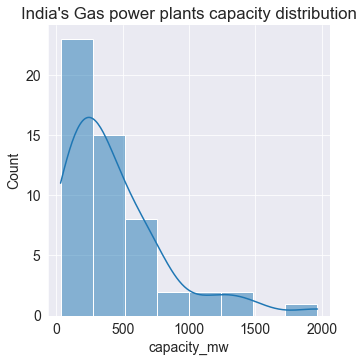

In [114]:
sns.displot(India_gen_gas_data,x = 'capacity_mw', kde = True)
plt.title("India's Gas power plants capacity distribution");

In [115]:
## Get a subset - subset for years which we have xco2 values
India_pp_data_gas = India_gen_gas_data[[
    "latitude","longitude", "name", "capacity_mw", "geolocation_source", 
    'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'
    ]
]
India_pp_data_gas

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12705,17.5587,73.1670,RATNAGIRI GAS,1967.080,WRI,1150.497000,4472.098000,4418.715000
12434,16.6400,80.5504,KONDAPALLI GT,1458.000,WRI,2024.610000,2211.188000,644.400000
12655,28.7962,77.0706,PRAGATI CCCP -III,1371.200,WRI,1836.114800,1973.374000,2844.507400
12251,21.6923,72.6215,DGEN MEGA CCCP,1200.000,WRI,2636.864000,2.970000,0.000000
12793,21.3395,72.9889,SUGEN CCCP,1147.500,WRI,3516.449000,4654.180000,6396.120000
12242,28.5932,77.6101,DADRI GT,816.400,WRI,2924.000000,2178.000000,1575.000000
12316,16.9248,81.8111,GREL CCPP (RAJAMUNDRY),768.000,WRI,566.890000,626.684620,0.000000
12628,23.4987,91.4385,PALATANA CCPP,726.600,WRI,3337.293000,3993.958000,3870.430000
12650,20.8986,71.4693,PIPAVAV CCCP,702.860,WRI,454.954000,216.621274,160.528200
12900,18.8800,72.9715,URAN GT,672.000,WRI,2801.530000,3203.300000,3119.863000


### Interpolate Power plants Longitudes and Latitudes to xco2 nearest measurements¶

In [116]:
India_pp_data_gas_est = India_pp_data_gas.copy(deep = True)
India_pp_data_gas_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12705,17.5587,73.1670,RATNAGIRI GAS,1967.080,WRI,1150.497000,4472.098000,4418.715000
12434,16.6400,80.5504,KONDAPALLI GT,1458.000,WRI,2024.610000,2211.188000,644.400000
12655,28.7962,77.0706,PRAGATI CCCP -III,1371.200,WRI,1836.114800,1973.374000,2844.507400
12251,21.6923,72.6215,DGEN MEGA CCCP,1200.000,WRI,2636.864000,2.970000,0.000000
12793,21.3395,72.9889,SUGEN CCCP,1147.500,WRI,3516.449000,4654.180000,6396.120000
12242,28.5932,77.6101,DADRI GT,816.400,WRI,2924.000000,2178.000000,1575.000000
12316,16.9248,81.8111,GREL CCPP (RAJAMUNDRY),768.000,WRI,566.890000,626.684620,0.000000
12628,23.4987,91.4385,PALATANA CCPP,726.600,WRI,3337.293000,3993.958000,3870.430000
12650,20.8986,71.4693,PIPAVAV CCCP,702.860,WRI,454.954000,216.621274,160.528200
12900,18.8800,72.9715,URAN GT,672.000,WRI,2801.530000,3203.300000,3119.863000


In [117]:
India_pp_data_gas_est['latitude_est'] = India_pp_data_gas_est['latitude'].mul(2).round().div(2)
India_pp_data_gas_est['longitude_est'] = India_pp_data_gas_est['longitude'].mul(4).round().div(4)
India_pp_data_gas_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12705,17.5587,73.1670,RATNAGIRI GAS,1967.080,WRI,1150.497000,4472.098000,4418.715000,17.5,73.25
12434,16.6400,80.5504,KONDAPALLI GT,1458.000,WRI,2024.610000,2211.188000,644.400000,16.5,80.50
12655,28.7962,77.0706,PRAGATI CCCP -III,1371.200,WRI,1836.114800,1973.374000,2844.507400,29.0,77.00
12251,21.6923,72.6215,DGEN MEGA CCCP,1200.000,WRI,2636.864000,2.970000,0.000000,21.5,72.50
12793,21.3395,72.9889,SUGEN CCCP,1147.500,WRI,3516.449000,4654.180000,6396.120000,21.5,73.00
12242,28.5932,77.6101,DADRI GT,816.400,WRI,2924.000000,2178.000000,1575.000000,28.5,77.50
12316,16.9248,81.8111,GREL CCPP (RAJAMUNDRY),768.000,WRI,566.890000,626.684620,0.000000,17.0,81.75
12628,23.4987,91.4385,PALATANA CCPP,726.600,WRI,3337.293000,3993.958000,3870.430000,23.5,91.50
12650,20.8986,71.4693,PIPAVAV CCCP,702.860,WRI,454.954000,216.621274,160.528200,21.0,71.50
12900,18.8800,72.9715,URAN GT,672.000,WRI,2801.530000,3203.300000,3119.863000,19.0,73.00


### 10 Largest Gas Powered Power Plants

In [118]:
## Sort by Capacity
India_large_gas_pp = India_pp_data_gas_est.sort_values(by = 'capacity_mw', ascending = False).head(10)
India_large_gas_pp

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12705,17.5587,73.1670,RATNAGIRI GAS,1967.08,WRI,1150.4970,4472.098000,4418.7150,17.5,73.25
12434,16.6400,80.5504,KONDAPALLI GT,1458.00,WRI,2024.6100,2211.188000,644.4000,16.5,80.50
12655,28.7962,77.0706,PRAGATI CCCP -III,1371.20,WRI,1836.1148,1973.374000,2844.5074,29.0,77.00
12251,21.6923,72.6215,DGEN MEGA CCCP,1200.00,WRI,2636.8640,2.970000,0.0000,21.5,72.50
12793,21.3395,72.9889,SUGEN CCCP,1147.50,WRI,3516.4490,4654.180000,6396.1200,21.5,73.00
12242,28.5932,77.6101,DADRI GT,816.40,WRI,2924.0000,2178.000000,1575.0000,28.5,77.50
12316,16.9248,81.8111,GREL CCPP (RAJAMUNDRY),768.00,WRI,566.8900,626.684620,0.0000,17.0,81.75
12628,23.4987,91.4385,PALATANA CCPP,726.60,WRI,3337.2930,3993.958000,3870.4300,23.5,91.50
12650,20.8986,71.4693,PIPAVAV CCCP,702.86,WRI,454.9540,216.621274,160.5282,21.0,71.50
12900,18.8800,72.9715,URAN GT,672.00,WRI,2801.5300,3203.300000,3119.8630,19.0,73.00


In [119]:
India_gas_pp = India_large_gas_pp.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                                    'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_gas_pp

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2015,1150.497000
10,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2016,4472.098000
20,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2017,4418.715000
1,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2015,2024.610000
11,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2016,2211.188000
21,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2017,644.400000
2,28.7962,77.0706,PRAGATI CCCP -III,1371.20,29.0,77.00,generation_gwh_2015,1836.114800
12,28.7962,77.0706,PRAGATI CCCP -III,1371.20,29.0,77.00,generation_gwh_2016,1973.374000
22,28.7962,77.0706,PRAGATI CCCP -III,1371.20,29.0,77.00,generation_gwh_2017,2844.507400
3,21.6923,72.6215,DGEN MEGA CCCP,1200.00,21.5,72.50,generation_gwh_2015,2636.864000


### CO2 Baseline Database for the Indian Power Sector
Source: Government of India, Ministry of Power, Central Electricity Authority, Sewa Bhawan, R.K.Puram, [Link](https://cea.nic.in/wp-content/uploads/baseline/2020/07/user_guide_ver14.pdf)

Weighted average specific emissions for fossil fuel-fired stations in FY 2017-18,
in t CO2/MWh 
- Coal - $0.97 T/mwh$ => $970 T/gwh$ => $9.7 * 1e-7 Gt/gwh$
- Diesel - $0.70 T/mwh$ => $700 T/gwh$ => $7.0 * 1e-7 Gt/gwh$
- Gas* - $0.45 T/mwh$ => $450 T/gwh$ => $4.5 * 1e-7 Gt/gwh$ - Only gas-fired stations that do not use any other fuel. Stations that use naphtha, diesel or oil as a second fuel are excluded from the weighted average. 
- Lignite - $1.36 T/mwh$ => $1360 T/gwh$ => $1.36 * 1e-6 Gt/gwh$
- Oil - $0.77 T/mwh$ => $770 T/gwh$ => $7.7 * 1e-7 Gt/gwh$ - Source: [link](https://www.rte-france.com/en/eco2mix/co2-emissions#:~:text=Real%2Dtime%20calculation%20of%20CO2%20emissions&text=0.777%20t%20CO2%20eq%20/MWh,MWh%20for%20biofuel%20plants%20(waste))

Note natural sinks (ocean and biosphere) absorb approximately 55% of human emissions, so the "airborne fraction" added to the atmosphere is about 45%. Source: [Skeptical Science](https://skepticalscience.com/print.php?r=45)

In [120]:
India_gas_pp['est_Gt_co2_emms'] = India_gas_pp['value'] * 7.0 * 1e-7
India_gas_pp['est_Gt_co2_atm'] = India_gas_pp['est_Gt_co2_emms'] * 0.45
India_gas_pp

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value,est_Gt_co2_emms,est_Gt_co2_atm
0,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2015,1150.497000,0.000805,3.624066e-04
10,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2016,4472.098000,0.003130,1.408711e-03
20,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2017,4418.715000,0.003093,1.391895e-03
1,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2015,2024.610000,0.001417,6.377521e-04
11,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2016,2211.188000,0.001548,6.965242e-04
21,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2017,644.400000,0.000451,2.029860e-04
2,28.7962,77.0706,PRAGATI CCCP -III,1371.20,29.0,77.00,generation_gwh_2015,1836.114800,0.001285,5.783762e-04
12,28.7962,77.0706,PRAGATI CCCP -III,1371.20,29.0,77.00,generation_gwh_2016,1973.374000,0.001381,6.216128e-04
22,28.7962,77.0706,PRAGATI CCCP -III,1371.20,29.0,77.00,generation_gwh_2017,2844.507400,0.001991,8.960198e-04
3,21.6923,72.6215,DGEN MEGA CCCP,1200.00,21.5,72.50,generation_gwh_2015,2636.864000,0.001846,8.306122e-04


### Check power plant xco2 Levels

In [121]:
#1.Check xco2 levels in RATNAGIRI GAS
annual_India_xco2[annual_India_xco2['latitude'] == 17.5][annual_India_xco2['longitude'] == 73.75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1758064994.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17.5][annual_India_xco2['longitude'] == 73.75]


,Year,longitude,latitude,xco2
540,2015,73.75,17.5,399.879862
3266,2016,73.75,17.5,403.262081
5992,2017,73.75,17.5,405.638075
8718,2018,73.75,17.5,407.769317
11444,2019,73.75,17.5,410.648569
14170,2020,73.75,17.5,412.991465
16896,2021,73.75,17.5,415.407107
19622,2022,73.75,17.5,416.565111


In [122]:
#2. Check xco2 levels in KONDAPALLI GT
annual_India_xco2[annual_India_xco2['latitude'] == 16.5][annual_India_xco2['longitude'] == 80.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4186837820.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 16.5][annual_India_xco2['longitude'] == 80.625]


,Year,longitude,latitude,xco2
1176,2015,80.625,16.5,400.123459
3902,2016,80.625,16.5,403.618628
6628,2017,80.625,16.5,406.007666
9354,2018,80.625,16.5,408.091974
12080,2019,80.625,16.5,410.940087
14806,2020,80.625,16.5,413.346599
17532,2021,80.625,16.5,415.751454
20258,2022,80.625,16.5,416.797138


In [123]:
#3. Check xco2 levels in PRAGATI CCCP -III
annual_India_xco2[annual_India_xco2['latitude'] == 29][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\52616492.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 29][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
911,2015,77.5,29.0,400.550908
3637,2016,77.5,29.0,404.240802
6363,2017,77.5,29.0,406.477237
9089,2018,77.5,29.0,408.868787
11815,2019,77.5,29.0,411.399232
14541,2020,77.5,29.0,413.807487
17267,2021,77.5,29.0,416.473662
19993,2022,77.5,29.0,417.753936


In [124]:
#4. check xco2 levels in DGEN MEGA CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 72.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\883735068.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 72.5]


,Year,longitude,latitude,xco2
432,2015,72.5,21.5,400.052379
3158,2016,72.5,21.5,403.495741
5884,2017,72.5,21.5,405.926892
8610,2018,72.5,21.5,407.994197
11336,2019,72.5,21.5,410.844895
14062,2020,72.5,21.5,413.199009
16788,2021,72.5,21.5,415.591920
19514,2022,72.5,21.5,416.862704


In [125]:
#5. check xco2 levels in SUGEN CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1787048855.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 73.125]


,Year,longitude,latitude,xco2
490,2015,73.125,21.5,400.076507
3216,2016,73.125,21.5,403.527214
5942,2017,73.125,21.5,405.960123
8668,2018,73.125,21.5,408.016648
11394,2019,73.125,21.5,410.886973
14120,2020,73.125,21.5,413.247246
16846,2021,73.125,21.5,415.655237
19572,2022,73.125,21.5,416.835534


In [126]:
#6. check xco2 levels in DADRI GT
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4095221147.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
910,2015,77.5,28.5,400.753525
3636,2016,77.5,28.5,404.483031
6362,2017,77.5,28.5,406.719574
9088,2018,77.5,28.5,409.138578
11814,2019,77.5,28.5,411.722786
14540,2020,77.5,28.5,414.086657
17266,2021,77.5,28.5,416.767844
19992,2022,77.5,28.5,418.188555


In [127]:
#7. check xco2 levels in GREL CCPP (RAJAMUNDRY)
annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 81.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2210189050.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 81.875]


,Year,longitude,latitude,xco2
1293,2015,81.875,17.0,400.111799
4019,2016,81.875,17.0,403.585796
6745,2017,81.875,17.0,405.998649
9471,2018,81.875,17.0,408.077747
12197,2019,81.875,17.0,410.920556
14923,2020,81.875,17.0,413.321807
17649,2021,81.875,17.0,415.727787
20375,2022,81.875,17.0,416.699639


In [128]:
#8. check xco2 levels in PALATANA CCPP
annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 91.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2038992894.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 91.875]


,Year,longitude,latitude,xco2
2234,2015,91.875,23.5,400.248282
4960,2016,91.875,23.5,403.737958
7686,2017,91.875,23.5,406.088942
10412,2018,91.875,23.5,408.280254
13138,2019,91.875,23.5,410.901203
15864,2020,91.875,23.5,413.335732
18590,2021,91.875,23.5,415.907224
21316,2022,91.875,23.5,417.080391


In [129]:
#9. check xco2 levels in PIPAVAV CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 71.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2525771279.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 71.875]


,Year,longitude,latitude,xco2
373,2015,71.875,21.0,399.989461
3099,2016,71.875,21.0,403.416614
5825,2017,71.875,21.0,405.839167
8551,2018,71.875,21.0,407.917467
11277,2019,71.875,21.0,410.778126
14003,2020,71.875,21.0,413.119711
16729,2021,71.875,21.0,415.504428
19455,2022,71.875,21.0,416.801452


In [130]:
#10. check xco2 levels in PIPAVAV CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 19][annual_India_xco2['longitude'] == 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1125065223.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 19][annual_India_xco2['longitude'] == 73.125]


,Year,longitude,latitude,xco2
485,2015,73.125,19.0,400.125338
3211,2016,73.125,19.0,403.503701
5937,2017,73.125,19.0,405.939281
8663,2018,73.125,19.0,408.044202
11389,2019,73.125,19.0,410.911564
14115,2020,73.125,19.0,413.267012
16841,2021,73.125,19.0,415.697647
19567,2022,73.125,19.0,417.094821


### Next 20 Power plants

In [131]:

India_large_gas_pp_20 = India_pp_data_gas_est.sort_values(by = 'capacity_mw', ascending = False)[10:30]
India_large_gas_pp_20

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12625,21.7800,72.9790,PAGUTHAN,655.000,WRI,875.540000,273.010000,424.7300,22.0,73.00
12109,26.6282,79.5286,AURAIYA GT,652.000,WRI,1465.000000,509.000000,357.0000,26.5,79.50
12296,21.8242,73.1136,GANDHAR GT,648.000,WRI,923.000000,2290.811000,3031.0000,22.0,73.00
12410,21.1750,72.6879,KAWAS GT,645.000,WRI,1174.000000,1673.000000,2340.0000,21.0,72.75
12258,22.2396,72.7520,DHUVARAN CCPP,595.200,WRI,384.538000,283.748110,549.8693,22.0,72.75
12284,21.1110,72.6550,ESSAR GT IMP.,515.000,WRI,0.000000,0.000000,0.0000,21.0,72.75
12301,17.0386,82.1286,GAUTAMI CCCP,468.570,WRI,100.650000,0.000000,0.0000,17.0,82.25
12371,16.9312,81.8600,JEGURUPADU GT,445.674,WRI,666.941000,999.650000,1030.9900,17.0,81.75
12289,28.3452,77.3615,F_BAD CCGT,431.586,WRI,1068.000000,1004.908000,811.0000,28.5,77.25
12103,25.1797,76.3188,ANTA GT,419.330,WRI,909.000000,666.420000,430.0000,25.0,76.25


In [132]:
India_gas_pp_20 = India_large_gas_pp_20.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                               'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_gas_pp_20

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,21.7800,72.9790,PAGUTHAN,655.000,22.0,73.00,generation_gwh_2015,875.540000
20,21.7800,72.9790,PAGUTHAN,655.000,22.0,73.00,generation_gwh_2016,273.010000
40,21.7800,72.9790,PAGUTHAN,655.000,22.0,73.00,generation_gwh_2017,424.730000
1,26.6282,79.5286,AURAIYA GT,652.000,26.5,79.50,generation_gwh_2015,1465.000000
21,26.6282,79.5286,AURAIYA GT,652.000,26.5,79.50,generation_gwh_2016,509.000000
41,26.6282,79.5286,AURAIYA GT,652.000,26.5,79.50,generation_gwh_2017,357.000000
2,21.8242,73.1136,GANDHAR GT,648.000,22.0,73.00,generation_gwh_2015,923.000000
22,21.8242,73.1136,GANDHAR GT,648.000,22.0,73.00,generation_gwh_2016,2290.811000
42,21.8242,73.1136,GANDHAR GT,648.000,22.0,73.00,generation_gwh_2017,3031.000000
3,21.1750,72.6879,KAWAS GT,645.000,21.0,72.75,generation_gwh_2015,1174.000000


In [133]:
#12. check xco2 levels in PAGUTHAN
annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\232511857.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 73.125]


,Year,longitude,latitude,xco2
491,2015,73.125,22.0,400.108326
3217,2016,73.125,22.0,403.567687
5943,2017,73.125,22.0,405.988386
8669,2018,73.125,22.0,408.055810
11395,2019,73.125,22.0,410.921001
14121,2020,73.125,22.0,413.273593
16847,2021,73.125,22.0,415.695923
19573,2022,73.125,22.0,416.853743


In [134]:
#12. check xco2 levels in AURAIYA GT
annual_India_xco2[annual_India_xco2['latitude'] == 26.5][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1994295584.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 26.5][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1138,2015,80.0,26.5,400.364027
3864,2016,80.0,26.5,404.096324
6590,2017,80.0,26.5,406.339585
9316,2018,80.0,26.5,408.722902
12042,2019,80.0,26.5,411.330706
14768,2020,80.0,26.5,413.670626
17494,2021,80.0,26.5,416.263531
20220,2022,80.0,26.5,417.424170


In [135]:
#13. check xco2 levels in GANDHAR GT
annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2744157245.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 73.125]


,Year,longitude,latitude,xco2
491,2015,73.125,22.0,400.108326
3217,2016,73.125,22.0,403.567687
5943,2017,73.125,22.0,405.988386
8669,2018,73.125,22.0,408.055810
11395,2019,73.125,22.0,410.921001
14121,2020,73.125,22.0,413.273593
16847,2021,73.125,22.0,415.695923
19573,2022,73.125,22.0,416.853743


In [136]:
#14. check xco2 levels in KAWAS GT 
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 72.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2872245947.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 72.5]


,Year,longitude,latitude,xco2
431,2015,72.5,21.0,400.021654
3157,2016,72.5,21.0,403.456618
5883,2017,72.5,21.0,405.891205
8609,2018,72.5,21.0,407.950138
11335,2019,72.5,21.0,410.815995
14061,2020,72.5,21.0,413.168141
16787,2021,72.5,21.0,415.556176
19513,2022,72.5,21.0,416.834298


In [137]:
#15. check xco2 levels in DHUVARAN CCPP
annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 72.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4127862859.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22][annual_India_xco2['longitude'] == 72.5]


,Year,longitude,latitude,xco2
433,2015,72.5,22.0,400.088602
3159,2016,72.5,22.0,403.538419
5885,2017,72.5,22.0,405.957100
8611,2018,72.5,22.0,408.037085
11337,2019,72.5,22.0,410.881732
14063,2020,72.5,22.0,413.237073
16789,2021,72.5,22.0,415.634587
19515,2022,72.5,22.0,416.915802


In [138]:
#16. check xco2 levels in ESSAR GT IMP
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 72.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\336560633.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 72.5]


,Year,longitude,latitude,xco2
431,2015,72.5,21.0,400.021654
3157,2016,72.5,21.0,403.456618
5883,2017,72.5,21.0,405.891205
8609,2018,72.5,21.0,407.950138
11335,2019,72.5,21.0,410.815995
14061,2020,72.5,21.0,413.168141
16787,2021,72.5,21.0,415.556176
19513,2022,72.5,21.0,416.834298


In [139]:
#17. check xco2 levels in GAUTAMI CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 82.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3288153005.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 82.5]


,Year,longitude,latitude,xco2
1351,2015,82.5,17.0,400.132877
4077,2016,82.5,17.0,403.639350
6803,2017,82.5,17.0,406.048066
9529,2018,82.5,17.0,408.119101
12255,2019,82.5,17.0,410.939133
14981,2020,82.5,17.0,413.343972
17707,2021,82.5,17.0,415.745804
20433,2022,82.5,17.0,416.765214


In [140]:
#18. check xco2 levels in JEGURUPADU GT
annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 81.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3547338285.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 81.875]


,Year,longitude,latitude,xco2
1293,2015,81.875,17.0,400.111799
4019,2016,81.875,17.0,403.585796
6745,2017,81.875,17.0,405.998649
9471,2018,81.875,17.0,408.077747
12197,2019,81.875,17.0,410.920556
14923,2020,81.875,17.0,413.321807
17649,2021,81.875,17.0,415.727787
20375,2022,81.875,17.0,416.699639


In [141]:
#19. check xco2 levels in F_BAD CCGT
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\449531451.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
910,2015,77.5,28.5,400.753525
3636,2016,77.5,28.5,404.483031
6362,2017,77.5,28.5,406.719574
9088,2018,77.5,28.5,409.138578
11814,2019,77.5,28.5,411.722786
14540,2020,77.5,28.5,414.086657
17266,2021,77.5,28.5,416.767844
19992,2022,77.5,28.5,418.188555


In [142]:
#20. check xco2 levels in ANTA GT
annual_India_xco2[annual_India_xco2['latitude'] == 25][annual_India_xco2['longitude'] == 76.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2015999765.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 25][annual_India_xco2['longitude'] == 76.25]


,Year,longitude,latitude,xco2
787,2015,76.25,25.0,400.186562
3513,2016,76.25,25.0,403.821291
6239,2017,76.25,25.0,406.110165
8965,2018,76.25,25.0,408.305114
11691,2019,76.25,25.0,411.125849
14417,2020,76.25,25.0,413.412266
17143,2021,76.25,25.0,415.956750
19869,2022,76.25,25.0,416.970199


In [143]:
#21. check xco2 levels in VEMAGIRI CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 81.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2833134483.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17][annual_India_xco2['longitude'] == 81.875]


,Year,longitude,latitude,xco2
1293,2015,81.875,17.0,400.111799
4019,2016,81.875,17.0,403.585796
6745,2017,81.875,17.0,405.998649
9471,2018,81.875,17.0,408.077747
12197,2019,81.875,17.0,410.920556
14923,2020,81.875,17.0,413.321807
17649,2021,81.875,17.0,415.727787
20375,2022,81.875,17.0,416.699639


In [144]:
#22. check xco2 levels in UNO SUGEN
annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2171636206.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21.5][annual_India_xco2['longitude'] == 73.125]


,Year,longitude,latitude,xco2
490,2015,73.125,21.5,400.076507
3216,2016,73.125,21.5,403.527214
5942,2017,73.125,21.5,405.960123
8668,2018,73.125,21.5,408.016648
11394,2019,73.125,21.5,410.886973
14120,2020,73.125,21.5,413.247246
16846,2021,73.125,21.5,415.655237
19572,2022,73.125,21.5,416.835534


In [145]:
#23, 24. check xco2 levels in UTRAN CCCP EXT & HAZIRA-GSECL
annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 72.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3311503571.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 21][annual_India_xco2['longitude'] == 72.5]


,Year,longitude,latitude,xco2
431,2015,72.5,21.0,400.021654
3157,2016,72.5,21.0,403.456618
5883,2017,72.5,21.0,405.891205
8609,2018,72.5,21.0,407.950138
11335,2019,72.5,21.0,410.815995
14061,2020,72.5,21.0,413.168141
16787,2021,72.5,21.0,415.556176
19513,2022,72.5,21.0,416.834298


In [146]:
#25. check xco2 levels in KAYAM KULAM GT
annual_India_xco2[annual_India_xco2['latitude'] == 9][annual_India_xco2['longitude'] == 76.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3195672941.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 9][annual_India_xco2['longitude'] == 76.875]


,Year,longitude,latitude,xco2
813,2015,76.875,9.0,399.828046
3539,2016,76.875,9.0,403.224150
6265,2017,76.875,9.0,405.604482
8991,2018,76.875,9.0,407.704796
11717,2019,76.875,9.0,410.445248
14443,2020,76.875,9.0,412.917728
17169,2021,76.875,9.0,415.222832
19895,2022,76.875,9.0,416.556032


In [147]:
#26. check xco2 levels in P.NALLUR CCGT
annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80.]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\831945631.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80.]


,Year,longitude,latitude,xco2
1107,2015,80.0,11.0,399.889835
3833,2016,80.0,11.0,403.354376
6559,2017,80.0,11.0,405.761563
9285,2018,80.0,11.0,407.749449
12011,2019,80.0,11.0,410.553266
14737,2020,80.0,11.0,413.046436
17463,2021,80.0,11.0,415.418222
20189,2022,80.0,11.0,416.654008


In [148]:
#27. check xco2 levels in PRAGATI CCGT
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3726253354.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
910,2015,77.5,28.5,400.753525
3636,2016,77.5,28.5,404.483031
6362,2017,77.5,28.5,406.719574
9088,2018,77.5,28.5,409.138578
11814,2019,77.5,28.5,411.722786
14540,2020,77.5,28.5,414.086657
17266,2021,77.5,28.5,416.767844
19992,2022,77.5,28.5,418.188555


In [149]:
#28. check xco2 levels in DHOLPUR	
annual_India_xco2[annual_India_xco2['latitude'] == 26.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4028532123.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 26.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
906,2015,77.5,26.5,400.223822
3632,2016,77.5,26.5,403.904087
6358,2017,77.5,26.5,406.186652
9084,2018,77.5,26.5,408.502345
11810,2019,77.5,26.5,411.203269
14536,2020,77.5,26.5,413.536307
17262,2021,77.5,26.5,416.092115
19988,2022,77.5,26.5,417.263185


In [150]:
#29. check xco2 levels in G.I.P.C.L. GT
annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3804697928.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 73.125]


,Year,longitude,latitude,xco2
492,2015,73.125,22.5,400.167836
3218,2016,73.125,22.5,403.631802
5944,2017,73.125,22.5,406.032674
8670,2018,73.125,22.5,408.123499
11396,2019,73.125,22.5,410.983447
14122,2020,73.125,22.5,413.326455
16848,2021,73.125,22.5,415.770741
19574,2022,73.125,22.5,416.918468


In [151]:
#30. check xco2 levels in KATHALGURI GT
annual_India_xco2[annual_India_xco2['latitude'] == 27.5][annual_India_xco2['longitude'] == 95.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1217793015.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 27.5][annual_India_xco2['longitude'] == 95.625]


,Year,longitude,latitude,xco2
2590,2015,95.625,27.5,400.444107
5316,2016,95.625,27.5,403.931180
8042,2017,95.625,27.5,406.283641
10768,2018,95.625,27.5,408.505204
13494,2019,95.625,27.5,411.026502
16220,2020,95.625,27.5,413.617965
18946,2021,95.625,27.5,416.198407
21672,2022,95.625,27.5,416.867863


### Subsequent (Next Next)23 Power plants

In [152]:
India_subgas_pp_23 = India_pp_data_gas_est.sort_values(by = 'capacity_mw', ascending = False)[30:]
India_subgas_pp_23

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12922,16.9345,81.7245,VIJESWARAM GT,272.30,WRI,693.874313,669.578138,1156.305799,17.0,81.75
12696,27.3360,70.5380,RAMGARH GT,270.50,WRI,1459.399526,1367.924230,1391.014850,27.5,70.50
12350,28.6194,77.2504,I.P.GT,270.00,WRI,445.882000,673.162000,562.509000,28.5,77.25
12646,17.0853,82.1283,PEDDAPURAM CCGT(Samalkot),220.00,WRI,0.000000,0.000000,0.000000,17.0,82.25
12837,12.9019,74.8160,TANIR BAVI,220.00,WRI,0.000000,0.000000,0.000000,13.0,74.75
12313,17.0587,82.3097,GODAVARI GT,205.24,WRI,535.411000,933.370000,553.615000,17.0,82.25
12912,9.3484,78.9235,VALUTHUR GT,186.20,WRI,680.475000,906.996000,1198.136000,9.5,79.00
12860,19.0018,72.8967,TROMBAY GT,180.00,WRI,1149.000000,1372.000000,1314.000000,19.0,73.00
12189,10.0740,76.3188,BSES Kerala CCGT,165.00,WRI,3.417200,0.000000,60.718000,10.0,76.25
12583,27.1858,95.3760,NAMRUP GT,161.75,WRI,487.339000,333.180000,306.396000,27.0,95.50


In [153]:
len(India_subgas_pp_23)

23

In [154]:
India_subgas_pp_23 = India_subgas_pp_23.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                                 'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = [ 'geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_subgas_pp_23

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,16.9345,81.7245,VIJESWARAM GT,272.3,17.0,81.75,generation_gwh_2015,693.874313
23,16.9345,81.7245,VIJESWARAM GT,272.3,17.0,81.75,generation_gwh_2016,669.578138
46,16.9345,81.7245,VIJESWARAM GT,272.3,17.0,81.75,generation_gwh_2017,1156.305799
1,27.3360,70.5380,RAMGARH GT,270.5,27.5,70.50,generation_gwh_2015,1459.399526
24,27.3360,70.5380,RAMGARH GT,270.5,27.5,70.50,generation_gwh_2016,1367.924230
...,...,...,...,...,...,...,...,...
44,23.8070,91.5650,BARAMURA,42.0,24.0,91.50,generation_gwh_2016,187.193669
67,23.8070,91.5650,BARAMURA,42.0,24.0,91.50,generation_gwh_2017,178.106690
22,10.9325,79.8216,KARAIKAL,32.5,11.0,79.75,generation_gwh_2015,212.919179
45,10.9325,79.8216,KARAIKAL,32.5,11.0,79.75,generation_gwh_2016,231.324710


In [155]:
India_subgas_pp_23[:39]

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,16.9345,81.7245,VIJESWARAM GT,272.30,17.0,81.75,generation_gwh_2015,693.874313
23,16.9345,81.7245,VIJESWARAM GT,272.30,17.0,81.75,generation_gwh_2016,669.578138
46,16.9345,81.7245,VIJESWARAM GT,272.30,17.0,81.75,generation_gwh_2017,1156.305799
1,27.3360,70.5380,RAMGARH GT,270.50,27.5,70.50,generation_gwh_2015,1459.399526
24,27.3360,70.5380,RAMGARH GT,270.50,27.5,70.50,generation_gwh_2016,1367.924230
47,27.3360,70.5380,RAMGARH GT,270.50,27.5,70.50,generation_gwh_2017,1391.014850
2,28.6194,77.2504,I.P.GT,270.00,28.5,77.25,generation_gwh_2015,445.882000
25,28.6194,77.2504,I.P.GT,270.00,28.5,77.25,generation_gwh_2016,673.162000
48,28.6194,77.2504,I.P.GT,270.00,28.5,77.25,generation_gwh_2017,562.509000
4,12.9019,74.8160,TANIR BAVI,220.00,13.0,74.75,generation_gwh_2015,0.000000


In [156]:
#31. check xco2 levels in 	VIJESWARAM GT
annual_India_xco2[annual_India_xco2['latitude'] == 17.][annual_India_xco2['longitude'] == 81.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1890724028.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17.][annual_India_xco2['longitude'] == 81.875]


,Year,longitude,latitude,xco2
1293,2015,81.875,17.0,400.111799
4019,2016,81.875,17.0,403.585796
6745,2017,81.875,17.0,405.998649
9471,2018,81.875,17.0,408.077747
12197,2019,81.875,17.0,410.920556
14923,2020,81.875,17.0,413.321807
17649,2021,81.875,17.0,415.727787
20375,2022,81.875,17.0,416.699639


In [157]:
#32. check xco2 levels in RAMGARH GT
annual_India_xco2[annual_India_xco2['latitude'] == 27.5][annual_India_xco2['longitude'] == 70.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2537157832.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 27.5][annual_India_xco2['longitude'] == 70.625]


,Year,longitude,latitude,xco2
270,2015,70.625,27.5,400.010145
2996,2016,70.625,27.5,403.472617
5722,2017,70.625,27.5,405.868731
8448,2018,70.625,27.5,407.967732
11174,2019,70.625,27.5,410.679250
13900,2020,70.625,27.5,413.151572
16626,2021,70.625,27.5,415.669119
19352,2022,70.625,27.5,417.211918


In [158]:
#33. check xco2 levels in I.P.GT
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1124179825.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
910,2015,77.5,28.5,400.753525
3636,2016,77.5,28.5,404.483031
6362,2017,77.5,28.5,406.719574
9088,2018,77.5,28.5,409.138578
11814,2019,77.5,28.5,411.722786
14540,2020,77.5,28.5,414.086657
17266,2021,77.5,28.5,416.767844
19992,2022,77.5,28.5,418.188555


In [159]:
#34. check xco2 levels in TANIR BAVI
annual_India_xco2[annual_India_xco2['latitude'] == 13.][annual_India_xco2['longitude'] == 75]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1707617650.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 13.][annual_India_xco2['longitude'] == 75]


,Year,longitude,latitude,xco2
647,2015,75.0,13.0,399.882693
3373,2016,75.0,13.0,403.302008
6099,2017,75.0,13.0,405.618255
8825,2018,75.0,13.0,407.841180
11551,2019,75.0,13.0,410.640055
14277,2020,75.0,13.0,413.008101
17003,2021,75.0,13.0,415.337692
19729,2022,75.0,13.0,416.567925


In [160]:
#35, 36. check xco2 levels in PEDDAPURAM CCGT(Samalkot & GODAVARI GT
annual_India_xco2[annual_India_xco2['latitude'] == 17.][annual_India_xco2['longitude'] == 82.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\521502909.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 17.][annual_India_xco2['longitude'] == 82.5]


,Year,longitude,latitude,xco2
1351,2015,82.5,17.0,400.132877
4077,2016,82.5,17.0,403.639350
6803,2017,82.5,17.0,406.048066
9529,2018,82.5,17.0,408.119101
12255,2019,82.5,17.0,410.939133
14981,2020,82.5,17.0,413.343972
17707,2021,82.5,17.0,415.745804
20433,2022,82.5,17.0,416.765214


In [161]:
#37. check xco2 levels in VALUTHUR GT
annual_India_xco2[annual_India_xco2['latitude'] == 9.5][annual_India_xco2['longitude'] == 79.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4097495692.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 9.5][annual_India_xco2['longitude'] == 79.375]


,Year,longitude,latitude,xco2
1046,2015,79.375,9.5,399.833285
3772,2016,79.375,9.5,403.276645
6498,2017,79.375,9.5,405.654563
9224,2018,79.375,9.5,407.710555
11950,2019,79.375,9.5,410.459693
14676,2020,79.375,9.5,412.978800
17402,2021,79.375,9.5,415.313585
20128,2022,79.375,9.5,416.708059


In [162]:
#38. check xco2 levels in TROMBAY GT
annual_India_xco2[annual_India_xco2['latitude'] == 19][annual_India_xco2['longitude']== 73.125]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4170409468.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 19][annual_India_xco2['longitude']== 73.125]


,Year,longitude,latitude,xco2
485,2015,73.125,19.0,400.125338
3211,2016,73.125,19.0,403.503701
5937,2017,73.125,19.0,405.939281
8663,2018,73.125,19.0,408.044202
11389,2019,73.125,19.0,410.911564
14115,2020,73.125,19.0,413.267012
16841,2021,73.125,19.0,415.697647
19567,2022,73.125,19.0,417.094821


In [163]:
#39. check xco2 levels in BSES Kerala CCGT
annual_India_xco2[annual_India_xco2['latitude'] == 10][annual_India_xco2['longitude']== 76.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1913360655.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 10][annual_India_xco2['longitude']== 76.25]


,Year,longitude,latitude,xco2
757,2015,76.25,10.0,399.924900
3483,2016,76.25,10.0,403.348499
6209,2017,76.25,10.0,405.695631
8935,2018,76.25,10.0,407.840391
11661,2019,76.25,10.0,410.565018
14387,2020,76.25,10.0,413.017876
17113,2021,76.25,10.0,415.324808
19839,2022,76.25,10.0,416.780585


In [164]:
#40. check xco2 levels in NAMRUP GT	
annual_India_xco2[annual_India_xco2['latitude'] == 27][annual_India_xco2['longitude'] == 95.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\4118155348.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 27][annual_India_xco2['longitude'] == 95.625]


,Year,longitude,latitude,xco2
2589,2015,95.625,27.0,400.011769
5315,2016,95.625,27.0,403.504056
8041,2017,95.625,27.0,405.851575
10767,2018,95.625,27.0,408.020038
13493,2019,95.625,27.0,410.544346
16219,2020,95.625,27.0,413.134378
18945,2021,95.625,27.0,415.629559
21671,2022,95.625,27.0,416.274799


In [165]:
#41. check xco2 levels in HAZIRA CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 70]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1980150930.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 22.5][annual_India_xco2['longitude'] == 70]


,Year,longitude,latitude,xco2
202,2015,70.0,22.5,399.994048
2928,2016,70.0,22.5,403.447366
5654,2017,70.0,22.5,405.824510
8380,2018,70.0,22.5,407.925933
11106,2019,70.0,22.5,410.771011
13832,2020,70.0,22.5,413.152485
16558,2021,70.0,22.5,415.551089
19284,2022,70.0,22.5,416.875092


In [166]:
#42. check xco2 levels in LAKWA GT
annual_India_xco2[annual_India_xco2['latitude'] == 27][annual_India_xco2['longitude'] == 95]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2671073363.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 27][annual_India_xco2['longitude'] == 95]


,Year,longitude,latitude,xco2
2531,2015,95.0,27.0,400.287994
5257,2016,95.0,27.0,403.771254
7983,2017,95.0,27.0,406.127073
10709,2018,95.0,27.0,408.365030
13435,2019,95.0,27.0,410.847321
16161,2020,95.0,27.0,413.430620
18887,2021,95.0,27.0,415.984581
21613,2022,95.0,27.0,416.856656


In [167]:
#43. check xco2 levels in MONARCHAK CCPP
annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 91.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2581977120.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 91.25]


,Year,longitude,latitude,xco2
2176,2015,91.25,23.5,400.289525
4902,2016,91.25,23.5,403.776332
7628,2017,91.25,23.5,406.143931
10354,2018,91.25,23.5,408.371949
13080,2019,91.25,23.5,410.983059
15806,2020,91.25,23.5,413.413406
18532,2021,91.25,23.5,415.958407
21258,2022,91.25,23.5,417.284748


In [168]:
India_subgas_pp_23[39:]

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
13,23.8712,91.3602,AGARTALA GT,135.00,24.0,91.25,generation_gwh_2015,843.747000
36,23.8712,91.3602,AGARTALA GT,135.00,24.0,91.25,generation_gwh_2016,886.004428
59,23.8712,91.3602,AGARTALA GT,135.00,24.0,91.25,generation_gwh_2017,663.774500
14,13.1021,80.2682,BASIN BRIDGE GT,120.00,13.0,80.25,generation_gwh_2015,8.295912
37,13.1021,80.2682,BASIN BRIDGE GT,120.00,13.0,80.25,generation_gwh_2016,10.468980
60,13.1021,80.2682,BASIN BRIDGE GT,120.00,13.0,80.25,generation_gwh_2017,5.857710
15,11.1208,79.5287,KARUPPUR GT,119.80,11.0,79.50,generation_gwh_2015,620.207000
38,11.1208,79.5287,KARUPPUR GT,119.80,11.0,79.50,generation_gwh_2016,480.967000
61,11.1208,79.5287,KARUPPUR GT,119.80,11.0,79.50,generation_gwh_2017,469.440000
16,10.5415,79.4507,KOVILKALAPPAL,107.88,10.5,79.50,generation_gwh_2015,363.398000


In [169]:
#44. check xco2 levels in AGARTALA GT	
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 91.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1305141148.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 91.25]


,Year,longitude,latitude,xco2
2177,2015,91.25,24.0,400.331612
4903,2016,91.25,24.0,403.809938
7629,2017,91.25,24.0,406.184703
10355,2018,91.25,24.0,408.411460
13081,2019,91.25,24.0,411.015475
15807,2020,91.25,24.0,413.460500
18533,2021,91.25,24.0,416.014054
21259,2022,91.25,24.0,417.338575


In [170]:
#45. check xco2 levels in BASIN BRIDGE GT
annual_India_xco2[annual_India_xco2['latitude'] == 13][annual_India_xco2['longitude'] == 80.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\200945713.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 13][annual_India_xco2['longitude'] == 80.625]


,Year,longitude,latitude,xco2
1169,2015,80.625,13.0,399.949608
3895,2016,80.625,13.0,403.435476
6621,2017,80.625,13.0,405.872465
9347,2018,80.625,13.0,407.838633
12073,2019,80.625,13.0,410.693859
14799,2020,80.625,13.0,413.142690
17525,2021,80.625,13.0,415.497490
20251,2022,80.625,13.0,416.633962


In [171]:
#46. check xco2 levels in KARUPPUR GT
annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3628711536.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1107,2015,80.0,11.0,399.889835
3833,2016,80.0,11.0,403.354376
6559,2017,80.0,11.0,405.761563
9285,2018,80.0,11.0,407.749449
12011,2019,80.0,11.0,410.553266
14737,2020,80.0,11.0,413.046436
17463,2021,80.0,11.0,415.418222
20189,2022,80.0,11.0,416.654008


In [172]:
#47. check xco2 levels in KOVILKALAPPAL
annual_India_xco2[annual_India_xco2['latitude'] == 10.5][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2923000173.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 10.5][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1106,2015,80.0,10.5,399.853104
3832,2016,80.0,10.5,403.306022
6558,2017,80.0,10.5,405.704640
9284,2018,80.0,10.5,407.709895
12010,2019,80.0,10.5,410.502554
14736,2020,80.0,10.5,413.001690
17462,2021,80.0,10.5,415.357709
20188,2022,80.0,10.5,416.651591


In [173]:
#48. check xco2 levels in KUTTALAM GT
annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3443395760.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1107,2015,80.0,11.0,399.889835
3833,2016,80.0,11.0,403.354376
6559,2017,80.0,11.0,405.761563
9285,2018,80.0,11.0,407.749449
12011,2019,80.0,11.0,410.553266
14737,2020,80.0,11.0,413.046436
17463,2021,80.0,11.0,415.418222
20189,2022,80.0,11.0,416.654008


In [174]:
#49. check xco2 levels in RITHALA CCCP
annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\988880382.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 28.5][annual_India_xco2['longitude'] == 77.5]


,Year,longitude,latitude,xco2
910,2015,77.5,28.5,400.753525
3636,2016,77.5,28.5,404.483031
6362,2017,77.5,28.5,406.719574
9088,2018,77.5,28.5,409.138578
11814,2019,77.5,28.5,411.722786
14540,2020,77.5,28.5,414.086657
17266,2021,77.5,28.5,416.767844
19992,2022,77.5,28.5,418.188555


In [175]:
#50. check xco2 levels in ROKHIA GT
annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 91.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2627232604.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 23.5][annual_India_xco2['longitude'] == 91.25]


,Year,longitude,latitude,xco2
2176,2015,91.25,23.5,400.289525
4902,2016,91.25,23.5,403.776332
7628,2017,91.25,23.5,406.143931
10354,2018,91.25,23.5,408.371949
13080,2019,91.25,23.5,410.983059
15806,2020,91.25,23.5,413.413406
18532,2021,91.25,23.5,415.958407
21258,2022,91.25,23.5,417.284748


In [176]:
#51. check xco2 levels in 	VALANTHARVI GT
annual_India_xco2[annual_India_xco2['latitude'] == 9.5][annual_India_xco2['longitude'] == 79.375]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2154518339.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 9.5][annual_India_xco2['longitude'] == 79.375]


,Year,longitude,latitude,xco2
1046,2015,79.375,9.5,399.833285
3772,2016,79.375,9.5,403.276645
6498,2017,79.375,9.5,405.654563
9224,2018,79.375,9.5,407.710555
11950,2019,79.375,9.5,410.459693
14676,2020,79.375,9.5,412.978800
17402,2021,79.375,9.5,415.313585
20128,2022,79.375,9.5,416.708059


In [177]:
#52. check xco2 levels in BARAMURA
annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 91.875]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1395849319.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 24][annual_India_xco2['longitude'] == 91.875]


,Year,longitude,latitude,xco2
2235,2015,91.875,24.0,400.250843
4961,2016,91.875,24.0,403.736901
7687,2017,91.875,24.0,406.102443
10413,2018,91.875,24.0,408.293629
13139,2019,91.875,24.0,410.899976
15865,2020,91.875,24.0,413.356547
18591,2021,91.875,24.0,415.926213
21317,2022,91.875,24.0,417.164479


In [178]:
#53. check xco2 levels in KARAIKAL
annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\3875885707.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 11][annual_India_xco2['longitude'] == 80]


,Year,longitude,latitude,xco2
1107,2015,80.0,11.0,399.889835
3833,2016,80.0,11.0,403.354376
6559,2017,80.0,11.0,405.761563
9285,2018,80.0,11.0,407.749449
12011,2019,80.0,11.0,410.553266
14737,2020,80.0,11.0,413.046436
17463,2021,80.0,11.0,415.418222
20189,2022,80.0,11.0,416.654008


In [179]:
gas_xco2 = [399.879862, 403.262081, 405.638075, 400.123459, 403.618628, 406.007666, 400.550908, 404.240802, 406.477237, 400.052379, 
           403.495741, 405.926892, 400.076507, 403.527214, 405.960123, 400.753525, 404.483031, 406.719574, 400.111799, 403.585796, 405.998649,
           400.248282, 403.737958, 406.088942, 399.989461, 403.416614, 405.839167, 400.125338, 403.503701, 405.939281, 400.108326, 403.567687, 
           405.988386, 400.364027, 404.096324, 406.339585, 400.108326, 403.567687, 405.988386, 400.021654, 403.456618, 405.891205,400.088602,
           403.538419, 405.957100, 400.021654, 403.456618,405.891205, 400.132877, 403.639350, 406.048066,400.111799, 403.585796, 405.998649, 400.753525,
           404.483031, 406.719574,400.186562,403.821291,406.110165,400.111799, 403.585796, 405.998649, 400.076507, 403.527214, 405.960123, 400.021654,
           403.456618, 405.891205, 400.021654, 403.456618, 405.891205, 399.828046, 403.224150, 405.604482, 399.889835, 403.354376, 405.761563, 
           400.753525, 404.483031, 406.719574, 400.223822, 403.904087, 406.186652, 400.167836, 403.631802, 406.032674, 400.444107, 403.931180, 406.283641,
           400.111799, 403.585796, 405.998649,400.010145, 403.472617, 405.868731,400.753525, 404.483031, 406.719574, 399.882693, 403.302008, 405.618255,
           400.132877, 403.639350, 406.048066, 400.132877, 403.639350, 406.048066, 399.833285, 403.276645, 405.654563, 400.125338, 403.503701, 405.939281,
           399.924900, 403.348499, 405.695631, 400.011769, 403.504056, 405.851575,399.994048, 403.447366, 405.824510,400.287994, 403.771254, 406.127073,
           400.289525, 403.776332, 406.143931, 400.331612, 403.809938, 406.184703, 399.949608, 403.435476, 405.872465, 399.889835,403.354376, 405.761563,
           399.853104, 403.306022,405.704640, 399.889835, 403.354376, 405.761563, 400.753525, 404.483031, 406.719574, 400.289525, 403.776332, 406.143931,
           399.833285, 403.276645, 405.654563,400.250843,403.736901, 406.102443, 399.889835, 403.354376, 405.761563 ]
len(gas_xco2)

159

### Plot Gas xco2 Distribution

<Figure size 864x432 with 0 Axes>

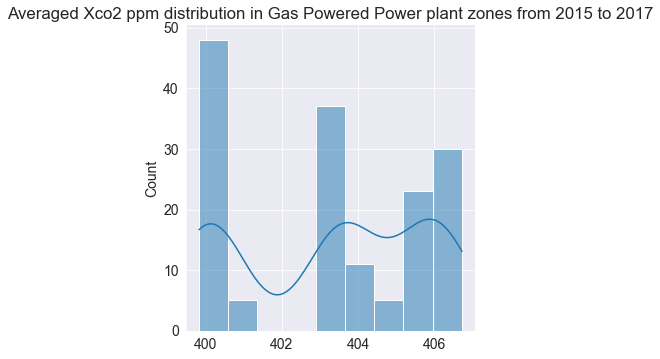

In [180]:
# Plot Xco2 Distribution

plt.figure(figsize = (12,6))
sns.displot(gas_xco2, kde = True)
plt.title('Averaged Xco2 ppm distribution in Gas Powered Power plant zones from 2015 to 2017')
plt.set_ylabel = ('count')
plt.set_xlabel = ('Xco2 ppm')

plt.show();

### 53 Gas Powered Power plants

In [181]:
India_gas_pp_53 = India_pp_data_gas_est.sort_values(by = 'capacity_mw', ascending = False)
India_gas_pp_53

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12705,17.5587,73.1670,RATNAGIRI GAS,1967.080,WRI,1150.497000,4472.098000,4418.715000,17.5,73.25
12434,16.6400,80.5504,KONDAPALLI GT,1458.000,WRI,2024.610000,2211.188000,644.400000,16.5,80.50
12655,28.7962,77.0706,PRAGATI CCCP -III,1371.200,WRI,1836.114800,1973.374000,2844.507400,29.0,77.00
12251,21.6923,72.6215,DGEN MEGA CCCP,1200.000,WRI,2636.864000,2.970000,0.000000,21.5,72.50
12793,21.3395,72.9889,SUGEN CCCP,1147.500,WRI,3516.449000,4654.180000,6396.120000,21.5,73.00
12242,28.5932,77.6101,DADRI GT,816.400,WRI,2924.000000,2178.000000,1575.000000,28.5,77.50
12316,16.9248,81.8111,GREL CCPP (RAJAMUNDRY),768.000,WRI,566.890000,626.684620,0.000000,17.0,81.75
12628,23.4987,91.4385,PALATANA CCPP,726.600,WRI,3337.293000,3993.958000,3870.430000,23.5,91.50
12650,20.8986,71.4693,PIPAVAV CCCP,702.860,WRI,454.954000,216.621274,160.528200,21.0,71.50
12900,18.8800,72.9715,URAN GT,672.000,WRI,2801.530000,3203.300000,3119.863000,19.0,73.00


In [182]:
India_gas_pp_53_1 = India_gas_pp_53.copy(deep = True)

In [183]:
len(India_gas_pp_53)

53

In [184]:
India_gas_pp_53 = India_gas_pp_53.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source', 
                                         'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_gas_pp_53['est_Gt_co2_emms'] = India_gas_pp_53['value'] * 7.0 * 1e-7
India_gas_pp_53['est_Gt_co2_atm'] = India_gas_pp_53['est_Gt_co2_emms'] * 0.45
India_gas_pp_53

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value,est_Gt_co2_emms,est_Gt_co2_atm
0,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2015,1150.497000,0.000805,0.000362
53,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2016,4472.098000,0.003130,0.001409
106,17.5587,73.1670,RATNAGIRI GAS,1967.08,17.5,73.25,generation_gwh_2017,4418.715000,0.003093,0.001392
1,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2015,2024.610000,0.001417,0.000638
54,16.6400,80.5504,KONDAPALLI GT,1458.00,16.5,80.50,generation_gwh_2016,2211.188000,0.001548,0.000697
...,...,...,...,...,...,...,...,...,...,...
104,23.8070,91.5650,BARAMURA,42.00,24.0,91.50,generation_gwh_2016,187.193669,0.000131,0.000059
157,23.8070,91.5650,BARAMURA,42.00,24.0,91.50,generation_gwh_2017,178.106690,0.000125,0.000056
52,10.9325,79.8216,KARAIKAL,32.50,11.0,79.75,generation_gwh_2015,212.919179,0.000149,0.000067
105,10.9325,79.8216,KARAIKAL,32.50,11.0,79.75,generation_gwh_2016,231.324710,0.000162,0.000073


In [185]:
India_gas_pp_53.insert(2, 'xco2', gas_xco2)

In [186]:
India_gas_pp_53 = India_gas_pp_53.drop(labels = 'generation_gwh', axis = 1).rename(columns = {'value' : 'generation_gwh'})
India_gas_pp_53

,latitude,longitude,xco2,name,capacity_mw,latitude_est,longitude_est,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,17.5587,73.1670,399.879862,RATNAGIRI GAS,1967.08,17.5,73.25,1150.497000,0.000805,0.000362
53,17.5587,73.1670,403.262081,RATNAGIRI GAS,1967.08,17.5,73.25,4472.098000,0.003130,0.001409
106,17.5587,73.1670,405.638075,RATNAGIRI GAS,1967.08,17.5,73.25,4418.715000,0.003093,0.001392
1,16.6400,80.5504,400.123459,KONDAPALLI GT,1458.00,16.5,80.50,2024.610000,0.001417,0.000638
54,16.6400,80.5504,403.618628,KONDAPALLI GT,1458.00,16.5,80.50,2211.188000,0.001548,0.000697
...,...,...,...,...,...,...,...,...,...,...
104,23.8070,91.5650,403.736901,BARAMURA,42.00,24.0,91.50,187.193669,0.000131,0.000059
157,23.8070,91.5650,406.102443,BARAMURA,42.00,24.0,91.50,178.106690,0.000125,0.000056
52,10.9325,79.8216,399.889835,KARAIKAL,32.50,11.0,79.75,212.919179,0.000149,0.000067
105,10.9325,79.8216,403.354376,KARAIKAL,32.50,11.0,79.75,231.324710,0.000162,0.000073


### Plot Spread

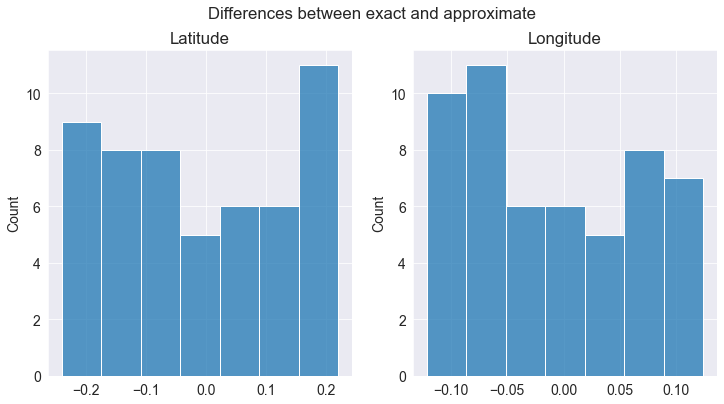

In [187]:
fig, ax = plt.subplots(1,2, figsize = (12,6))
plt.suptitle('Differences between exact and approximate')
g1 = sns.histplot(India_gas_pp_53_1['latitude_est'] - India_gas_pp_53_1['latitude'], ax = ax[0])
g1.set_title('Latitude')

g2 = sns.histplot(India_gas_pp_53_1['longitude_est'] - India_gas_pp_53_1['longitude'], ax = ax[1])
g2.set_title('Longitude');

### Drop Longitude and Latitude Estimates

In [188]:
India_gas_pp_53.drop(labels = ['latitude_est', 'longitude_est'], axis = 1, inplace = True)
India_gas_pp_53

,latitude,longitude,xco2,name,capacity_mw,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,17.5587,73.1670,399.879862,RATNAGIRI GAS,1967.08,1150.497000,0.000805,0.000362
53,17.5587,73.1670,403.262081,RATNAGIRI GAS,1967.08,4472.098000,0.003130,0.001409
106,17.5587,73.1670,405.638075,RATNAGIRI GAS,1967.08,4418.715000,0.003093,0.001392
1,16.6400,80.5504,400.123459,KONDAPALLI GT,1458.00,2024.610000,0.001417,0.000638
54,16.6400,80.5504,403.618628,KONDAPALLI GT,1458.00,2211.188000,0.001548,0.000697
...,...,...,...,...,...,...,...,...
104,23.8070,91.5650,403.736901,BARAMURA,42.00,187.193669,0.000131,0.000059
157,23.8070,91.5650,406.102443,BARAMURA,42.00,178.106690,0.000125,0.000056
52,10.9325,79.8216,399.889835,KARAIKAL,32.50,212.919179,0.000149,0.000067
105,10.9325,79.8216,403.354376,KARAIKAL,32.50,231.324710,0.000162,0.000073


### Estimate emisions from the 53 Gas Plants

In [189]:
# Sum est_Gt_co2 emmissions for the 53 plants 
emm_2015_gas = sum([India_gas_pp_53['est_Gt_co2_emms'][i] for i in range(0, len(India_gas_pp_53), 3)])
emm_2016_gas = sum([India_gas_pp_53['est_Gt_co2_emms'][i] for i in range(1, len(India_gas_pp_53), 3)])
emm_2017_gas = sum([India_gas_pp_53['est_Gt_co2_emms'][i] for i in range(2, len(India_gas_pp_53), 3)])
print(f'2015 emissions from the 53 gas power plants is: {emm_2015_gas:.4f} Gt_Co2'.format(emm_2015_gas))
print(f'2016 emissions from the 53 gas power plants is: {emm_2016_gas:.4f} Gt_Co2'.format(emm_2016_gas))
print(f'2017 emissions from the 53 gas power plants is: {emm_2017_gas:.4f} Gt_Co2'.format(emm_2017_gas))

2015 emissions from the 53 gas power plants is: 0.0312 Gt_Co2
2016 emissions from the 53 gas power plants is: 0.0333 Gt_Co2
2017 emissions from the 53 gas power plants is: 0.0338 Gt_Co2


### Oil Powered Power plants

2.1% of the powerplants are primarily powered by Oil & they make up 0.65% of India's Power generation capacity

In [190]:
# Total Capacity of powerplants that use coal as primary fuel
India_cap_data[India_cap_data['primary_fuel'] == 'Oil']['cap_perc'].sum()

0.6514992610985403

In [191]:
India_oil = India_cap_data[India_cap_data['primary_fuel'] == 'Oil']
India_oil

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12859,IND,India,TROMBAY,IND0000462,500.00,19.0004,72.8983,Oil,Gas,NaN,...,15.000000,0.000000,0.000000,NaN,black,0,0,0,140,0.173194
12125,IND,India,B. BRIDGE D.G,IND0000018,200.00,13.0977,80.2695,Oil,NaN,NaN,...,0.000000,0.000000,0.000000,NaN,black,0,0,0,140,0.069277
12630,IND,India,PAMPORE GT,IND0000319,175.00,34.0040,74.9175,Oil,NaN,NaN,...,0.000000,0.000000,0.000000,NaN,black,0,0,0,140,0.060618
12863,IND,India,TROMBAY_Oil,IND0000465,150.00,19.0004,72.8983,Oil,Gas,NaN,...,0.000000,0.000000,NaN,NaN,black,0,0,0,140,0.051958
12943,IND,India,YELHANKA (DG),IND0000512,106.60,13.1156,77.5838,Oil,NaN,NaN,...,0.000000,0.000000,NaN,NaN,black,0,0,0,140,0.036925
12743,IND,India,SAMAYANALLUR DG,IND0000390,106.00,9.9751,78.0445,Oil,NaN,NaN,...,39.954000,11.308044,NaN,NaN,black,0,0,0,140,0.036717
12742,IND,India,SAMALPATTI DG,IND0000389,105.70,12.2995,78.4038,Oil,NaN,NaN,...,37.560643,0.000000,NaN,NaN,black,0,0,0,140,0.036613
12426,IND,India,KOJIKODE DG,IND0000202,96.00,11.2054,75.8067,Oil,NaN,NaN,...,133.406400,36.340440,0.746530,NaN,black,0,0,0,140,0.033253
12192,IND,India,BUTIBORI PLANT,WRI1019946,81.50,20.9225,78.9535,Oil,NaN,NaN,...,NaN,NaN,NaN,4418.061080,black,0,0,0,140,0.028231
12579,IND,India,NAGOTHANE COMPLEX,WRI1019973,78.90,18.8829,73.1862,Oil,NaN,NaN,...,NaN,NaN,NaN,4277.116800,black,0,0,0,140,0.027330


### Generation data

In [192]:
India_gen_oil_data = India_oil.dropna(subset = ['generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'])
India_gen_oil_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12859,IND,India,TROMBAY,IND0000462,500.0,19.0004,72.8983,Oil,Gas,NaN,...,15.0000,0.00000,0.000000,NaN,black,0,0,0,140,0.173194
12125,IND,India,B. BRIDGE D.G,IND0000018,200.0,13.0977,80.2695,Oil,NaN,NaN,...,0.0000,0.00000,0.000000,NaN,black,0,0,0,140,0.069277
12630,IND,India,PAMPORE GT,IND0000319,175.0,34.0040,74.9175,Oil,NaN,NaN,...,0.0000,0.00000,0.000000,NaN,black,0,0,0,140,0.060618
12426,IND,India,KOJIKODE DG,IND0000202,96.0,11.2054,75.8067,Oil,NaN,NaN,...,133.4064,36.34044,0.746530,NaN,black,0,0,0,140,0.033253
12188,IND,India,BRAMHAPURAM DG,IND0000067,60.0,9.9975,76.3744,Oil,NaN,NaN,...,12.8899,5.11710,0.425769,NaN,black,0,0,0,140,0.020783


In [193]:
India_gen_oil_data = India_gen_oil_data.tail(2)
India_gen_oil_data

,country,country_long,name,gppd_idnr,capacity_mw,latitude,longitude,primary_fuel,other_fuel1,other_fuel2,...,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,estimated_generation_gwh,primary_fuel_color,color_r,color_g,color_b,color_a,cap_perc
12426,IND,India,KOJIKODE DG,IND0000202,96.0,11.2054,75.8067,Oil,NaN,NaN,...,133.4064,36.34044,0.746530,NaN,black,0,0,0,140,0.033253
12188,IND,India,BRAMHAPURAM DG,IND0000067,60.0,9.9975,76.3744,Oil,NaN,NaN,...,12.8899,5.11710,0.425769,NaN,black,0,0,0,140,0.020783


## Capacity Distribution

C:\Users\Ochibobo\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


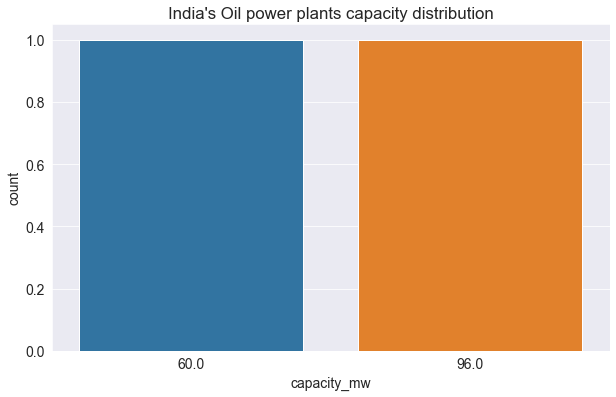

In [194]:
sns.countplot(India_gen_oil_data['capacity_mw'])
plt.title("India's Oil power plants capacity distribution");

In [195]:
## Get a subset - subset for years which we have xco2 values
India_pp_data_oil = India_gen_oil_data[[
    "latitude","longitude", "name", "capacity_mw", "geolocation_source", 
    'generation_gwh_2015', 'generation_gwh_2016', 'generation_gwh_2017'
    ]
]
India_pp_data_oil

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12426,11.2054,75.8067,KOJIKODE DG,96.0,WRI,133.4064,36.34044,0.746530
12188,9.9975,76.3744,BRAMHAPURAM DG,60.0,WRI,12.8899,5.11710,0.425769


### Interpolate Power plants Longitudes and Latitudes to xco2 nearest measurements¶

In [196]:
India_pp_data_oil_est = India_pp_data_oil.copy(deep = True)
India_pp_data_oil_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017
12426,11.2054,75.8067,KOJIKODE DG,96.0,WRI,133.4064,36.34044,0.746530
12188,9.9975,76.3744,BRAMHAPURAM DG,60.0,WRI,12.8899,5.11710,0.425769


In [197]:
India_pp_data_oil_est['latitude_est'] = India_pp_data_oil_est['latitude'].mul(2).round().div(2)
India_pp_data_oil_est['longitude_est'] = India_pp_data_oil_est['longitude'].mul(4).round().div(4)
India_pp_data_oil_est

,latitude,longitude,name,capacity_mw,geolocation_source,generation_gwh_2015,generation_gwh_2016,generation_gwh_2017,latitude_est,longitude_est
12426,11.2054,75.8067,KOJIKODE DG,96.0,WRI,133.4064,36.34044,0.746530,11.0,75.75
12188,9.9975,76.3744,BRAMHAPURAM DG,60.0,WRI,12.8899,5.11710,0.425769,10.0,76.25


In [198]:
India_oil_pp = India_pp_data_oil_est.melt(id_vars = ['latitude', 'longitude', 'name', 'capacity_mw', 'geolocation_source',
                                                    'latitude_est', 'longitude_est'],
                   var_name = 'generation_gwh',
                   value_name = 'value').drop(labels = ['geolocation_source'], 
                                              axis = 1).sort_values(by = ['capacity_mw', 'name'], ascending = False)
India_oil_pp

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value
0,11.2054,75.8067,KOJIKODE DG,96.0,11.0,75.75,generation_gwh_2015,133.406400
2,11.2054,75.8067,KOJIKODE DG,96.0,11.0,75.75,generation_gwh_2016,36.340440
4,11.2054,75.8067,KOJIKODE DG,96.0,11.0,75.75,generation_gwh_2017,0.746530
1,9.9975,76.3744,BRAMHAPURAM DG,60.0,10.0,76.25,generation_gwh_2015,12.889900
3,9.9975,76.3744,BRAMHAPURAM DG,60.0,10.0,76.25,generation_gwh_2016,5.117100
5,9.9975,76.3744,BRAMHAPURAM DG,60.0,10.0,76.25,generation_gwh_2017,0.425769


### CO2 Baseline Database for the Indian Power Sector
Source: Government of India, Ministry of Power, Central Electricity Authority, Sewa Bhawan, R.K.Puram, [Link](https://cea.nic.in/wp-content/uploads/baseline/2020/07/user_guide_ver14.pdf)

Weighted average specific emissions for fossil fuel-fired stations in FY 2017-18,
in t CO2/MWh 
- Coal - $0.97 T/mwh$ => $970 T/gwh$ => $9.7 * 1e-7 Gt/gwh$
- Diesel - $0.70 T/mwh$ => $700 T/gwh$ => $7.0 * 1e-7 Gt/gwh$
- Gas* - $0.45 T/mwh$ => $450 T/gwh$ => $4.5 * 1e-7 Gt/gwh$ - Only gas-fired stations that do not use any other fuel. Stations that use naphtha, diesel or oil as a second fuel are excluded from the weighted average. 
- Lignite - $1.36 T/mwh$ => $1360 T/gwh$ => $1.36 * 1e-6 Gt/gwh$
- Oil - $0.77 T/mwh$ => $770 T/gwh$ => $7.7 * 1e-7 Gt/gwh$ - Source: [Link](https://www.rte-france.com/en/eco2mix/co2-emissions#:~:text=Real%2Dtime%20calculation%20of%20CO2%20emissions&text=0.777%20t%20CO2%20eq%20/MWh,MWh%20for%20biofuel%20plants%20(waste))

Note natural sinks (ocean and biosphere) absorb approximately 55% of human emissions, so the "airborne fraction" added to the atmosphere is about 45%. Source: [Skeptical Science](https://skepticalscience.com/print.php?r=45)

In [199]:
India_oil_pp['est_Gt_co2_emms'] = India_oil_pp['value'] * 7.7 * 1e-7
India_oil_pp['est_Gt_co2_atm'] = India_oil_pp['est_Gt_co2_emms'] * 0.45
India_oil_pp

,latitude,longitude,name,capacity_mw,latitude_est,longitude_est,generation_gwh,value,est_Gt_co2_emms,est_Gt_co2_atm
0,11.2054,75.8067,KOJIKODE DG,96.0,11.0,75.75,generation_gwh_2015,133.406400,1.027229e-04,4.622532e-05
2,11.2054,75.8067,KOJIKODE DG,96.0,11.0,75.75,generation_gwh_2016,36.340440,2.798214e-05,1.259196e-05
4,11.2054,75.8067,KOJIKODE DG,96.0,11.0,75.75,generation_gwh_2017,0.746530,5.748281e-07,2.586726e-07
1,9.9975,76.3744,BRAMHAPURAM DG,60.0,10.0,76.25,generation_gwh_2015,12.889900,9.925223e-06,4.466350e-06
3,9.9975,76.3744,BRAMHAPURAM DG,60.0,10.0,76.25,generation_gwh_2016,5.117100,3.940167e-06,1.773075e-06
5,9.9975,76.3744,BRAMHAPURAM DG,60.0,10.0,76.25,generation_gwh_2017,0.425769,3.278420e-07,1.475289e-07


### Check plant xco2 levels

In [200]:
#1.Check xco2 levels in KOJIKODE DG
annual_India_xco2[annual_India_xco2['latitude'] == 11.][annual_India_xco2['longitude'] == 75.625]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\1258582320.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 11.][annual_India_xco2['longitude'] == 75.625]


,Year,longitude,latitude,xco2
701,2015,75.625,11.0,399.906087
3427,2016,75.625,11.0,403.326551
6153,2017,75.625,11.0,405.677962
8879,2018,75.625,11.0,407.837107
11605,2019,75.625,11.0,410.604902
14331,2020,75.625,11.0,413.010455
17057,2021,75.625,11.0,415.317611
19783,2022,75.625,11.0,416.726131


In [201]:
#1.Check xco2 levels in BRAMHAPURAM DG
annual_India_xco2[annual_India_xco2['latitude'] == 10.][annual_India_xco2['longitude'] == 76.25]

C:\Users\Ochibobo\AppData\Local\Temp\ipykernel_3560\2855914879.py:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  annual_India_xco2[annual_India_xco2['latitude'] == 10.][annual_India_xco2['longitude'] == 76.25]


,Year,longitude,latitude,xco2
757,2015,76.25,10.0,399.924900
3483,2016,76.25,10.0,403.348499
6209,2017,76.25,10.0,405.695631
8935,2018,76.25,10.0,407.840391
11661,2019,76.25,10.0,410.565018
14387,2020,76.25,10.0,413.017876
17113,2021,76.25,10.0,415.324808
19839,2022,76.25,10.0,416.780585


In [202]:
oil_xco2 = [399.906087, 403.326551, 405.677962, 399.924900, 403.348499, 405.695631]

<Figure size 864x432 with 0 Axes>

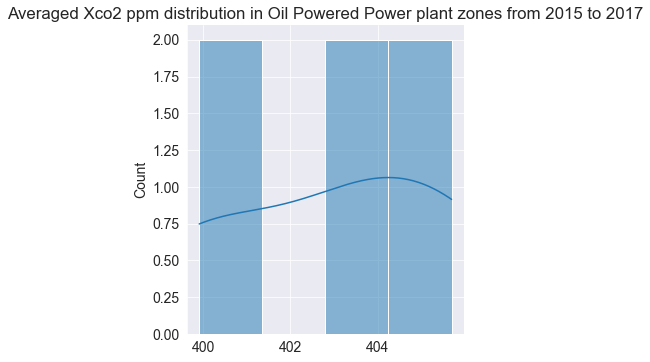

In [203]:
# Plot Xco2 Distribution

plt.figure(figsize = (12,6))
sns.displot(oil_xco2, kde = True)
plt.title('Averaged Xco2 ppm distribution in Oil Powered Power plant zones from 2015 to 2017')
plt.set_ylabel = ('count')
plt.set_xlabel = ('Xco2 ppm')

plt.show();

In [204]:
India_oil_pp.insert(2, 'xco2', oil_xco2)

In [205]:
India_oil_pp = India_oil_pp.drop(labels = 'generation_gwh', axis = 1).rename(columns = {'value' : 'generation_gwh'})
India_oil_pp

,latitude,longitude,xco2,name,capacity_mw,latitude_est,longitude_est,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,11.2054,75.8067,399.906087,KOJIKODE DG,96.0,11.0,75.75,133.406400,1.027229e-04,4.622532e-05
2,11.2054,75.8067,403.326551,KOJIKODE DG,96.0,11.0,75.75,36.340440,2.798214e-05,1.259196e-05
4,11.2054,75.8067,405.677962,KOJIKODE DG,96.0,11.0,75.75,0.746530,5.748281e-07,2.586726e-07
1,9.9975,76.3744,399.924900,BRAMHAPURAM DG,60.0,10.0,76.25,12.889900,9.925223e-06,4.466350e-06
3,9.9975,76.3744,403.348499,BRAMHAPURAM DG,60.0,10.0,76.25,5.117100,3.940167e-06,1.773075e-06
5,9.9975,76.3744,405.695631,BRAMHAPURAM DG,60.0,10.0,76.25,0.425769,3.278420e-07,1.475289e-07


### Plot Spread

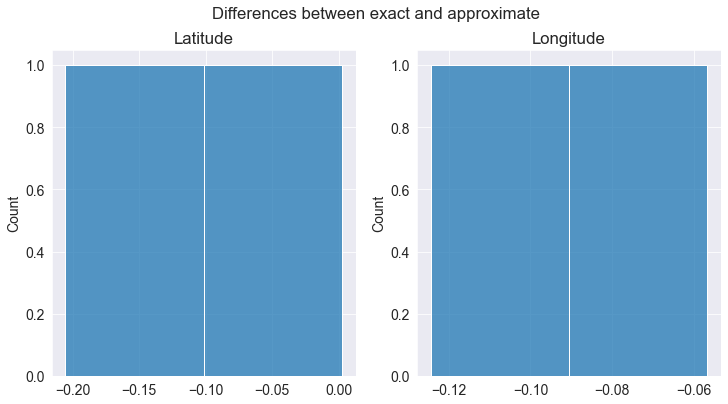

In [206]:
fig, ax = plt.subplots(1,2, figsize = (12,6))
plt.suptitle('Differences between exact and approximate')
g1 = sns.histplot(India_pp_data_oil_est['latitude_est'] - India_pp_data_oil_est['latitude'], ax = ax[0])
g1.set_title('Latitude')

g2 = sns.histplot(India_pp_data_oil_est['longitude_est'] - India_pp_data_oil_est['longitude'], ax = ax[1])
g2.set_title('Longitude');

### Drop Latitude and Longitude estimates

In [207]:
India_oil_pp.drop(labels = ['latitude_est', 'longitude_est'], axis = 1, inplace = True)
India_oil_pp

,latitude,longitude,xco2,name,capacity_mw,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,11.2054,75.8067,399.906087,KOJIKODE DG,96.0,133.406400,1.027229e-04,4.622532e-05
2,11.2054,75.8067,403.326551,KOJIKODE DG,96.0,36.340440,2.798214e-05,1.259196e-05
4,11.2054,75.8067,405.677962,KOJIKODE DG,96.0,0.746530,5.748281e-07,2.586726e-07
1,9.9975,76.3744,399.924900,BRAMHAPURAM DG,60.0,12.889900,9.925223e-06,4.466350e-06
3,9.9975,76.3744,403.348499,BRAMHAPURAM DG,60.0,5.117100,3.940167e-06,1.773075e-06
5,9.9975,76.3744,405.695631,BRAMHAPURAM DG,60.0,0.425769,3.278420e-07,1.475289e-07


### Estimate co2 emissions from the 2 oil plants

In [208]:
# Sum est_Gt_co2 emmissions for the 53 plants 
emm_2015_oil = sum([India_oil_pp['est_Gt_co2_emms'][i] for i in range(0, len(India_oil_pp), 3)])
emm_2016_oil= sum([India_oil_pp['est_Gt_co2_emms'][i] for i in range(1, len(India_oil_pp), 3)])
emm_2017_oil = sum([India_oil_pp['est_Gt_co2_emms'][i] for i in range(2, len(India_oil_pp), 3)])
print(f'2015 emissions from the 2 oil power plants is: {emm_2015_oil:.5f} Gt_Co2'.format(emm_2015_oil))
print(f'2016 emissions from the 2 oil power plants is: {emm_2016_oil:.5f} Gt_Co2'.format(emm_2016_oil))
print(f'2017 emissions from the 2 oil power plants is: {emm_2017_oil:.5f} Gt_Co2'.format(emm_2017_oil))

2015 emissions from the 2 oil power plants is: 0.00011 Gt_Co2
2016 emissions from the 2 oil power plants is: 0.00001 Gt_Co2
2017 emissions from the 2 oil power plants is: 0.00003 Gt_Co2


## Concatenate the Processed Power plant databases

In [209]:
India_power_plants = pd.concat([India_pp_50, India_gas_pp_53, India_oil_pp], axis=0, sort = False)
India_power_plants

,latitude,longitude,xco2,name,capacity_mw,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
0,24.0983,82.6719,400.974743,VINDH_CHAL STPS,4760.0,29047.000000,2.701371e-02,1.215617e-02
50,24.0983,82.6719,404.587830,VINDH_CHAL STPS,4760.0,30015.000000,2.791395e-02,1.256128e-02
100,24.0983,82.6719,406.872143,VINDH_CHAL STPS,4760.0,35116.000000,3.265788e-02,1.469605e-02
1,22.8230,69.5532,399.992168,MUNDRA TPP,4620.0,30539.000000,2.840127e-02,1.278057e-02
51,22.8230,69.5532,403.453750,MUNDRA TPP,4620.0,28078.000000,2.611254e-02,1.175064e-02
...,...,...,...,...,...,...,...,...
2,11.2054,75.8067,403.326551,KOJIKODE DG,96.0,36.340440,2.798214e-05,1.259196e-05
4,11.2054,75.8067,405.677962,KOJIKODE DG,96.0,0.746530,5.748281e-07,2.586726e-07
1,9.9975,76.3744,399.924900,BRAMHAPURAM DG,60.0,12.889900,9.925223e-06,4.466350e-06
3,9.9975,76.3744,403.348499,BRAMHAPURAM DG,60.0,5.117100,3.940167e-06,1.773075e-06


## Deck GI India Power plants

In [210]:
# Transform the data
FUEL_COLORS = {
    "Oil": "black",
    "Solar": "green",
    "Gas": "black",
    "Other": "gray",
    "Hydro": "blue",
    "Coal": "black",
    "Petcoke": "black",
    "Biomass": "green",
    "Waste": "green",
    "Cogeneration": "gray",
    "Storage": "orange",
    "Wind": "green",
}

COLORS_R = {"black": 0, "green": 0, "blue": 0, "orange": 255, "gray": 128}
COLORS_G = {"black": 0, "green": 128, "blue": 0, "orange": 165, "gray": 128}
COLORS_B = {"black": 0, "green": 0, "blue": 255, "orange": 0, "gray": 128}

pp_data["primary_fuel_color"] = pp_data.primary_fuel.map(FUEL_COLORS)
pp_data["primary_fuel_color"] = pp_data["primary_fuel_color"].fillna("gray")
pp_data["color_r"] = pp_data["primary_fuel_color"].map(COLORS_R)
pp_data["color_g"] = pp_data["primary_fuel_color"].map(COLORS_G)
pp_data["color_b"] = pp_data["primary_fuel_color"].map(COLORS_B)
pp_data["color_a"] = 140

# "name", "primary_fuel", "capacity_mw",
pp_data2 = pp_data[[
    "latitude","longitude", "name", "country_long", "capacity_mw",
    "color_r","color_g","color_b","color_a",]
]
pp_data2.head(1)

,latitude,longitude,name,country_long,capacity_mw,color_r,color_g,color_b,color_a
0,32.322,65.119,Kajaki Hydroelectric Power Plant Afghanistan,Afghanistan,33.0,0,0,255,140


In [211]:
India_pp_data2 = pp_data2[pp_data2['country_long'] == 'India'].drop(labels = 'country_long', axis = 1)
India_pp_data2 

,latitude,longitude,name,capacity_mw,color_r,color_g,color_b,color_a
12088,28.1839,73.2407,ACME Solar Tower,2.5,0,128,0,140
12089,24.7663,74.6090,ADITYA CEMENT WORKS,98.0,0,0,0,140
12090,21.9038,69.3732,AES Saurashtra Windfarms,39.2,0,128,0,140
12091,23.8712,91.3602,AGARTALA GT,135.0,0,0,0,140
12092,21.9603,82.4091,AKALTARA TPP,1800.0,0,0,0,140
...,...,...,...,...,...,...,...,...
12944,16.2949,77.3568,YERMARUS TPP,1600.0,0,0,0,140
12945,12.8932,78.1654,Yelesandra Solar Power Plant,3.0,0,128,0,140
12946,15.2758,75.5811,Yelisirur wind power project,25.5,0,128,0,140
12947,24.3500,73.7477,ZAWAR MINES,80.0,0,0,0,140


## India's Power Plants

In [212]:
class GlobalPowerPlantDatabaseApp(param.Parameterized):
    
    data = param.DataFrame(India_pp_data2, precedence=-1)

    opacity = param.Number(default=0.8, step=0.05, bounds=(0, 1))
    
    pitch = param.Number(default=0, bounds=(0, 90))
    
    zoom = param.Integer(default=1, bounds=(1, 10))
    
    def __init__(self, **params):
        super(GlobalPowerPlantDatabaseApp, self).__init__(**params)
        self._view_state = pdk.ViewState(
            latitude=8.07,
            longitude= 68.12,
            zoom=self.zoom,
            min_zoom=self.param.zoom.bounds[0],
            max_zoom=self.param.zoom.bounds[1],
        )
        self._scatter = pdk.Layer(
            "ScatterplotLayer",
            data=self.data,
            get_position=["longitude", "latitude"],
            get_fill_color="[color_r, color_g, color_b, color_a]",
            get_radius="capacity_mw*10",
            pickable=True,
            opacity=self.opacity,
            filled=True,
            wireframe=True,
        )
        self._deck = pdk.Deck(
            map_style="mapbox://styles/mapbox/light-v9",
            initial_view_state=self._view_state,
            layers=[self._scatter],
            tooltip=True,
            api_keys={'mapbox': MAPBOX_KEY},
        )
        self.pane = pn.pane.DeckGL(self._deck, sizing_mode="stretch_width", height=700)
        self.param.watch(self._update, ['data', 'opacity', 'pitch', 'zoom'])

    @pn.depends('pane.hover_state', 'data')
    def _info(self):
        index = self.pane.hover_state.get('index', -1)
        if index == -1:
            index = slice(0, 0)
        return self.data.iloc[index][['name', 'capacity_mw']]

    @pn.depends('pane.view_State', watch=True)
    def _update(self):
        state = self.pane.view_state
        self._view_state.longitude = state['longitude']
        self._view_state.latitude = state['latitude']   

    def _update(self, event):
        if event.name == 'data':
            self._scatter.data = self.data
        if event.name == 'opacity':
            self._scatter.opacity = self.opacity
        if event.name == 'zoom':
            self._view_state.zoom = self.zoom
        if event.name == 'pitch':
            self._view_state.pitch = self.pitch
        self.pane.param.trigger('object')
    
    def view(self):
        return pn.Row(pn.Column(self.param, pn.panel(self._info, height=200)), self.pane)

component = GlobalPowerPlantDatabaseApp()
component.view()

Row(sizing_mode='stretch_width')
    [0] Column(sizing_mode='stretch_width')
        [0] Column(margin=5, name='GlobalPowerPlantDatabaseA..., sizing_mode='stretch_width', width=300)
            [0] StaticText(sizing_mode='stretch_width', value='<b>GlobalPowerPlantDataba...)
            [1] FloatSlider(name='Opacity', sizing_mode='stretch_width', step=0.05, value=0.8)
            [2] FloatSlider(end=90, name='Pitch', sizing_mode='stretch_width')
            [3] IntSlider(end=10, name='Zoom', sizing_mode='stretch_width', start=1, value=1)
        [1] ParamMethod(method, height=200, sizing_mode='stretch_width')
    [1] DeckGL(Deck, height=700, sizing_mode='stretch_width')

## India's Power Plants xco2 Measurements

In [213]:
map_token= 'pk.eyJ1IjoibWl0Y2hlbGxvZGlsaSIsImEiOiJjbDZkeDd4aGcwMXo0M2tvMjV1dmJ5aDFpIn0.pQ13ACndelMgJQSIYjhVIw'

In [214]:
%%time
def subsetting_coordinates(data, South, North, West, East, zoom = 1, darkmap= 0):
    
    # Create dataframe and columns
    df_xco2 = pd.DataFrame(columns=[ "latitude", "longitude", "xco2"])
    
#     df_xco2["xco2"]= data["xco2"][:]
# #     df_xco2["dateTime"]= data["time"][:]
#     df_xco2["latitude"]= data["latitude"][:]
#     df_xco2["longitude"]= data["longitude"][:]

    # Passing the new Dataframe and filtering the coordinates by region/ country: 
    df_first= India_power_plants[(India_power_plants["latitude"] > South) &(India_power_plants["latitude"]< North)]
    df_second= df_first[(df_first["longitude"] >West) & (df_first["longitude"] < East)]
    
    
    # set token
    px.set_mapbox_access_token(map_token)

    fig_second= px.scatter_mapbox(df_second,
                          lat= 'latitude',
                          lon= 'longitude',
                          color= 'xco2',
                          zoom= zoom,
                          size_max= 15,
                          )
    
    if darkmap == 1:
        fig_second.update_layout(
        mapbox_style="dark",
        title='OCO2- XCO2, Atmospheric Carbon Dioxide'

        )
    else:
        fig_second.update_layout(
        mapbox_style="stamen-watercolor",
        title='OCO2- XCO2, Atmospheric Carbon Dioxide'

        )

    fig_second.show()

CPU times: total: 0 ns
Wall time: 0 ns


In [215]:
%%time
subsetting_coordinates(India_power_plants, 8.0, 37, 68, 97, zoom= 3, darkmap = 1)

CPU times: total: 1.38 s
Wall time: 2.11 s


### Capacity_mw

Let's visualize the capacity distribution

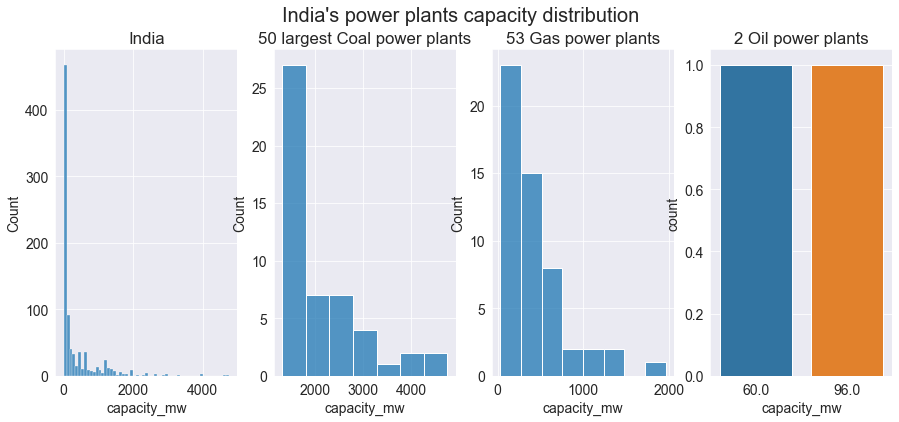

In [216]:
fig, ax = plt.subplots(1,4, figsize = (15,6))
plt.suptitle("India's power plants capacity distribution", fontsize = 20)
g1 = sns.histplot(India_pp_data2['capacity_mw'], ax = ax[0])
g1.set_title('India')

g2 = sns.histplot(India_large_pp_50['capacity_mw'], ax = ax[1])
g2.set_title('50 largest Coal power plants')

g3 = sns.histplot(India_gas_pp_53_1['capacity_mw'], ax = ax[2])
g3.set_title('53 Gas power plants')

g4 = sns.countplot(x = India_pp_data_oil_est['capacity_mw'], ax = ax[3])
g4.set_title('2 Oil power plants');

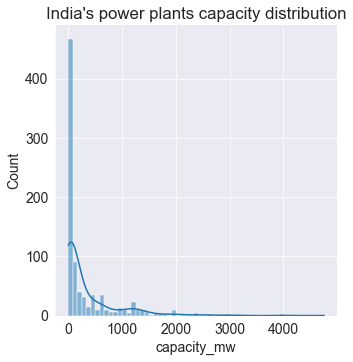

In [217]:
sns.displot(India_pp_data2,x = 'capacity_mw', kde = True)
plt.title("India's power plants capacity distribution");

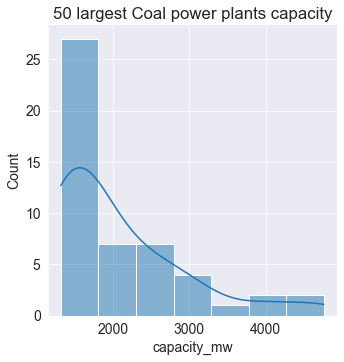

In [218]:
sns.displot(India_large_pp_50,x = 'capacity_mw', kde = True)
plt.title('50 largest Coal power plants capacity');

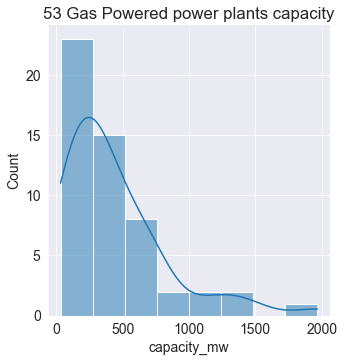

In [219]:
sns.displot(India_gas_pp_53_1,x = 'capacity_mw', kde = True)
plt.title('53 Gas Powered power plants capacity');

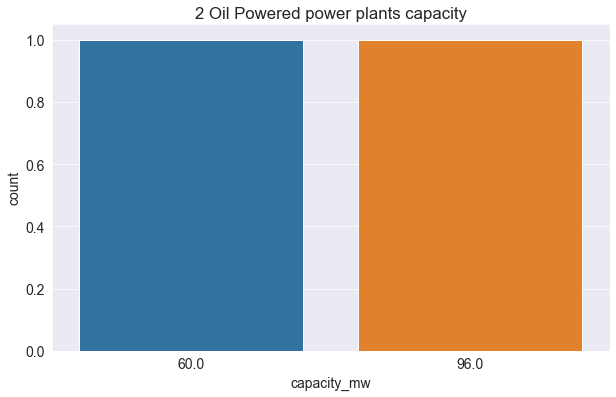

In [220]:
sns.countplot(x = India_pp_data_oil_est['capacity_mw'])
plt.title('2 Oil Powered power plants capacity');

### Generation_gwh and xco2
Let's visualize the relationship between `generation_gwh` and `xco2 ppm`. Each point in the scatter plot represents a power plant

In [221]:
fig = px.scatter(India_power_plants, x = 'generation_gwh', y = 'xco2', hover_data = ['name'],
                     title = 'capacity_mw v/s xco2')
fig.show()

In [222]:
India_power_plants.xco2.corr(India_power_plants.generation_gwh)

0.07413875176009073

There's a weak positive correlation between the generation_gwh and xco2 in the atmosphere

In [223]:
India_power_plants.corr()

,latitude,longitude,xco2,capacity_mw,generation_gwh,est_Gt_co2_emms,est_Gt_co2_atm
latitude,1.000000,0.123030,0.087630,0.236761,0.184715,0.180684,0.180684
longitude,0.123030,1.000000,0.036713,-0.014979,0.082842,0.084940,0.084940
xco2,0.087630,0.036713,1.000000,0.045330,0.074139,0.073682,0.073682
capacity_mw,0.236761,-0.014979,0.045330,1.000000,0.894762,0.895577,0.895577
generation_gwh,0.184715,0.082842,0.074139,0.894762,1.000000,0.999526,0.999526
est_Gt_co2_emms,0.180684,0.084940,0.073682,0.895577,0.999526,1.000000,1.000000
est_Gt_co2_atm,0.180684,0.084940,0.073682,0.895577,0.999526,1.000000,1.000000


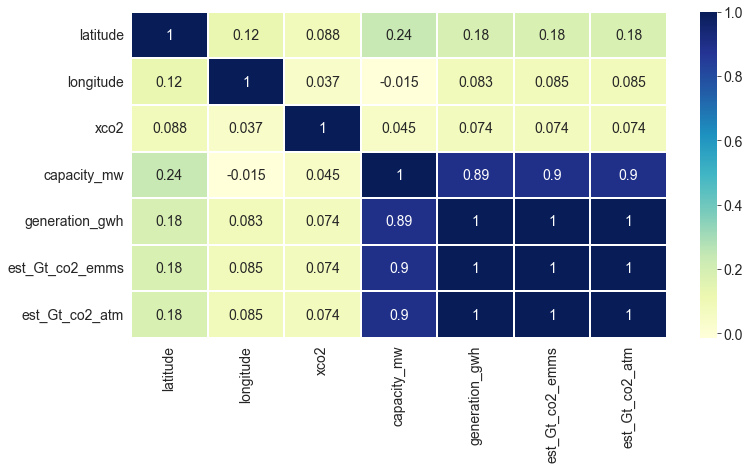

In [224]:
fig, ax = plt.subplots(figsize=(12,6))
sns.heatmap(India_power_plants.corr(), ax=ax, cmap ="YlGnBu", linewidths = 0.1, annot = True)
plt.show()

## Step 2. Prepare the Dataset for Training

Before we can train the model, we need to prepare the dataset. Here are the steps we'll follow:

1. Identify the input and target column(s) for training the model.
2. Identify numeric and categorical input columns.
3. [Impute](https://scikit-learn.org/stable/modules/impute.html) (fill) missing values in numeric columns
4. [Scale](https://scikit-learn.org/stable/modules/preprocessing.html#scaling-features-to-a-range) values in numeric columns to a $(0,1)$ range.
5. [Encode](https://scikit-learn.org/stable/modules/preprocessing.html#encoding-categorical-features) categorical data into one-hot vectors.
6. Split the dataset into training and validation sets.

### Identify Inputs and Targets

While the dataset contains 6 columns, not all of them are useful for modeling. Note the following:

- The column `name` is a unique name for each powerplant and isn't useful for training the model.
- The column `xco2` contains the value we need to predict i.e. it's the target column.
- Data from all the other columns (except the name and xco2) can be used as inputs to the model.
- Leave out est_Gt_co2_atm too
 

In [225]:
# Identify the input columns (a list of column names)
input_cols = ['latitude', 'longitude', 'capacity_mw', 'generation_gwh', 'est_Gt_co2_emms']

In [226]:
# Identify the name of the target column (a single string, not a list)
target_col = 'xco2'

In [227]:
print(list(input_cols))

['latitude', 'longitude', 'capacity_mw', 'generation_gwh', 'est_Gt_co2_emms']


In [228]:
print(target_col)

xco2


In [229]:
inputs_df = India_power_plants[input_cols].copy()

In [230]:
targets = India_power_plants[target_col]

In [231]:
inputs_df

,latitude,longitude,capacity_mw,generation_gwh,est_Gt_co2_emms
0,24.0983,82.6719,4760.0,29047.000000,2.701371e-02
50,24.0983,82.6719,4760.0,30015.000000,2.791395e-02
100,24.0983,82.6719,4760.0,35116.000000,3.265788e-02
1,22.8230,69.5532,4620.0,30539.000000,2.840127e-02
51,22.8230,69.5532,4620.0,28078.000000,2.611254e-02
...,...,...,...,...,...
2,11.2054,75.8067,96.0,36.340440,2.798214e-05
4,11.2054,75.8067,96.0,0.746530,5.748281e-07
1,9.9975,76.3744,60.0,12.889900,9.925223e-06
3,9.9975,76.3744,60.0,5.117100,3.940167e-06


In [232]:
targets

0      400.974743
50     404.587830
100    406.872143
1      399.992168
51     403.453750
          ...    
2      403.326551
4      405.677962
1      399.924900
3      403.348499
5      405.695631
Name: xco2, Length: 315, dtype: float64

### Identify Numeric and Categorical Data

The next step in data preparation is to identify numeric and categorical columns. We can do this by looking at the data type of each column.

In [233]:
India_power_plants.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 315 entries, 0 to 5
Data columns (total 8 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   latitude         315 non-null    float64
 1   longitude        315 non-null    float64
 2   xco2             315 non-null    float64
 3   name             315 non-null    object 
 4   capacity_mw      315 non-null    float64
 5   generation_gwh   315 non-null    float64
 6   est_Gt_co2_emms  315 non-null    float64
 7   est_Gt_co2_atm   315 non-null    float64
dtypes: float64(7), object(1)
memory usage: 22.1+ KB


In [234]:
numeric_cols = inputs_df.select_dtypes(include=['int64', 'float64']).columns.tolist()

In [235]:
categorical_cols = inputs_df.select_dtypes('object').columns.tolist()

In [236]:
print(list(numeric_cols))

['latitude', 'longitude', 'capacity_mw', 'generation_gwh', 'est_Gt_co2_emms']


In [237]:
print(list(categorical_cols))

[]


### Impute Numerical Data

Are there numeric columns in our dataset contain missing values (`nan`).

In [238]:
missing_counts = inputs_df[numeric_cols].isna().sum().sort_values(ascending=False)
missing_counts[missing_counts > 0]

Series([], dtype: int64)

Machine learning models can't work with missing data. The process of filling missing values is called [imputation](https://scikit-learn.org/stable/modules/impute.html).

<img src="https://i.imgur.com/W7cfyOp.png" width="480">

There are several techniques for imputation, but we'll use the most basic one: replacing missing values with the average value in the column using the `SimpleImputer` class from `sklearn.impute`.

In [239]:
from sklearn.impute import SimpleImputer

In [240]:
# 1. Create the imputer
imputer = SimpleImputer(strategy = 'mean')

In [241]:
# 2. Fit the imputer to the numeric colums
imputer.fit(India_power_plants[numeric_cols])

SimpleImputer()

In [242]:
# 3. Transform and replace the numeric columns
inputs_df[numeric_cols] = imputer.transform(inputs_df[numeric_cols])

After imputation, none of the numeric columns should contain any missing values.

In [243]:
missing_counts = inputs_df[numeric_cols].isna().sum().sort_values(ascending=False)
missing_counts[missing_counts > 0] # should be an empty list

Series([], dtype: int64)

### Scale Numerical Values

The numeric columns in our dataset have varying ranges. 

In [244]:
inputs_df[numeric_cols].describe().loc[['min', 'max']]

,latitude,longitude,capacity_mw,generation_gwh,est_Gt_co2_emms
min,9.2404,69.5281,32.5,0.0,0.000000
max,30.5570,95.4080,4760.0,35116.0,0.032658


A good practice is to [scale numeric features](https://scikit-learn.org/stable/modules/preprocessing.html#scaling-features-to-a-range) to a small range of values e.g. $(0,1)$. Scaling numeric features ensures that no particular feature has a disproportionate impact on the model's loss. Optimization algorithms also work better in practice with smaller numbers.

In [245]:
from sklearn.preprocessing import MinMaxScaler

In [246]:
# Create the scaler
scaler = MinMaxScaler()

In [247]:
# Fit the scaler to the numeric columns
scaler.fit(India_power_plants[numeric_cols])

MinMaxScaler()

In [248]:
# Fit the scaler to the numeric columns
scaler.fit(India_power_plants[numeric_cols])

MinMaxScaler()

In [249]:
# Transform and replace the numeric columns
inputs_df[numeric_cols] = scaler.transform(inputs_df[numeric_cols])

After scaling, the ranges of all numeric columns should be $(0, 1)$.

In [250]:
inputs_df[numeric_cols].describe().loc[['min', 'max']]

,latitude,longitude,capacity_mw,generation_gwh,est_Gt_co2_emms
min,0.0,0.0,0.0,0.0,0.0
max,1.0,1.0,1.0,1.0,1.0


### Encode Categorical Columns

Our dataset contains several categorical columns, each with a different number of categories.

In [251]:
inputs_df[categorical_cols].nunique().sort_values(ascending=False)

Series([], dtype: float64)

Since machine learning models can only be trained with numeric data, we need to convert categorical data to numbers. A common technique is to use one-hot encoding for categorical columns.

<img src="https://i.imgur.com/n8GuiOO.png" width="640">

One hot encoding involves adding a new binary (0/1) column for each unique category of a categorical column.

In [252]:
from sklearn.preprocessing import OneHotEncoder

In [253]:
# 1. Create the encoder
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')

In [254]:
# 2. Fit the encoder to the categorical colums

encoder.fit(India_power_plants[categorical_cols])

OneHotEncoder(handle_unknown='ignore', sparse=False)

In [255]:
# 3. Generate column names for each category
encoded_cols = list(encoder.get_feature_names(categorical_cols))
len(encoded_cols)

C:\Users\Ochibobo\anaconda3\lib\site-packages\sklearn\utils\deprecation.py:87: FutureWarning:

Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.



0

In [256]:
# 4. Transform and add new one-hot category columns
inputs_df[encoded_cols] = encoder.transform(inputs_df[categorical_cols])

The new one-hot category columns should now be added to `inputs_df`.

In [257]:
inputs_df

,latitude,longitude,capacity_mw,generation_gwh,est_Gt_co2_emms
0,0.697011,0.507877,1.000000,0.827173,0.827173
50,0.697011,0.507877,1.000000,0.854739,0.854739
100,0.697011,0.507877,1.000000,1.000000,1.000000
1,0.637184,0.000970,0.970386,0.869661,0.869661
51,0.637184,0.000970,0.970386,0.799579,0.799579
...,...,...,...,...,...
2,0.092182,0.242605,0.013432,0.001035,0.000857
4,0.092182,0.242605,0.013432,0.000021,0.000018
1,0.035517,0.264541,0.005817,0.000367,0.000304
3,0.035517,0.264541,0.005817,0.000146,0.000121


### Training and Validation Set

Finally, let's split the dataset into a training and validation set. We'll use a randomly select 25% subset of the data for validation. Also, we'll use just the numeric and encoded columns, since the inputs to our model must be numbers. 

In [258]:
from sklearn.model_selection import train_test_split

In [259]:
train_inputs, val_inputs, train_targets, val_targets = train_test_split(inputs_df[numeric_cols + encoded_cols], 
                                                                        targets, 
                                                                        test_size=0.25, 
                                                                        random_state=42)

In [260]:
train_inputs

,latitude,longitude,capacity_mw,generation_gwh,est_Gt_co2_emms
85,0.108704,0.383062,0.304072,0.284422,0.284422
2,0.636846,0.000000,0.839238,0.674308,0.674308
102,0.674854,0.837202,0.006452,0.012364,0.009306
11,0.446450,0.383614,0.543099,0.540779,0.540779
57,0.604674,0.493236,0.623480,0.641360,0.641360
...,...,...,...,...,...
118,0.590329,0.138544,0.130196,0.086314,0.064967
123,0.596713,0.497722,0.373876,0.153365,0.153365
86,0.639506,0.148018,0.304072,0.100798,0.100798
40,0.613850,0.008184,0.026145,0.003875,0.002916


In [261]:
train_targets

85     403.419214
2      399.992168
102    403.776332
11     400.237891
57     404.157570
          ...    
118    405.988386
123    406.503345
86     403.610931
40     399.994048
33     400.444529
Name: xco2, Length: 236, dtype: float64

In [262]:
val_inputs

,latitude,longitude,capacity_mw,generation_gwh,est_Gt_co2_emms
124,0.896240,0.302683,0.084418,0.023095,0.017383
10,0.616782,0.508414,0.543099,0.546076,0.546076
57,0.567591,0.133725,0.235854,0.132537,0.099759
26,0.721564,0.290094,0.344262,0.113666,0.113666
31,0.782146,0.455925,0.320994,0.180915,0.180915
...,...,...,...,...,...
147,0.699436,0.478224,0.272343,0.207014,0.207014
73,0.360442,0.474731,0.075304,0.008576,0.006455
79,0.819174,0.321528,0.062930,0.002701,0.002033
37,0.457925,0.130163,0.031200,0.032720,0.024628


In [263]:
val_targets

124    406.719574
10     400.397410
57     403.527214
26     400.088268
31     400.383031
          ...    
147    406.872143
73     403.585796
79     403.904087
37     400.125338
121    406.259279
Name: xco2, Length: 79, dtype: float64

## Step 3 - Train a Linear Regression Model

We're now ready to train the model. Linear regression is a commonly used technique for solving [regression problems](https://jovian.ai/aakashns/python-sklearn-logistic-regression/v/66#C6). In a linear regression model, the target is modeled as a linear combination (or weighted sum) of input features. The predictions from the model are evaluated using a loss function like the Root Mean Squared Error (RMSE).


Here's a visual summary of how a linear regression model is structured:

<img src="https://i.imgur.com/iTM2s5k.png" width="480">

However, linear regression doesn't generalize very well when we have a large number of input columns with co-linearity i.e. when the values one column are highly correlated with values in other column(s). This is because it tries to fit the training data perfectly. 

Instead, we'll use Ridge Regression, a variant of linear regression that uses a technique called L2 regularization to introduce another loss term that forces the model to generalize better. Learn more about ridge regression here: https://www.youtube.com/watch?v=Q81RR3yKn30

In [264]:
from sklearn.linear_model import Ridge

In [265]:
# Create the model
model = Ridge()

In [266]:
# Fit the model using inputs and targets
model.fit(train_inputs[numeric_cols + encoded_cols], train_targets)

Ridge()

`model.fit` uses the following strategy for training the model (source):

1. We initialize a model with random parameters (weights & biases).
2. We pass some inputs into the model to obtain predictions.
3. We compare the model's predictions with the actual targets using the loss function.
4. We use an optimization technique (like least squares, gradient descent etc.) to reduce the loss by adjusting the weights & biases of the model
5. We repeat steps 1 to 4 till the predictions from the model are good enough.

<img src="https://www.deepnetts.com/blog/wp-content/uploads/2019/02/SupervisedLearning.png" width="480">

## Step 4 - Make Predictions and Evaluate Your Model

The model is now trained, and we can use it to generate predictions for the training and validation inputs. We can evaluate the model's performance using the RMSE (root mean squared error) loss function.

In [267]:
from sklearn.metrics import mean_squared_error

In [268]:
train_preds = model.predict(train_inputs)

In [269]:
train_preds

array([403.38173811, 404.1752726 , 403.21514004, 403.88120541,
       404.08603334, 403.28896017, 403.55527133, 403.09730577,
       403.09100892, 403.00089095, 403.1965752 , 403.08210269,
       403.29356694, 403.50185378, 403.17335946, 403.51436887,
       403.10935656, 403.69102491, 403.42988275, 404.01968042,
       403.2244972 , 402.94116321, 404.05018406, 403.1888265 ,
       403.24364379, 403.49614684, 402.97752596, 402.94024549,
       403.49612229, 403.31314728, 404.06702208, 404.34242852,
       403.17505804, 403.46685219, 403.36412434, 403.68882069,
       403.31189649, 403.42340022, 404.02755933, 403.6380009 ,
       402.93842095, 403.00297299, 403.6506378 , 403.17770442,
       403.34675586, 403.44609907, 403.85870097, 403.11921195,
       403.40808552, 403.31877886, 403.48682635, 403.21485761,
       403.15053194, 402.94629666, 403.16554105, 402.94813529,
       403.3792995 , 402.9788472 , 403.37452749, 403.11826293,
       403.5818814 , 403.31321161, 403.46836343, 403.48

In [270]:
train_rmse = mean_squared_error(train_preds, train_targets, squared = False)

In [271]:
print('The RMSE loss for the training set is {} ppm.'.format(train_rmse))

The RMSE loss for the training set is 2.39725837187722 ppm.


In [272]:
val_preds = model.predict(val_inputs)

In [273]:
val_preds

array([403.32421436, 403.95711104, 403.33577673, 403.41998472,
       403.52546042, 403.35393716, 403.72820349, 404.40183596,
       403.31219552, 403.30638827, 403.3672358 , 403.19848058,
       403.40472945, 403.31100959, 403.43326822, 403.09405675,
       403.19002456, 403.23503487, 403.08210269, 403.82480052,
       404.08007546, 403.32938844, 402.97291552, 403.38852526,
       403.29356694, 403.29510722, 403.17770442, 403.21430972,
       403.31609441, 403.53939979, 402.96551996, 403.2900997 ,
       403.49072532, 403.28878279, 403.23631449, 403.21612691,
       403.6863547 , 404.44370164, 402.96575076, 403.63711765,
       403.16012275, 403.6031346 , 403.11980058, 403.23571411,
       403.37688711, 403.3015168 , 404.03182557, 403.2102264 ,
       403.32133864, 403.40300609, 403.63872816, 403.49900883,
       403.33199671, 403.36605597, 403.25314437, 403.25322173,
       403.21036889, 404.2330091 , 402.97397641, 403.29238954,
       403.28348094, 403.34301525, 403.29356694, 403.16

In [274]:
val_rmse = mean_squared_error(val_preds, val_targets, squared = False)

In [275]:
print('The RMSE loss for the validation set is {} ppm.'.format(val_rmse))

The RMSE loss for the validation set is 2.5019103150972164 ppm.


### R-squared

In [276]:
from sklearn.metrics import r2_score

In [277]:
r2 = r2_score(train_targets, train_preds)

In [278]:
print('r2 score for the model is', r2)

r2 score for the model is 0.020512838165793634


$R^2$ = 2.05%. 


In [279]:
print(f"{r2 *100:.2f}% of the variation in xco2 levels is explained by our model".format(r2))

2.05% of the variation in xco2 levels is explained by our model


### Feature Importance

Let's look at the weights assigned to different columns, to figure out which columns in the dataset are the most important.

In [280]:
weights = model.coef_

Let's create a dataframe to view the weight assigned to each column.

In [281]:
weights_df = pd.DataFrame({
    'columns': train_inputs.columns,
    'weight': weights
}).sort_values('weight', ascending=False)

In [282]:
weights_df

,columns,weight
4,est_Gt_co2_emms,0.748369
3,generation_gwh,0.500076
0,latitude,0.399552
2,capacity_mw,0.186031
1,longitude,0.009908


### Making Predictions

The model can be used to make predictions on new inputs using the following helper function:

In [283]:
def predict_input(single_input):
    input_df = pd.DataFrame([single_input])
    input_df[numeric_cols] = imputer.transform(input_df[numeric_cols])
    input_df[numeric_cols] = scaler.transform(input_df[numeric_cols])
#     input_df[encoded_cols] = encoder.transform(input_df[categorical_cols].values)
#     X_input = input_df[numeric_cols + encoded_cols]
    X_input = input_df[numeric_cols]
    
    return model.predict(X_input)[0]

In [284]:
sample_input = { 'latitude': 23, 'longitude': 70, 'capacity_mw' : 4300, 'generation_gwh' : 31200 , 'est_Gt_co2_emms' : 0.029016}

In [285]:
predicted_xco2 = predict_input(sample_input)

In [286]:
print('The predicted xco2 above the powerplant is {} ppm'.format(predicted_xco2))

The predicted xco2 above the powerplant is 404.4580979352196 ppm


### Saving the model

Let's save the model (along with other useful objects) to disk, so that we use it for making predictions without retraining.

In [287]:
import joblib

In [288]:
xco2_predictor = {
    'model': model,
    'imputer': imputer,
    'scaler': scaler,
    'encoder': encoder,
    'input_cols': input_cols,
    'target_col': target_col,
    'numeric_cols': numeric_cols,
    'categorical_cols': categorical_cols,
    'encoded_cols': encoded_cols
}

In [289]:
joblib.dump(xco2_predictor, 'xco2_predictor.joblib')

['xco2_predictor.joblib']